### Phase 1: Data Acquisition and Initial Preprocessing 
The analysis began with foundational steps to ensure the dataset was clean and usable for research purposes.

•	Data Loading and Labeling: You imported the dataset from SPSS (.sav) format and converted value labels into categorical formats for better readability.

•	Dataset Auditing: I have performed a shape check (5,331 records across 22 variables) and a check for class imbalance in the target variable, Mode_of_Delivery (44.5% C-Section vs. 55.5% Normal).

•	Missing Value Analysis: I have calculated the percentage of missing values per column, identifying variables like ANC_Visits (5.21%) and Husband’s_Education (6.08%) that required attention.

•	Data Cleaning: This involved dropping non-essential identifiers (Cluster_Number, Household_Number, etc.), performing unit corrections on Sample_Weight, and removing duplicate rows.

•	Imputation and Type Casting: I have used group-wise mode imputation for missing categorical data (e.g., filling husband's education based on wealth index) and corrected data types for age, birth order, and ANC visits.


In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyreadstat
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from scipy.stats import chi2_contingency
import statsmodels.api as sm
import xgboost as xgb
import shap
import warnings
warnings.filterwarnings('ignore')

In [116]:
# Load SPSS
df_raw, meta = pyreadstat.read_sav("C_section_work.sav")

# Convert value labels
df = pyreadstat.set_value_labels(df_raw, meta, formats_as_category=True)

In [117]:
df.sample(5)

,Cluster_Number,Household_Number,Line_Number,Birth_Order,Year,Sex,ANC_Visits,Place_of_Delivery,Mode_of_Delivery,Size,...,PSU,Stratum,Region,Place,Maternal_Education,Wealth_Index,Husband’s_Education,Maternal_Employment,Husband’s_Occupation,Type_of_Birth
3036,374.0,109.0,4.0,3.0,2021.0,Male,5.0,Private clinic,Yes,Average,...,374.0,Mymensingh urban,Mymensingh,Urban,Secondary,Middle,Secondary,No,Professional/technical/managerial,Single birth
1797,208.0,6.0,2.0,2.0,2020.0,Female,3.0,Private clinic,Yes,Average,...,208.0,Dhaka urban,Dhaka,Urban,Secondary,Richest,Secondary,No,Sales,Single birth
3438,419.0,10.0,3.0,2.0,2022.0,Male,2.0,Private clinic,Yes,Smaller than average,...,419.0,Mymensingh rural,Mymensingh,Rural,Secondary,Poorest,Primary,Yes,Sales,Single birth
1256,145.0,7.0,2.0,4.0,2022.0,Male,3.0,Private clinic,No,Average,...,145.0,Chattogram rural,Chattogram,Rural,No education,Poorest,No education,No,Agricultural - employee,Single birth
3194,393.0,64.0,4.0,3.0,2022.0,Male,3.0,Private clinic,Yes,Larger than average,...,393.0,Mymensingh rural,Mymensingh,Rural,Secondary,Poorer,Primary,No,Services,Single birth


In [118]:
print("Information of Dataset:")
df.info()

Information of Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5331 entries, 0 to 5330
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Cluster_Number        5331 non-null   float64 
 1   Household_Number      5331 non-null   float64 
 2   Line_Number           5331 non-null   float64 
 3   Birth_Order           5331 non-null   float64 
 4   Year                  5331 non-null   float64 
 5   Sex                   5331 non-null   category
 6   ANC_Visits            5053 non-null   category
 7   Place_of_Delivery     5331 non-null   category
 8   Mode_of_Delivery      5331 non-null   category
 9   Size                  5331 non-null   category
 10  Sample_Weight         5054 non-null   float64 
 11  Maternal_Age          5054 non-null   float64 
 12  PSU                   5054 non-null   float64 
 13  Stratum               5054 non-null   category
 14  Region                5054 non-n

--- Mode of Delivery Distribution (Weighted) ---
                  Count (Unweighted)  Percentage (Weighted %)
Mode_of_Delivery                                             
No                              2957                    55.34
Yes                             2374                    44.66


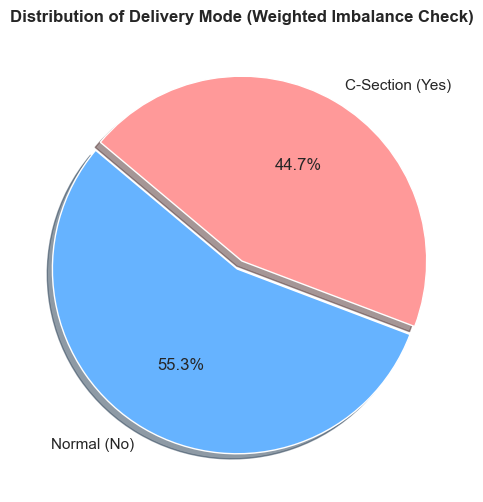

Based on the weighted distribution (44.7% C-section), we consider this dataset is not severely imbalanced.


In [119]:
# 1. Frequency distribution with Weights: Displaying counts and weighted percentages
print("--- Mode of Delivery Distribution (Weighted) ---")

counts = df['Mode_of_Delivery'].value_counts() 

weighted_counts = df.groupby('Mode_of_Delivery')['Sample_Weight'].sum()
total_weight = df['Sample_Weight'].sum()
weighted_percentages = (weighted_counts / total_weight) * 100

imbalance_table = pd.DataFrame({
    'Count (Unweighted)': counts, 
    'Percentage (Weighted %)': weighted_percentages.round(2)
})
print(imbalance_table)

# 2. Visualizing distribution via Pie Chart (Weighted)
plt.figure(figsize=(6, 6), dpi=100)
labels = ['Normal (No)', 'C-Section (Yes)']
colors = ['#66b3ff', '#ff9999']

plt.pie(weighted_percentages, labels=labels, autopct='%1.1f%%', 
        startangle=140, colors=colors, explode=(0.05, 0), shadow=True)

plt.title('Distribution of Delivery Mode (Weighted Imbalance Check)', fontsize=12, fontweight='bold')
plt.show()

# Conclusion regarding dataset balance
print(f"Based on the weighted distribution ({weighted_percentages[1]:.1f}% C-section), we consider this dataset is not severely imbalanced.")

In [120]:
# 1. Missing Value Analysis
# ===============================
print("Checking the Missing Value for all feature:")
# Missing percentage
df.isnull().sum()/df.shape[0]*100

Checking the Missing Value for all feature:


Cluster_Number          0.000000
Household_Number        0.000000
Line_Number             0.000000
Birth_Order             0.000000
Year                    0.000000
Sex                     0.000000
ANC_Visits              5.214781
Place_of_Delivery       0.000000
Mode_of_Delivery        0.000000
Size                    0.000000
Sample_Weight           5.196023
Maternal_Age            5.196023
PSU                     5.196023
Stratum                 5.196023
Region                  5.196023
Place                   5.196023
Maternal_Education      5.196023
Wealth_Index            5.196023
Husband’s_Education     6.077659
Maternal_Employment     5.196023
Husband’s_Occupation    0.919152
Type_of_Birth           0.000000
dtype: float64

In [121]:
# Print status of missing value check after dropping identification columns
print("Check missing value after Dropping this column ['Cluster_Number', 'Household_Number', 'Line_Number']") 

# Print status for data filtration and weight normalization steps
print("dropna(subset=['PSU', 'Stratum', 'Sample_Weight']) and Sample_Weight unit Correction")

# Define the list of redundant identification columns to be removed
cols_to_drop = ['Cluster_Number', 'Household_Number', 'Line_Number']

# Drop the specified columns from the dataframe if they exist
df = df.drop(columns=[col for col in cols_to_drop if col in df.columns])

# Remove observations with missing values in critical survey design variables (PSU, Stratum, and Sample Weight)
df = df.dropna(subset=['PSU', 'Stratum', 'Sample_Weight'])

# Normalize the Sample Weight variable by dividing by the standard scale factor (1,000,000)
# ===============================
df['Sample_Weight'] = df['Sample_Weight'] / 1000000

# Verify the integrity of the dataset by checking for remaining null values across all features
print(df.isnull().sum())

# Display the final dimensions of the cleaned dataset
print("New dataset size:", df.shape)

Check missing value after Dropping this column ['Cluster_Number', 'Household_Number', 'Line_Number']
dropna(subset=['PSU', 'Stratum', 'Sample_Weight']) and Sample_Weight unit Correction
Birth_Order              0
Year                     0
Sex                      0
ANC_Visits               1
Place_of_Delivery        0
Mode_of_Delivery         0
Size                     0
Sample_Weight            0
Maternal_Age             0
PSU                      0
Stratum                  0
Region                   0
Place                    0
Maternal_Education       0
Wealth_Index             0
Husband’s_Education     47
Maternal_Employment      0
Husband’s_Occupation    47
Type_of_Birth            0
dtype: int64
New dataset size: (5054, 19)


In [122]:
# Currection of dtype:
# 1. Convert Year to category
df['Year'] = df['Year'].astype('category')

# 2. Convert Identifiers to Integer (assuming no missing values)
df['Birth_Order'] = df['Birth_Order'].astype(int)

# 3. Handle Maternal_Age (Float to Int)
# Note: Since there are some missing values (5054 non-null out of 5331),
# we use 'Int64' (capital I) which is a nullable integer type.
df['Maternal_Age'] = df['Maternal_Age'].astype('int64')


In [123]:
# Convert categorical text value 'No antenatal visits' to numerical value 0
df['ANC_Visits'] = df['ANC_Visits'].replace('No antenatal visits', 0)

# Handle non-numeric entries (e.g., 'Don't know') by coercing them to NaN (Not a Number)
df['ANC_Visits'] = pd.to_numeric(df['ANC_Visits'], errors='coerce')

# Execute listwise deletion for missing values in the 'ANC_Visits' column 
# This is applied as the missingness is within the acceptable 5% threshold
df = df.dropna(subset=['ANC_Visits'])

# Cast the variable to integer type to ensure compatibility with statistical modeling and visualization
df['ANC_Visits'] = df['ANC_Visits'].astype(int)

In [124]:
print("Duplicate Row Check")
# 2. Duplicate Row Check
# ===============================

df.duplicated().sum()

Duplicate Row Check


np.int64(1)

In [125]:
# Identify and remove duplicate records to ensure data uniqueness and prevent bias
df = df.drop_duplicates()

# "Don't know" কে NaN এ রূপান্তর করা
df['Husband’s_Education'] = df['Husband’s_Education'].replace("Don't know", np.nan)

# 1. Impute missing values for 'Husband’s_Education' based on 'Wealth_Index' groups
# Uses the mode (most frequent value) within each wealth category; defaults to "Secondary" if no mode is found
df['Husband’s_Education'] = df.groupby(['Wealth_Index', 'Region'])['Husband’s_Education'].transform(
    lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Secondary")
)

# 2. Impute missing values for 'Husband’s_Occupation' based on 'Wealth_Index' and 'Region' subgroups
# Uses the most frequent occupation within the specific wealth index and region; defaults to "Agriculture"
df['Husband’s_Occupation'] = df.groupby(['Wealth_Index', 'Region'])['Husband’s_Occupation'].transform(
    lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Agriculture")
)

In [126]:
# Display confirmation of the finalized dataset after data cleaning and duplicate removal
print(" After data cleaning and removing duplicate value clean dataset are:")

# Calculate and display the percentage of missing values for each feature to verify data completeness
print(df.isnull().sum()/df.shape[0]*100)

# Display the final dimensions (rows and columns) of the processed dataframe
print("Now new data shape is:", df.shape)

 After data cleaning and removing duplicate value clean dataset are:
Birth_Order             0.0
Year                    0.0
Sex                     0.0
ANC_Visits              0.0
Place_of_Delivery       0.0
Mode_of_Delivery        0.0
Size                    0.0
Sample_Weight           0.0
Maternal_Age            0.0
PSU                     0.0
Stratum                 0.0
Region                  0.0
Place                   0.0
Maternal_Education      0.0
Wealth_Index            0.0
Husband’s_Education     0.0
Maternal_Employment     0.0
Husband’s_Occupation    0.0
Type_of_Birth           0.0
dtype: float64
Now new data shape is: (5052, 19)


### Phase 2: Exploratory Data Analysis (EDA)
Before modeling, I have conducted extensive univariate analysis to understand the distribution of predictors.

•	Numerical Distribution: I have generated histograms with kernel density estimates (KDE) and descriptive stats (mean, median, min/max) for Maternal_Age, ANC_Visits, and Birth_Order.

•	Categorical Distribution: I have utilized compact grid plots to visualize the frequency and percentage of socio-economic factors such as Wealth_Index, Place, Education, and Employment.

•	Professional Visualization: I have created high-resolution bar charts for key variables like Place_of_Delivery to show the distribution of respondents across facility types.


Distribution check of Maternal_Age, ANC_Visits & Birth_Order


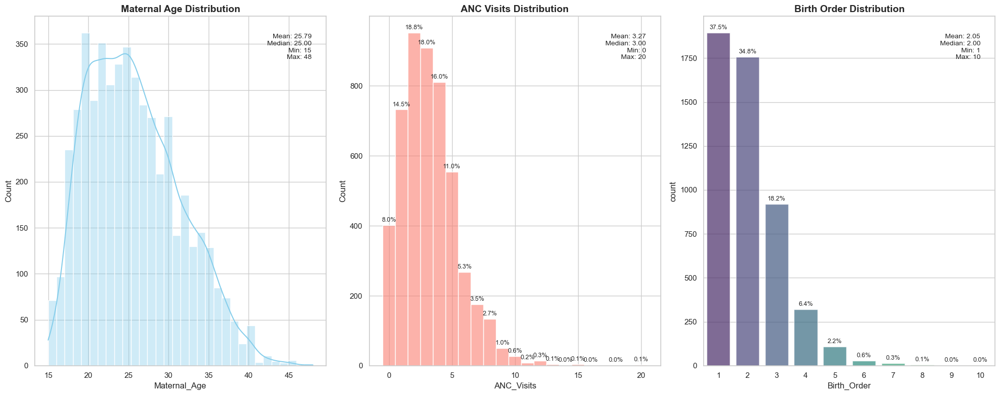

In [127]:
# Exploratory Data Analysis: Visualizing the distribution of key continuous and discrete variables
print("Distribution check of Maternal_Age, ANC_Visits & Birth_Order")

import matplotlib.pyplot as plt
import seaborn as sns

# Initialize the figure with three subplots for a side-by-side comparison
# Set high DPI for publication-quality resolution
fig, axes = plt.subplots(1, 3, figsize=(20, 8), dpi=100)
total = len(df)

# 1. Visualization of Maternal Age Distribution
# Utilizing a histogram with a Kernel Density Estimate (KDE) to visualize the data spread and density
sns.histplot(df['Maternal_Age'], kde=True, ax=axes[0], color='skyblue', alpha=0.4)

# Calculate descriptive statistics for Maternal Age
mu, md = df['Maternal_Age'].mean(), df['Maternal_Age'].median()
mn, mx = df['Maternal_Age'].min(), df['Maternal_Age'].max()
stats_text_0 = f'Mean: {mu:.2f}\nMedian: {md:.2f}\nMin: {mn}\nMax: {mx}'

# Display statistics in the upper-right corner of the plot for easy reference
axes[0].text(0.95, 0.95, stats_text_0, transform=axes[0].transAxes,
             verticalalignment='top', horizontalalignment='right', fontsize=10)
axes[0].set_title('Maternal Age Distribution', fontsize=14, fontweight='bold')

# 2. Visualization of Antenatal Care (ANC) Visits Distribution
# Using a discrete histogram to represent the frequency of ANC visits
sns.histplot(df['ANC_Visits'], discrete=True, ax=axes[1], color='salmon', alpha=0.6)

# Calculate descriptive statistics for ANC Visits
mu1, md1, mx1 = df['ANC_Visits'].mean(), df['ANC_Visits'].median(), df['ANC_Visits'].max()
stats_text_1 = f'Mean: {mu1:.2f}\nMedian: {md1:.2f}\nMin: {df["ANC_Visits"].min()}\nMax: {mx1}'

# Display statistics in the plot area
axes[1].text(0.95, 0.95, stats_text_1, transform=axes[1].transAxes,
             verticalalignment='top', horizontalalignment='right', fontsize=10)

# Annotate each bar with its respective percentage relative to the total dataset
for p in axes[1].patches:
    if p.get_height() > 0:
        axes[1].annotate(f'{100 * p.get_height() / total:.1f}%',
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='baseline', fontsize=9, xytext=(0, 5), textcoords='offset points')
axes[1].set_title('ANC Visits Distribution', fontsize=14, fontweight='bold')

# 3. Visualization of Birth Order Distribution
# Utilizing a countplot to show the frequency of children by birth order
sns.countplot(x='Birth_Order', data=df, ax=axes[2], palette='viridis', alpha=0.7)

# Calculate descriptive statistics for Birth Order
mu2, md2, mx2 = df['Birth_Order'].mean(), df['Birth_Order'].median(), df['Birth_Order'].max()
stats_text_2 = f'Mean: {mu2:.2f}\nMedian: {md2:.2f}\nMin: {df["Birth_Order"].min()}\nMax: {mx2}'

# Display statistics in the plot area
axes[2].text(0.95, 0.95, stats_text_2, transform=axes[2].transAxes,
             verticalalignment='top', horizontalalignment='right', fontsize=10)

# Annotate countplot bars with percentage values
for p in axes[2].patches:
    axes[2].annotate(f'{100 * p.get_height() / total:.1f}%',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='baseline', fontsize=9, xytext=(0, 5), textcoords='offset points')
axes[2].set_title('Birth Order Distribution', fontsize=14, fontweight='bold')

# Adjust layout to prevent overlapping and display the final plots
plt.tight_layout()
plt.show()

Distribution check of categorical variable


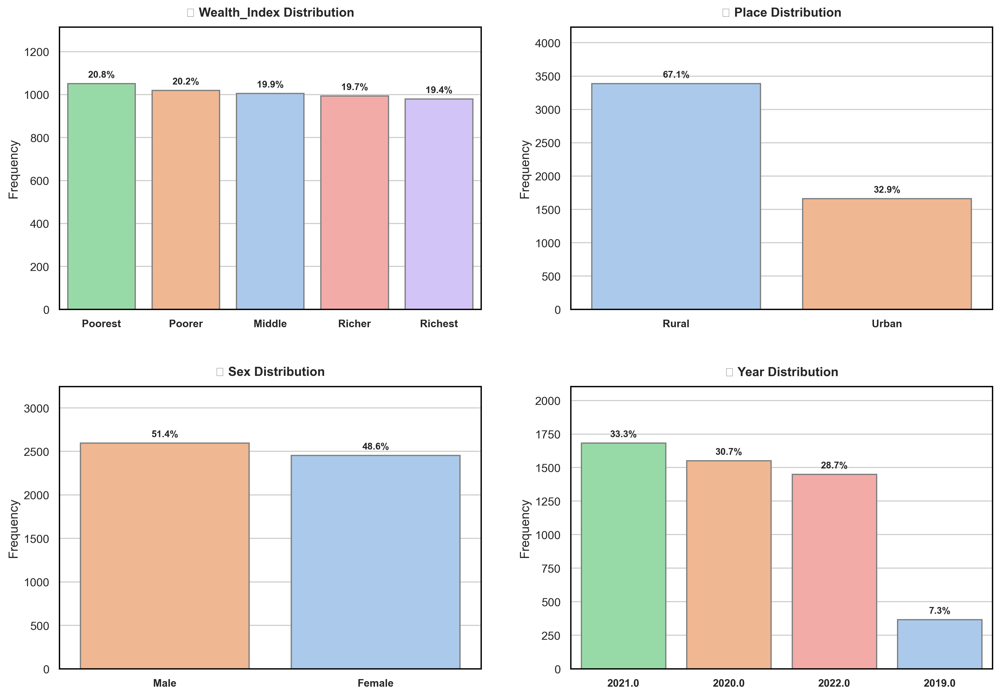

In [128]:
# Distribution check of categorical variables
print("Distribution check of categorical variable")

# Suppress warnings to ensure a clean output in the final report
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

def plot_compact_grid(df, variables, cols=2):
    """
    Generates a professional grid of countplots for categorical variables, 
    including percentage annotations and stylized formatting for reviewers.
    """
    # Calculate the required number of rows based on the number of variables and columns
    rows = (len(variables) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 5))
    axes = axes.flatten()

    for i, column in enumerate(variables):
        ax = axes[i]
        # Calculate frequency counts and identify total non-null observations
        counts = df[column].value_counts(dropna=False)
        total_n = len(df[column].dropna())

        # 1. Visualization: Create countplots with a pastel palette and defined borders
        sns.countplot(data=df, x=column, order=counts.index, palette='pastel',
                        edgecolor='gray', linewidth=1.2, ax=ax, hue=column, legend=False)

        # 2. X-axis Formatting: Adjust tick labels for readability
        ax.set_xticks(range(len(counts.index)))
        if len(counts.index) > 5:
            # Rotate labels for variables with many categories to avoid overlapping
            ax.set_xticklabels(counts.index, rotation=45, ha='right', fontsize=9)
        else:
            # Bold labels for variables with few categories
            ax.set_xticklabels(counts.index, fontsize=10, fontweight='bold')

        # 3. Annotation: Display relative percentages above each bar
        # Adjust Y-axis limit to provide space for text annotations
        ax.set_ylim(0, counts.max() * 1.25)
        for p in ax.patches:
            val = p.get_height()
            if val > 0:
                # Format the percentage string (e.g., '15.5%')
                perc = f'{(val/total_n*100):.1f}%'
                ax.text(p.get_x() + p.get_width()/2, val + (counts.max()*0.02),
                        perc, ha='center', va='bottom',
                        fontweight='bold', fontsize=9)

        # 4. Aesthetics: Apply box borders and descriptive titles for the reviewer
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')

        ax.set_title(f'📊 {column} Distribution', fontsize=12, fontweight='bold', pad=10)
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')

    # Remove any unused subplot axes to maintain a clean layout
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Finalize layout with optimized padding
    plt.tight_layout(pad=3.0)
    plt.show()

# Execution: Define target categorical variables and generate the grid
var_list = ['Wealth_Index', 'Place', 'Sex', 'Year']
plot_compact_grid(df, var_list, cols=2)

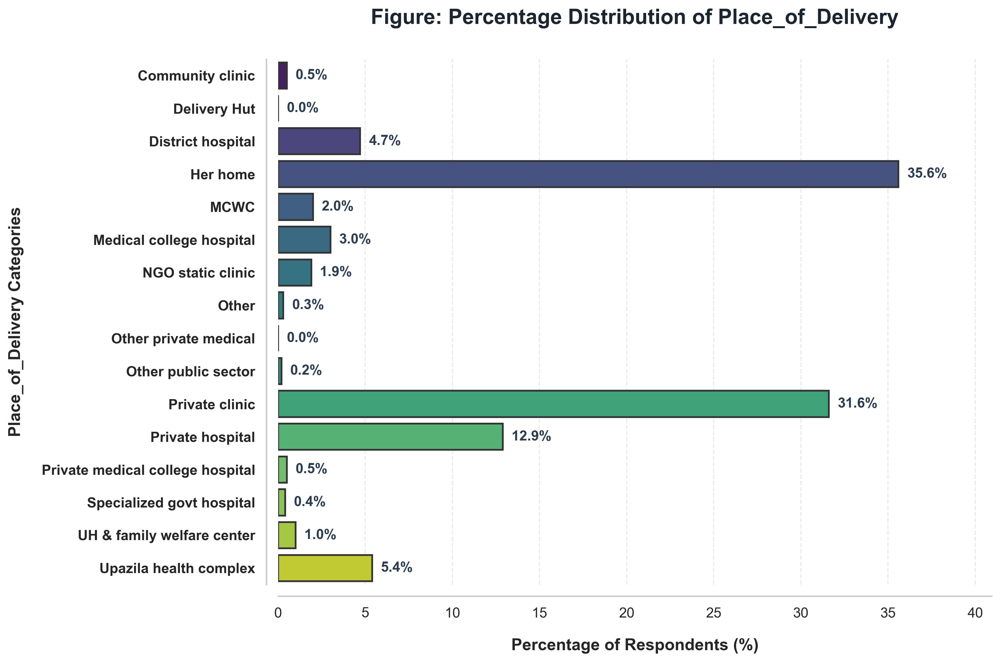

In [129]:
def categorical_large_analysis_pro_v3(df, column):
    # 1. Data Preparation: Calculate percentage distribution for the specified categorical column
    data = df[column].value_counts(normalize=True).mul(100).round(1).reset_index()
    data.columns = [column, 'Percentage']

    # 2. High-Resolution Settings: Ensure clarity for academic publication (300 DPI)
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['font.family'] = 'sans-serif'

    # Initialize the figure with dimensions optimized for a horizontal layout
    fig, ax = plt.subplots(figsize=(12, 8))

    # 3. Data Visualization: Create an aesthetically professional horizontal bar chart
    # Applying the 'viridis' color palette for modern styling and high contrast
    sns.barplot(x='Percentage', y=column, data=data,
                palette='viridis', edgecolor='.2', linewidth=1.5, ax=ax)

    # 4. Annotation: Explicitly label bar widths with percentage values for direct interpretation
    # Adjust the X-axis limit to accommodate text labels beyond the bar lengths
    max_val = data['Percentage'].max()
    ax.set_xlim(0, max_val * 1.15)

    for i, p in enumerate(ax.patches):
        width = p.get_width()
        ax.text(width + 0.5, p.get_y() + p.get_height()/2,
                f'{width}%', va='center', ha='left',
                fontsize=12, fontweight='bold', color='#2C3E50')

    # 5. Titling and Labeling: Formal naming conventions for figure referencing
    ax.set_title(f'Figure: Percentage Distribution of {column}',
                 fontsize=18, fontweight='bold', pad=30, color='#1B2631')
    ax.set_xlabel('Percentage of Respondents (%)', fontsize=14, fontweight='bold', labelpad=15)
    ax.set_ylabel(f'{column} Categories', fontsize=14, fontweight='bold', labelpad=15)

    # 6. Aesthetic Refinement: Remove top and right spines to reduce chart ink and increase clarity
    sns.despine(ax=ax, offset=10, trim=False)
    ax.grid(axis='x', linestyle='--', alpha=0.4)

    # Adjust tick parameters and font weights for enhanced professional readability
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.setp(ax.get_yticklabels(), fontweight="bold")

    # Finalize layout to prevent clipping of labels and display the visualization
    plt.tight_layout()
    plt.show()

# Execution: Run the advanced categorical analysis for 'Place_of_Delivery'
categorical_large_analysis_pro_v3(df, 'Place_of_Delivery')

Outlier Detection for All Numerical Features


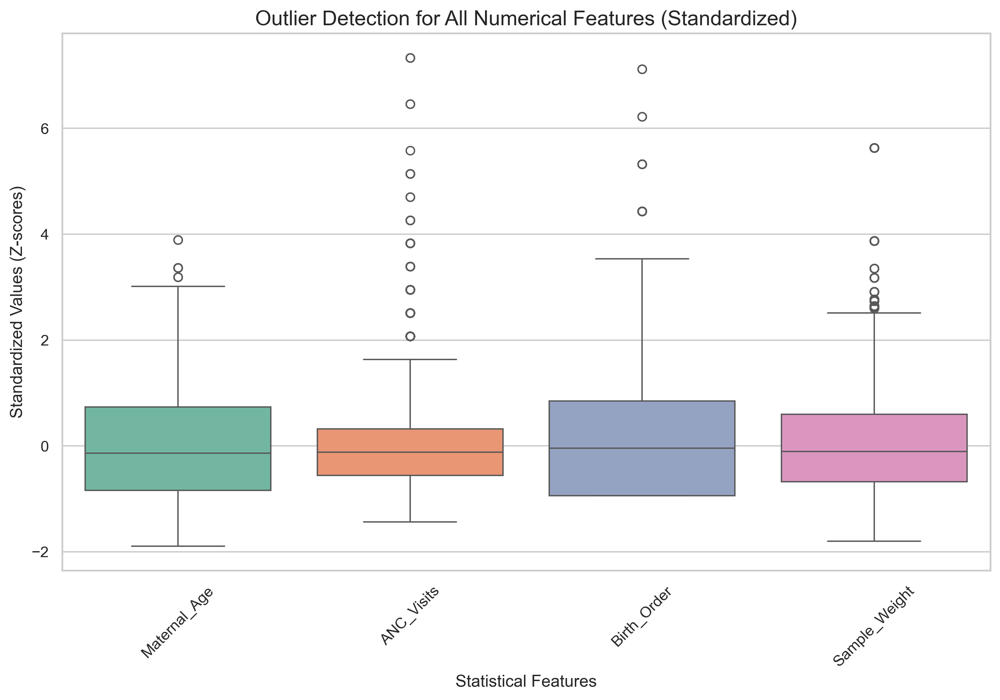

In [130]:
# Outlier Detection for All Numerical Features
print("Outlier Detection for All Numerical Features")

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# 1. Selection of Numerical Features: Identify variables for outlier inspection
# Update the list below based on the final cleaned dataset columns
num_cols = ['Maternal_Age', 'ANC_Visits', 'Birth_Order', 'Sample_Weight']

# 2. Feature Standardization: Scale variables to a mean of 0 and standard deviation of 1
# This ensures that all variables are comparable on the same scale in a single boxplot
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[num_cols]), columns=num_cols)

# 3. Visualization: Create a boxplot for outlier identification
# A standardized boxplot allows for simultaneous detection across features with different units
plt.figure(figsize=(12, 7))
sns.set(style="whitegrid")

# Utilize the 'Set2' color palette for distinct visual separation of features
sns.boxplot(data=df_scaled, palette="Set2")

# Set formal titles and axis labels for academic review
plt.title('Outlier Detection for All Numerical Features (Standardized)', fontsize=15)
plt.ylabel('Standardized Values (Z-scores)', fontsize=12)
plt.xlabel('Statistical Features', fontsize=12)

# Rotate X-axis labels to 45 degrees to ensure readability of feature names
plt.xticks(rotation=45)

# Display the final visualization
plt.show()

In [131]:
# Print status for feature engineering and variable categorization
print("Variable grouping/binning for better analysis and easy to interpretation")

# --- 1. Categorization of Antenatal Care (ANC) Visits ---
# Grouping continuous visit counts into clinically significant ordinal categories
def anc_group_label(x):
    if x == 0:
        return 'No ANC Visits'
    elif 1 <= x <= 3:
        return '1-3 visits'
    elif x >= 4:
        # 4+ visits is often a key threshold in maternal health policy (WHO guidelines)
        return '4+ visits'
    else:
        return 'No ANC Visits'

# --- 2. Classification of Delivery Location ---
# Aggregating specific facilities into broader Public, Private, and Home sectors
def delivery_place_group_label(x):
    home_labels = ['Her home', 'Home']
    public_labels = [
        'Medical college hospital', 'Specialized govt hospital',
        'District hospital', 'MCWC', 'Upazila health complex',
        'Other public sector', 'UH & family welfare center', 'Community clinic'
    ]
    private_labels = [
        'Private medical college hospital', 'Private hospital', 
        'Private clinic', 'Other private medical'
    ]

    if x in home_labels: return 'Home'
    elif x in public_labels: return 'Public'
    elif x in private_labels: return 'Private'
    else: return 'NGO/Other'

# --- 3. Categorization of Birth Type ---
# Binary classification for single vs. multiple births
def birth_type_group_label(x):
    if x == 'Single birth':
        return 'Single Birth'
    else:
        return 'Multiple Birth'

# --- 4. Grouping of Paternal (Husband's) Occupation ---
# Mapping specific job titles into major socioeconomic occupational sectors
def husband_occ_group_label(x):
    prof_serv = ['Professional/technical/managerial','Clerical','Sales','Services']
    agri = ['Agricultural - self employed','Agricultural - employee']
    manual = ['Skilled manual','Unskilled manual']

    if x in prof_serv: return 'Professional/Services'
    elif x in agri: return 'Agricultural'
    elif x in manual: return 'Manual'
    elif x == 'Household and domestic': return 'Household and domestic'
    else: return 'Unemployed/Other'

# --- 5. Assessment of Perceived Child Size ---
# Simplify child size categories for robust statistical comparison
def size_group_label(x):
    if x in ['Very large','Larger than average']: return 'Larger than Average'
    elif x == 'Average': return 'Average'
    else: return 'Smaller than Average'

# --- 6. Binning of Maternal Age ---
# Segmenting age into life-stage categories relevant to reproductive health risks
def maternal_age_group_label(x):
    if x < 20: return '<20 years'
    elif 20 <= x <= 24: return '20-24 years'
    elif 25 <= x <= 34: return '25-34 years'
    else: return '35+ years'

# --- 7. Categorization of Birth Order ---
# Converting numerical birth order into descriptive ordinal categories
def birth_order_group_label(x):
    if x == 1:
        return 'Firstborn'
    elif x == 2:
        return 'Secondborn'
    elif x == 3:
        return 'Thirdborn'
    else:
        return 'Fourth+'

# --- Feature Engineering Implementation ---
# Applying the mapping functions to create new analytical columns in the dataframe
df['ANC_Group'] = df['ANC_Visits'].apply(anc_group_label)
df['Delivery_Group'] = df['Place_of_Delivery'].apply(delivery_place_group_label)
df['Birth_Type_Group'] = df['Type_of_Birth'].apply(birth_type_group_label)
df['Husband_Occ_Group'] = df['Husband’s_Occupation'].apply(husband_occ_group_label)
df['Child_Size_Group'] = df['Size'].apply(size_group_label)
df['Maternal_Age_Group'] = df['Maternal_Age'].apply(maternal_age_group_label)
df['Birth_Order_Group'] = df['Birth_Order'].apply(birth_order_group_label)

# --- Verification ---
# Display the first five rows of the newly generated categorical features for quality assurance
df[['ANC_Group','Delivery_Group','Birth_Type_Group',
          'Husband_Occ_Group','Child_Size_Group','Maternal_Age_Group',
          'Birth_Order_Group']].head(5)

Variable grouping/binning for better analysis and easy to interpretation


,ANC_Group,Delivery_Group,Birth_Type_Group,Husband_Occ_Group,Child_Size_Group,Maternal_Age_Group,Birth_Order_Group
0,4+ visits,Private,Single Birth,Professional/Services,Average,35+ years,Thirdborn
1,1-3 visits,Public,Single Birth,Manual,Average,<20 years,Firstborn
2,4+ visits,Private,Single Birth,Professional/Services,Average,25-34 years,Firstborn
3,4+ visits,Public,Single Birth,Unemployed/Other,Average,25-34 years,Secondborn
4,4+ visits,Private,Single Birth,Professional/Services,Average,20-24 years,Firstborn


In [132]:
# Generate and display a summary frequency table for all newly binned categorical variables
print("summary table of grouping variable")

# Define the list of engineered categorical features to be summarized
group_cols = ['ANC_Group', 'Delivery_Group', 'Birth_Type_Group',
              'Husband_Occ_Group', 'Child_Size_Group', 'Maternal_Age_Group',
              'Birth_Order_Group']

# 1. Initialize a list to aggregate statistical data for each variable
summary_list = []

for col in group_cols:
    # Calculate absolute frequencies (N) and relative percentages (%) for each category
    # dropna=False ensures any potential missing values are accounted for in the summary
    counts = df[col].value_counts(dropna=False)
    percentages = (df[col].value_counts(normalize=True, dropna=False) * 100).round(2)

    # Iterate through each unique category to structure the data for the final table
    for category in counts.index:
        summary_list.append({
            'Variable': col,
            'Category': category,
            'Frequency (N)': counts[category],
            'Percentage (%)': percentages[category]
        })

# 2. Construct a structured DataFrame from the aggregated list for easier manipulation and reporting
summary_table = pd.DataFrame(summary_list)

# 3. Output the summary table to the console in a clean, string-formatted layout
# This provides a comprehensive overview of the distribution across all grouped factors
print(summary_table.to_string(index=False))

# For an enhanced visual representation within a Jupyter Notebook environment:
# display(summary_table)

summary table of grouping variable
          Variable               Category  Frequency (N)  Percentage (%)
         ANC_Group             1-3 visits           2591           51.29
         ANC_Group              4+ visits           2059           40.76
         ANC_Group          No ANC Visits            402            7.96
    Delivery_Group                Private           2273           44.99
    Delivery_Group                   Home           1797           35.57
    Delivery_Group                 Public            868           17.18
    Delivery_Group              NGO/Other            114            2.26
  Birth_Type_Group           Single Birth           5000           98.97
  Birth_Type_Group         Multiple Birth             52            1.03
 Husband_Occ_Group  Professional/Services           2481           49.11
 Husband_Occ_Group                 Manual           1530           30.29
 Husband_Occ_Group           Agricultural            922           18.25
 Husband_Occ_Gro

In [133]:
# Convert the newly created grouped variables into categorical data types
# This optimization reduces memory usage and improves performance for statistical modeling
for col in group_cols:
    df[col] = df[col].astype('category')

# Explicitly define the list of engineered categorical features for subsequent analysis
group_cols = ['ANC_Group', 'Delivery_Group', 'Birth_Type_Group',
              'Husband_Occ_Group', 'Child_Size_Group', 'Maternal_Age_Group',
              'Birth_Order_Group']

In [135]:
print("Descriptive Statistics Table for Weighted univariate analysis")

summary_list = []

cols = [
    'Mode_of_Delivery',
    'Wealth_Index',
    'Maternal_Education',
    'Husband’s_Education',
    'Maternal_Employment',
    'Husband_Occ_Group',
    'Maternal_Age_Group',                
    'Birth_Order_Group',
    'Birth_Type_Group',
    'ANC_Group',
    'Delivery_Group',
    'Region',
    'Place',
    'Sex',
    'Year', 
    'Child_Size_Group'
]

total_sample_weight = df['Sample_Weight'].sum()

for col in cols:
    counts = df[col].value_counts(dropna=False)

    weighted_counts = df.groupby(col, dropna=False)['Sample_Weight'].sum()

    for category in counts.index:
        w_n = weighted_counts.get(category, 0)
        weighted_percentage = (w_n / total_sample_weight * 100).round(2)

        summary_list.append({
            'Variable': col,
            'Category': category,
            'Frequency (N)': counts[category], 
            'Percentage (%)': weighted_percentage # Weighted Percentage
        })

descriptive_table = pd.DataFrame(summary_list)

descriptive_table = descriptive_table.sort_values(by=['Variable'])

print(descriptive_table.to_string(index=False))

Descriptive Statistics Table for Weighted univariate analysis
           Variable               Category  Frequency (N)  Percentage (%)
          ANC_Group          No ANC Visits            402            7.94
          ANC_Group              4+ visits           2059           39.59
          ANC_Group             1-3 visits           2591           52.47
  Birth_Order_Group              Thirdborn            920           18.68
  Birth_Order_Group                Fourth+            483            9.48
  Birth_Order_Group             Secondborn           1756           33.98
  Birth_Order_Group              Firstborn           1893           37.86
   Birth_Type_Group         Multiple Birth             52            0.95
   Birth_Type_Group           Single Birth           5000           99.05
   Child_Size_Group                Average           3876           76.44
   Child_Size_Group   Smaller than Average            680           14.08
   Child_Size_Group    Larger than Average        

In [136]:
# Feature Selection for Model Training
# Selecting specific independent variables based on domain knowledge and maternal health research frameworks
print(" Feature selection for model training using domain knowledge")

# Define the curated list of predictor variables and the target variable for the machine learning model
# This selection includes socio-demographic, clinical, and geographical factors
final_features = [
    'ANC_Group',              # Categorical: Number of ANC visits
    'Delivery_Group',         # Categorical: Location of delivery (Public/Private/Home)
    'Husband_Occ_Group',      # Categorical: Paternal occupation category
    'Husband’s_Education',    # Categorical: Paternal education level
    'Maternal_Age_Group',     # Categorical: Age of the mother at birth
    'Birth_Order_Group',      # Categorical: Birth rank of the child
    'Child_Size_Group',       # Categorical: Perceived size of the child
    'Place',                  # Categorical: Type of place of residence (Urban/Rural)
    'Year',                   # Categorical/Ordinal: Survey year
    'Sex',                    # Categorical: Sex of the child
    'Region',                 # Categorical: Geographical division
    'Maternal_Education',     # Categorical: Maternal education level
    'Maternal_Employment',    # Categorical: Employment status of the mother
    'Wealth_Index',           # Categorical: Socioeconomic status
    'Mode_of_Delivery'        # Target Variable: Outcome of interest (e.g., C-section vs. Vaginal)
]

# Create a dedicated dataframe for modeling by subsetting the original dataset
# Using .copy() ensures that modifications to df_model do not affect the source dataframe
df_model = df[final_features].copy()

# Verify the data types to ensure all selected features are correctly identified as categorical
# This is crucial for models that handle categorical inputs or for subsequent encoding steps
print(df_model.dtypes)

 Feature selection for model training using domain knowledge
ANC_Group              category
Delivery_Group         category
Husband_Occ_Group      category
Husband’s_Education    category
Maternal_Age_Group     category
Birth_Order_Group      category
Child_Size_Group       category
Place                  category
Year                   category
Sex                    category
Region                 category
Maternal_Education     category
Maternal_Employment    category
Wealth_Index           category
Mode_of_Delivery       category
dtype: object


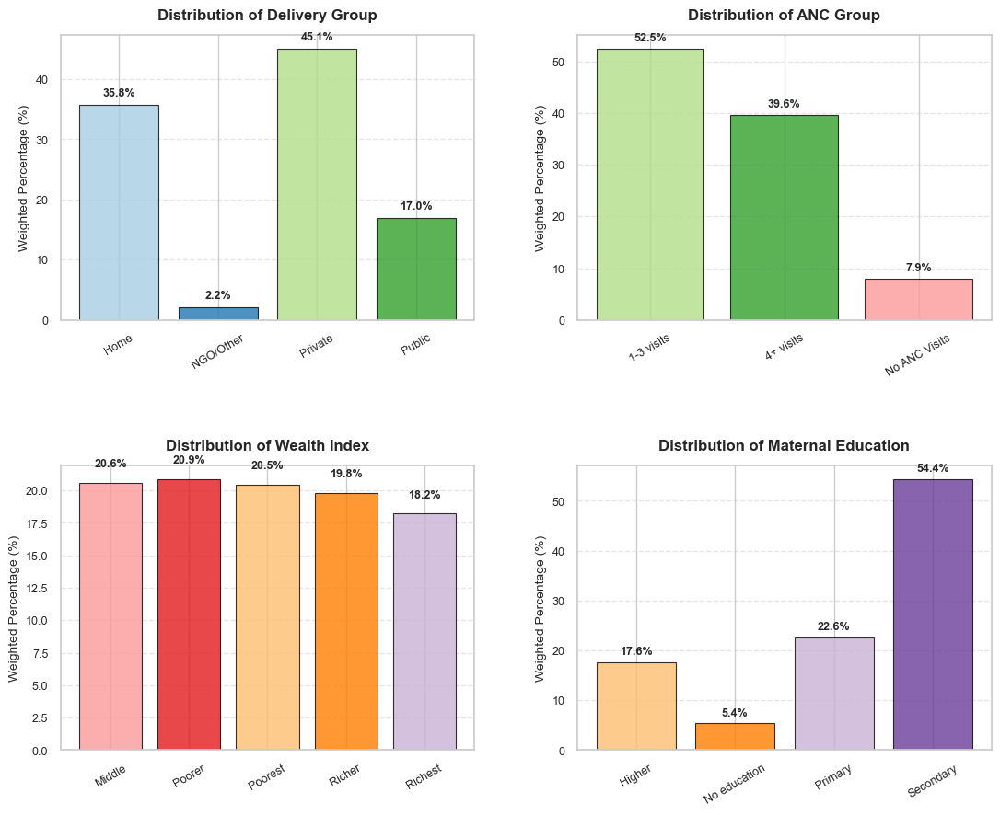

In [137]:
def plot_weighted_distribution_grid(df, variables, weight_col='Sample_Weight'):

    fig, axes = plt.subplots(2, 2, figsize=(12, 10), dpi=100)
    axes = axes.flatten()
    
    colors = plt.cm.Paired.colors
    total_weight = df[weight_col].sum()

    for i, var in enumerate(variables[:4]):
        ax = axes[i]

        weighted_counts = df.groupby(var)[weight_col].sum().sort_index()
        percent = (weighted_counts / total_weight) * 100

        bars = ax.bar(percent.index.astype(str), percent.values, 
                      color=colors[i*2:(i*2)+len(percent)], 
                      edgecolor='black', alpha=0.8, linewidth=0.8)

        ax.set_title(f"Distribution of {var.replace('_', ' ')}", fontsize=12, fontweight='bold', pad=12)
        ax.set_ylabel("Weighted Percentage (%)", fontsize=10)
        ax.tick_params(axis='x', rotation=30, labelsize=9)
        ax.tick_params(axis='y', labelsize=9)

        ax.yaxis.grid(True, linestyle='--', alpha=0.5)
        ax.set_axisbelow(True)

        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{height:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='semibold')

    plt.tight_layout(pad=4.0)
    plt.show()
important_vars = ["Delivery_Group", "ANC_Group", "Wealth_Index", "Maternal_Education"]
plot_weighted_distribution_grid(df, important_vars)

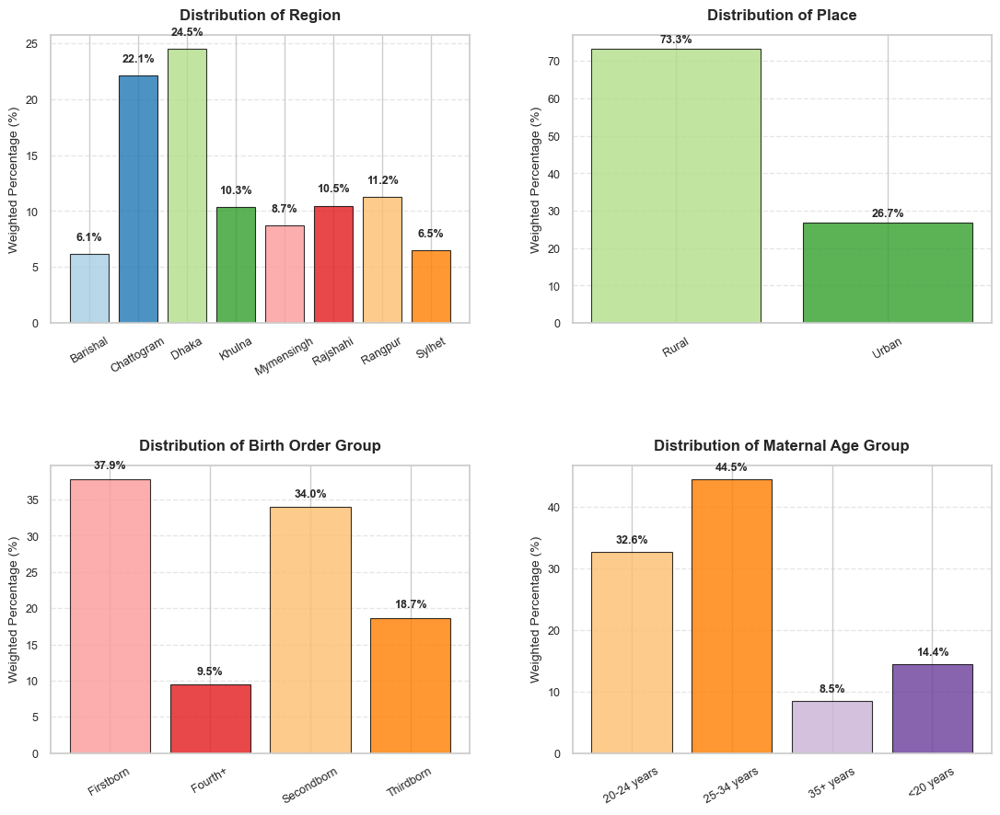

In [138]:
important_vars = ["Region", "Place","Birth_Order_Group","Maternal_Age_Group"]
plot_weighted_distribution_grid(df, important_vars)

### Phase 4: Bivariate and Multivariable Association Analysis
This phase focused on the statistical relationships between predictors and delivery mode.

•	Correlation Heatmaps: I have calculated Cramer’s V for categorical features to identify multi-collinearity and overall association strength with the target variable.

•	Chi-square Testing: I have performed Chi-square tests of association for all key socio-economic factors, documenting p-values and significance levels (Sig. vs. Non-sig.). 

•	Flow and Hierarchical Analysis: I have used Parallel Categories Plots and Sunburst Charts to visualize the multi-dimensional flow of respondents through factors like ANC, education, and delivery type.

•	Clinical Filtering: I have generated a refined bivariate table specifically excluding "Home" deliveries to focus on facility-based outcomes.


Calculating Weighted Cramer's V matrix... Please wait.


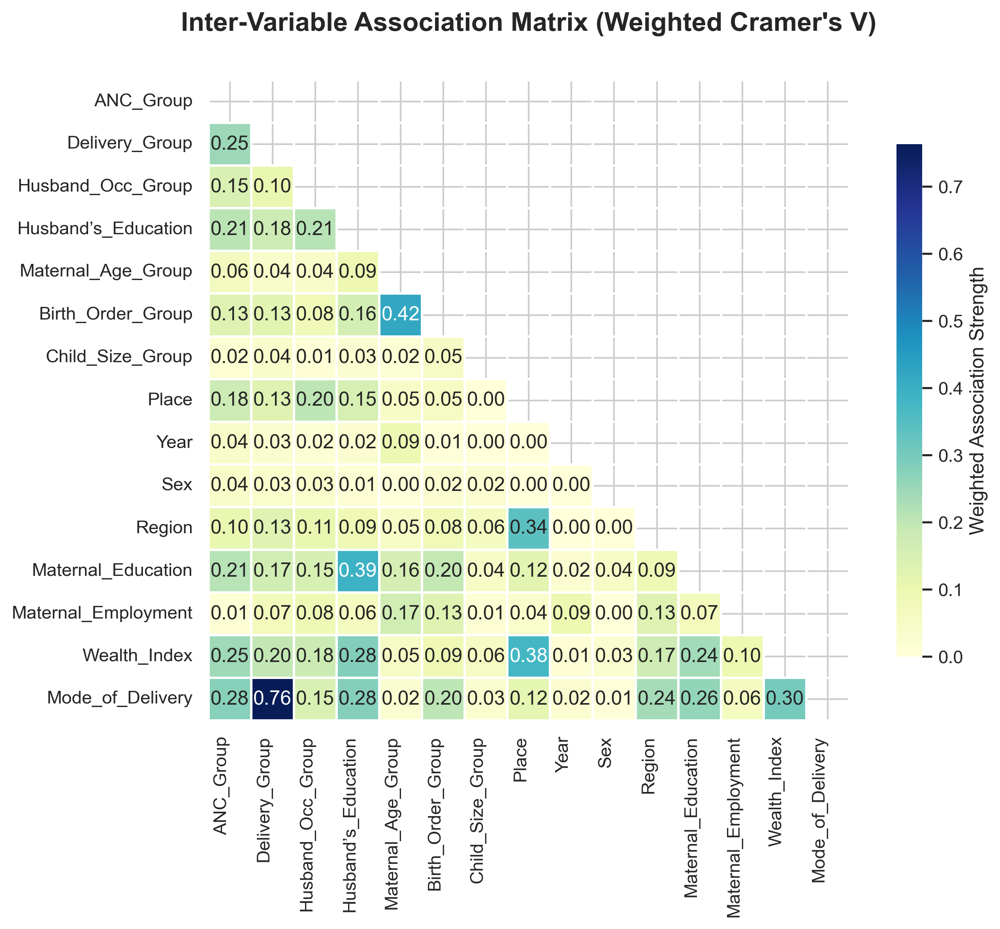

In [139]:
def cramers_v_weighted(x, y, weights):

    df_temp = pd.DataFrame({'x': x, 'y': y, 'w': weights})
    confusion_matrix = df_temp.groupby(['x', 'y'], observed=True)['w'].sum().unstack().fillna(0)
    
    # ২. Chi-square calculation
    if confusion_matrix.empty:
        return 0.0
        
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = weights.sum()
    
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    
    # ৩. Bias Correction
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    denominator = min((kcorr-1), (rcorr-1))
    if denominator <= 0:
        return 0.0
        
    return np.sqrt(phi2corr / denominator)

def plot_weighted_cramers_heatmap(df, weight_col='Sample_Weight'):

    weights = df[weight_col]
    cols = [c for c in df.columns if c != weight_col]
    n = len(cols)
    
    matrix = np.zeros((n, n))

    print("Calculating Weighted Cramer's V matrix... Please wait.")
    for i in range(n):
        for j in range(n):
            if i == j:
                matrix[i, j] = 1.0
            else:
                matrix[i, j] = cramers_v_weighted(df[cols[i]], df[cols[j]], weights)

    v_matrix_df = pd.DataFrame(matrix, index=cols, columns=cols)

    plt.figure(figsize=(10, 8), dpi=300)
    mask = np.triu(np.ones_like(v_matrix_df, dtype=bool))

    sns.heatmap(v_matrix_df, mask=mask, annot=True, fmt=".2f", cmap='YlGnBu',
                linewidths=1, linecolor='white', square=True,
                cbar_kws={"shrink": .8, "label": "Weighted Association Strength"})

    plt.title("Inter-Variable Association Matrix (Weighted Cramer's V)",
              fontsize=16, fontweight='bold', pad=30)

    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()

# --- Execution ---
if 'Sample_Weight' not in df_model.columns:
    df_model['Sample_Weight'] = df['Sample_Weight']

plot_weighted_cramers_heatmap(df_model)

Annotated Heatmap (Weighted for Survey Design)


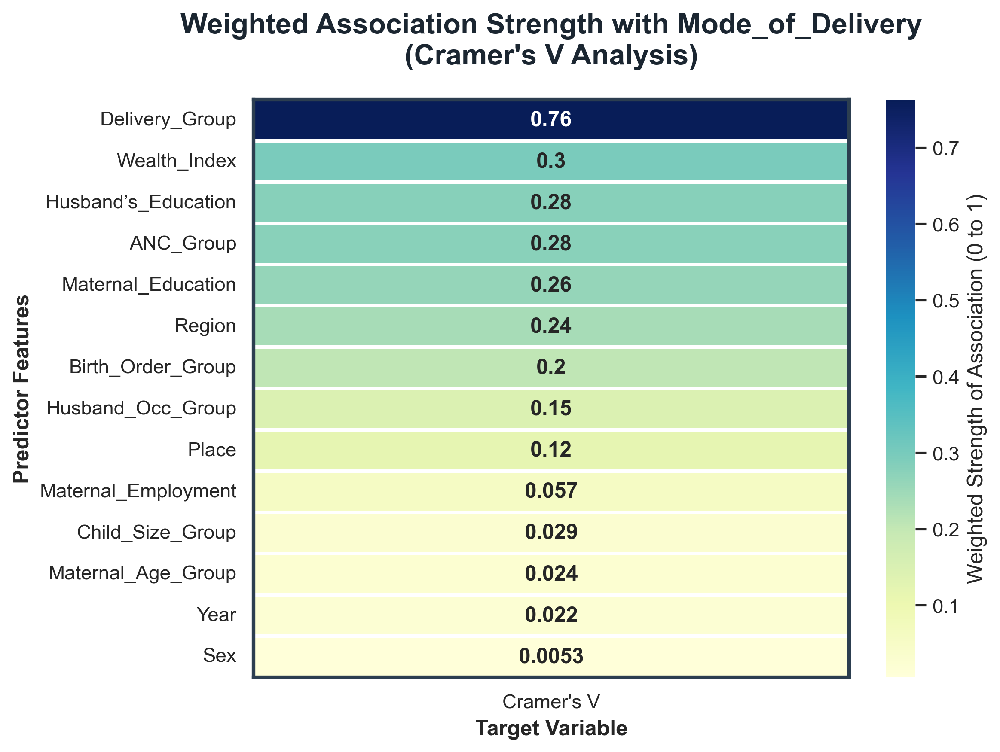

In [140]:
# Annotated Heatmap showing the strength of association with the target variable
print("Annotated Heatmap (Weighted for Survey Design)")
from scipy.stats import chi2_contingency

def calculate_cramers_v_matrix(df, target_col):
    """
    Weighted Cramer's V calculation between target and predictors.
    """
    results = []
    features = [col for col in df.columns if col not in [target_col, 'Sample_Weight']]

    for col in features:

        confusion_matrix = pd.crosstab(
            df[col], 
            df[target_col], 
            values=df['Sample_Weight'], 
            aggfunc='sum'
        ).fillna(0)

        # ২. Chi-square calculation
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum().sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape

        # ৩. Bias Correction (Bergsma and Wicher, 2013)
        phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
        rcorr = r - ((r-1)**2)/(n-1)
        kcorr = k - ((k-1)**2)/(n-1)

        # ৪. Final Coefficient calculation
        denominator = min((kcorr-1), (rcorr-1))
        if denominator <= 0:
            v = 0.0
        else:
            v = np.sqrt(phi2corr / denominator)
            
        results.append({'Feature': col, "Cramer's V": round(v, 4)})

    return pd.DataFrame(results).sort_values(by="Cramer's V", ascending=False)

def plot_association_heatmap(df, target_col):
    """
    Weighted Cramer's V Heatmap জেনারেট করার ফাংশন।
    """
    # ১. Data Processing: Weighted association metrics জেনারেট করা
    v_df = calculate_cramers_v_matrix(df, target_col)
    v_df = v_df.set_index('Feature')

    # ২. Figure Settings
    plt.figure(figsize=(8, 6), dpi=300)

    # ৩. Visualization
    sns.heatmap(v_df, annot=True, cmap='YlGnBu', 
                cbar_kws={'label': "Weighted Strength of Association (0 to 1)"},
                linewidths=1.5, linecolor='white', 
                annot_kws={"size": 12, "weight": "bold"})

    # ৪. Title & Labeling
    plt.title(f"Weighted Association Strength with {target_col}\n(Cramer's V Analysis)",
              fontsize=16, fontweight='bold', pad=20, color='#1B2631')
    plt.xlabel("Target Variable", fontweight='bold')
    plt.ylabel("Predictor Features", fontweight='bold')

    # ৫. Frame Styling
    for spine in plt.gca().spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_color('#2C3E50')

    plt.tight_layout()
    plt.show()

# --- Execution ---
plot_association_heatmap(df_model, 'Mode_of_Delivery')

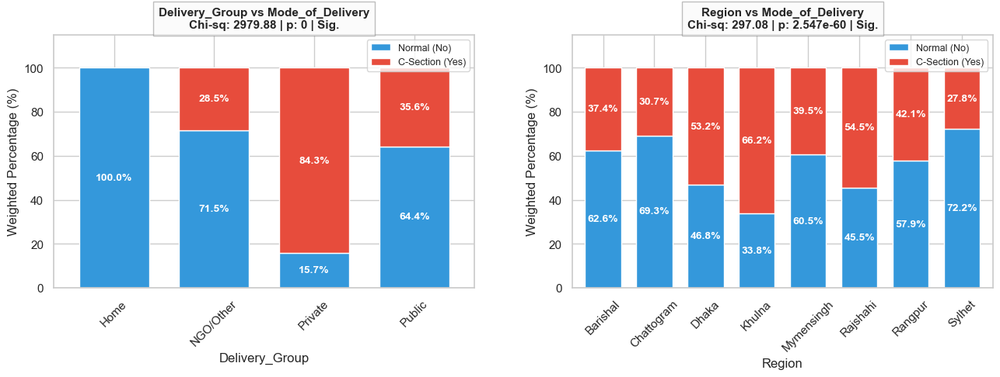

In [141]:
def plot_weighted_bivariate_analysis(df, selected_vars, target="Mode_of_Delivery", weight_col="Sample_Weight"):
 
    n_vars = len(selected_vars)
    n_cols = 2
    n_rows = math.ceil(n_vars / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 6 * n_rows), dpi=100)
    
    if n_vars > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    for i, var in enumerate(selected_vars):
        ax = axes[i]
        
        # ১. Weighted Contingency Table
        df_temp = df[[var, target, weight_col]].dropna()
        weighted_ct = df_temp.groupby([var, target], observed=True)[weight_col].sum().unstack().fillna(0)
        
        chi2, p, dof, ex = chi2_contingency(weighted_ct)
        status = "Sig." if p < 0.05 else "Non-sig."
        
        weighted_pct = weighted_ct.div(weighted_ct.sum(axis=1), axis=0) * 100
        
       weighted_pct.plot(kind='bar', stacked=True, ax=ax, color=['#3498db', '#e74c3c'], edgecolor='white', width=0.7)
        
        for container in ax.containers:
            labels = [f'{v.get_height():.1f}%' if v.get_height() > 0 else '' for v in container]
            ax.bar_label(container, labels=labels, label_type='center', 
                         color='white', fontweight='bold', fontsize=10)
        
        stats_line = f"Chi-sq: {chi2:.2f} | p: {p:.4g} | {status}"
        
        ax.set_title(f"{var} vs {target}\n{stats_line}", fontsize=11, fontweight='bold', 
                     bbox=dict(facecolor='#f9f9f9', edgecolor='gray', alpha=0.5, pad=5))
        
        ax.set_ylabel("Weighted Percentage (%)")
        ax.set_xlabel(var)
        ax.legend(["Normal (No)", "C-Section (Yes)"], loc='upper right', fontsize=9)
        
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(0, 115) 

    if n_vars > 1:
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout(pad=4.0)
    plt.show()

# --- Execution ---
two_features = ["Delivery_Group", "Region"] 
plot_weighted_bivariate_analysis(df_model, two_features)

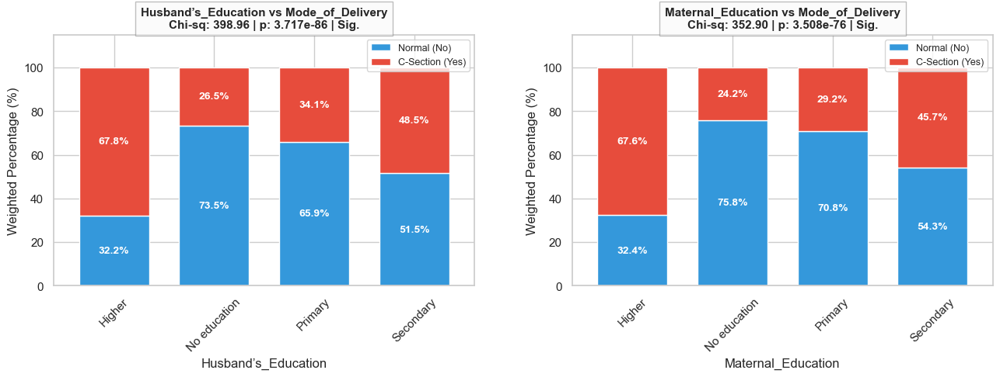

In [142]:
# --- ব্যবহার করার নিয়ম (Execution) ---
# আপনি যে ২ টি ফিচার দেখতে চান তার নাম এখানে দিন
two_features = ["Husband’s_Education", "Maternal_Education"] 
plot_weighted_bivariate_analysis(df, two_features)

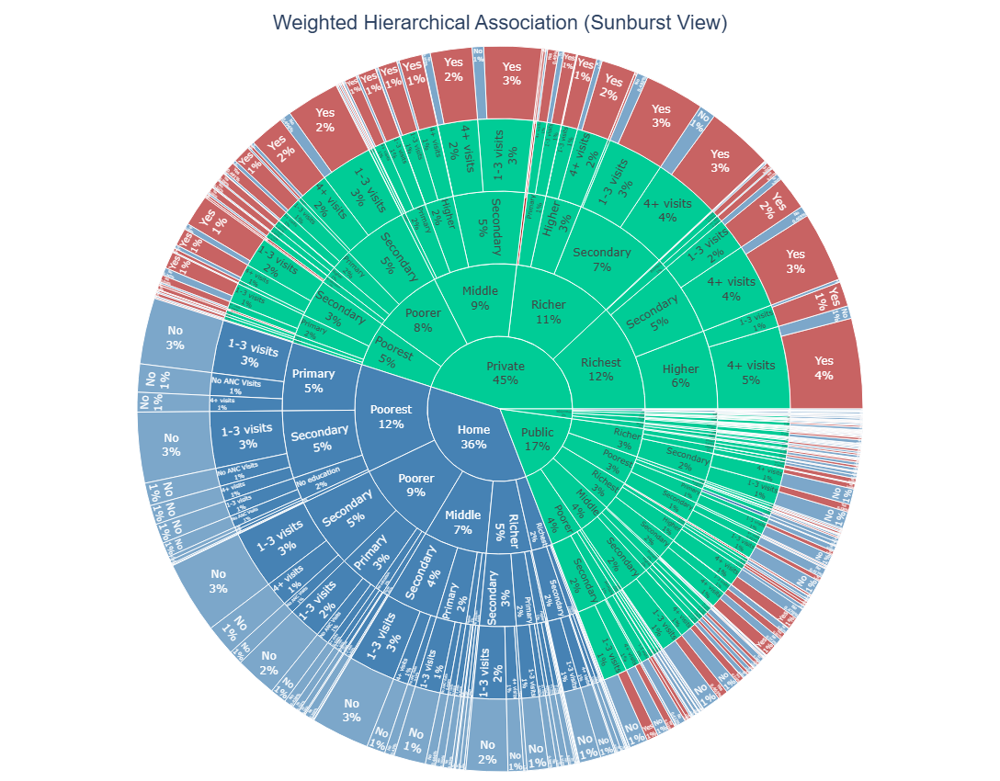

In [144]:
import plotly.express as px
top_features = ['Delivery_Group', 'Wealth_Index', 'Maternal_Education', 'ANC_Group', 'Mode_of_Delivery']

df_sun = df[top_features + ['Sample_Weight']].dropna().copy()

for col in top_features:
    df_sun[col] = df_sun[col].astype(str)

# ৩. Visualization Construction (Weighted)
fig_sunburst = px.sunburst(
    df_sun,
    path=top_features,
    values='Sample_Weight',
    color='Mode_of_Delivery',
    color_discrete_map={'Yes': 'firebrick', 'No': 'steelblue'},
    branchvalues='total' 
)

# ৪. Layout Refinement
fig_sunburst.update_layout(
    title={
        'text': "Weighted Hierarchical Association (Sunburst View)",
        'y':0.98,
        'x':0.5,
        'xanchor': 'center',
        'font': {'size': 22, 'family': "Arial"}
    },
    height=850,
    margin=dict(t=50, l=10, r=10, b=10)
)

fig_sunburst.update_traces(textinfo="label+percent entry")

fig_sunburst.show()

In [145]:
from scipy.stats import chi2_contingency

# ==========================================================
# Weighted Frequency Distribution & Bivariate Analysis (Total Population)
# ==========================================================
print("Weighted Frequency Distribution & Bivariate Analysis")

df_full = df_model.copy() 

if 'Sample_Weight' not in df_full.columns:
    df_full['Sample_Weight'] = df.loc[df_full.index, 'Sample_Weight']

def create_final_bivariate_table_weighted_full(df, target_col, weight_col='Sample_Weight'):

    final_rows = []
    features = [col for col in df.columns if col not in [target_col, weight_col]]

    for col in features:
        try:
            ct = df.groupby([col, target_col], observed=True)[weight_col].sum().unstack().fillna(0)
            
            # Row-wise normalization (Weighted Percentage)
            ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100

            # Weighted Chi-square Test
            chi2, p, dof, ex = chi2_contingency(ct)

            # Significance thresholds
            if p < 0.001: sig_label = "Highly Significant (***)"
            elif p < 0.01: sig_label = "Significant (**)"
            elif p < 0.05: sig_label = "Significant (*)"
            else: sig_label = "Not Significant (ns)"

            first_row = True
            for category in ct.index:
                normal_key = 0 if 0 in ct.columns else ('No' if 'No' in ct.columns else ct.columns[0])
                csect_key = 1 if 1 in ct.columns else ('Yes' if 'Yes' in ct.columns else ct.columns[1])
                
                row_data = {
                    'Variables': col if first_row else "",
                    'Categories': category,
                    'Normal (Weighted n)': f"{ct.loc[category, normal_key]:.1f}",
                    'Normal (%)': f"{ct_pct.loc[category, normal_key]:.1f}%",
                    'C-section (Weighted n)': f"{ct.loc[category, csect_key]:.1f}",
                    'C-section (%)': f"{ct_pct.loc[category, csect_key]:.1f}%",
                    'Chi-Sq ($\chi^2$)': f"{chi2:.2f}" if first_row else "",
                    'p-value': f"{p:.4f}" if first_row else "",
                    'Significance': sig_label if first_row else ""
                }
                final_rows.append(row_data)
                first_row = False
        except Exception as e:
            print(f"Skipping column {col} due to error: {e}")
            continue

    return pd.DataFrame(final_rows)

bivariate_stats_full_df = create_final_bivariate_table_weighted_full(df_full, 'Mode_of_Delivery')

display(bivariate_stats_full_df)

# bivariate_stats_full_df.to_csv('Full_Population_Bivariate_Analysis.csv', index=False)

Weighted Frequency Distribution & Bivariate Analysis


,Variables,Categories,Normal (Weighted n),Normal (%),C-section (Weighted n),C-section (%),Chi-Sq ($\chi^2$),p-value,Significance
0,ANC_Group,1-3 visits,1632.3,60.8%,1051.4,39.2%,391.77,0.0000,Highly Significant (***)
1,,4+ visits,833.9,41.2%,1190.9,58.8%,,,
2,,No ANC Visits,364.5,89.8%,41.5,10.2%,,,
3,Delivery_Group,Home,1829.4,100.0%,0.0,0.0%,2979.88,0.0000,Highly Significant (***)
4,,NGO/Other,79.3,71.5%,31.5,28.5%,,,
5,,Private,362.7,15.7%,1942.4,84.3%,,,
6,,Public,559.5,64.4%,309.8,35.6%,,,
7,Husband_Occ_Group,Agricultural,631.1,66.6%,317.0,33.4%,113.84,0.0000,Highly Significant (***)
8,,Household and domestic,3.6,60.1%,2.4,39.9%,,,
9,,Manual,933.5,60.1%,619.2,39.9%,,,


In [146]:
from scipy.stats import chi2_contingency

# ==========================================================
# Feature Importance: Weighted Chi-square & Cramer's V (Full Dataset)
# ==========================================================
print("Feature Importance: Weighted Chi-square & Cramer's V")

def perform_categorical_tests_full(df, target_col, weight_col='Sample_Weight'):
    """
    Weighted Chi-Square and Cramer's V 
    """
    results = []
    features = [col for col in df.columns if col not in [target_col, weight_col]]

    for col in features:
        try:
            ct = df.groupby([col, target_col], observed=True)[weight_col].sum().unstack().fillna(0)

            # ২. Weighted Chi-Square Test
            chi2, p, dof, ex = chi2_contingency(ct)

            # ৩. Cramer's V Calculation (Weighted)
            n_weighted = ct.to_numpy().sum() 
            r, k = ct.shape
            min_dim = min(r - 1, k - 1)
            
            if min_dim > 0 and n_weighted > 0:
                v = np.sqrt(chi2 / (n_weighted * min_dim))
            else:
                v = 0.0

            results.append({
                'Variable': col,
                'Chi-Square': round(chi2, 2),
                'p-value': round(p, 4),
                "Cramer's V": round(v, 3),
                'Significance': 'Sig.' if p < 0.05 else 'Not Sig.'
            })
        except Exception as e:
            print(f"Error analyzing {col}: {e}")
            continue

    return pd.DataFrame(results).sort_values(by="Cramer's V", ascending=False)

stats_table = perform_categorical_tests_full(df_model, 'Mode_of_Delivery')

print("\n--- Feature Importance Table (Full Bangladesh Context) ---")
print(stats_table.to_string(index=False))

# stats_table.to_csv('Categorical_Feature_Importance_Weighted.csv', index=False)

Feature Importance: Weighted Chi-square & Cramer's V

--- Feature Importance Table (Full Bangladesh Context) ---
           Variable  Chi-Square  p-value  Cramer's V Significance
     Delivery_Group     2979.88   0.0000       0.763         Sig.
       Wealth_Index      458.78   0.0000       0.299         Sig.
Husband’s_Education      398.96   0.0000       0.279         Sig.
          ANC_Group      391.77   0.0000       0.277         Sig.
 Maternal_Education      352.90   0.0000       0.263         Sig.
             Region      297.08   0.0000       0.241         Sig.
  Birth_Order_Group      216.78   0.0000       0.206         Sig.
  Husband_Occ_Group      113.84   0.0000       0.149         Sig.
              Place       71.98   0.0000       0.119         Sig.
Maternal_Employment       17.88   0.0000       0.059         Sig.
   Child_Size_Group        6.24   0.0441       0.035         Sig.
 Maternal_Age_Group        6.01   0.1114       0.034     Not Sig.
               Year        5.

### Phase 5: Inferential Statistical Modeling
I have developed traditional regression models to determine the odds ratios of different risk factors.

•	Multivariate Logistic Regression: I have calculated Adjusted Odds Ratios (AOR) with 95% Confidence Intervals and p-values.

•	I have calculated ROC Curve and  Hosmer-Lemeshow test (for checking goodness of fit) of MLR.

•	Survey-Weighted GEE Model: To account for the complex survey design (PSU and weights), I have used Generalized Estimating Equations (GEE) to produce standard errors that are robust and nationally representative.

•	Survey-Weighted GEE Model OR vs. AOR Comparison: I have produced a comparing unadjusted (crude) odds ratios with adjusted ones to show how variables behave when controlled for other factors.

•	Forest Plot Visualization: I have created a professional Forest Plot summarizing the AORs of all determinants from the GEE model.


In [147]:
df_refined = df_model.copy() 

df_refined['Delivery_Group'] = pd.Categorical(
    df_refined['Delivery_Group'], 
    categories=['Home', 'Public', 'NGO/Other', 'Private']
)

df_refined['PSU'] = df.loc[df_refined.index, 'PSU']
df_refined['Sample_Weight'] = df.loc[df_refined.index, 'Sample_Weight']


df_refined['Mode_of_Delivery_Bin'] = df_refined['Mode_of_Delivery'].map({1: 1, 0: 0, 'Yes': 1, 'No': 0}).astype(int)

# ==========================================
# ২. (Weighted GEE)
# ==========================================

formula = "Mode_of_Delivery_Bin ~ ANC_Group + Husband_Occ_Group + Birth_Order_Group + Place + Region + Maternal_Education + Wealth_Index"

print("GEE Modeling started for the FULL dataset")

try:
    gee_model = sm.GEE.from_formula(
        formula,
        groups=df_refined['PSU'], 
        data=df_refined,
        weights=df_refined['Sample_Weight'], 
        family=sm.families.Binomial(),
        cov_struct=sm.cov_struct.Independence()
    )
    gee_results = gee_model.fit()

    gee_params = gee_results.params
    gee_conf = gee_results.conf_int()
    gee_pvalues = gee_results.pvalues
    
    aor = np.exp(gee_params)
    lower_ci = np.exp(gee_conf[0])
    upper_ci = np.exp(gee_conf[1])

    table_3_final = pd.DataFrame({
        'Variable': gee_params.index,
        'AOR': aor.map(lambda x: f"{x:.2f}"),
        '95% Robust CI': [f"({l:.2f} - {u:.2f})" for l, u in zip(lower_ci, upper_ci)],
        'p-value': gee_pvalues.map(lambda x: f"{x:.4f}"),
        'Significance': gee_pvalues.map(lambda x: "***" if x < 0.001 else ("**" if x < 0.01 else ("*" if x < 0.05 else "NS")))
    })

    print("\n--- Table 3: FINAL INFERENCE MODEL (Full Population Weighted GEE) ---")
    display(table_3_final[1:])

except Exception as e:
    print(f"Error occurred during GEE modeling: {e}")
    print("Technical Tip: If 'Separation' error occurs, check if 'Home' group has zero C-sections.")

GEE Modeling started for the FULL dataset

--- Table 3: FINAL INFERENCE MODEL (Full Population Weighted GEE) ---


,Variable,AOR,95% Robust CI,p-value,Significance
ANC_Group[T.4+ visits],ANC_Group[T.4+ visits],1.64,(1.41 - 1.91),0.0000,***
ANC_Group[T.No ANC Visits],ANC_Group[T.No ANC Visits],0.28,(0.19 - 0.40),0.0000,***
Husband_Occ_Group[T.Household and domestic],Husband_Occ_Group[T.Household and domestic],2.34,(0.35 - 15.78),0.3836,NS
Husband_Occ_Group[T.Manual],Husband_Occ_Group[T.Manual],1.12,(0.89 - 1.40),0.3262,NS
Husband_Occ_Group[T.Professional/Services],Husband_Occ_Group[T.Professional/Services],1.21,(0.97 - 1.50),0.0869,NS
Husband_Occ_Group[T.Unemployed/Other],Husband_Occ_Group[T.Unemployed/Other],1.11,(0.67 - 1.84),0.6949,NS
Birth_Order_Group[T.Fourth+],Birth_Order_Group[T.Fourth+],0.48,(0.35 - 0.64),0.0000,***
Birth_Order_Group[T.Secondborn],Birth_Order_Group[T.Secondborn],1.03,(0.88 - 1.21),0.6982,NS
Birth_Order_Group[T.Thirdborn],Birth_Order_Group[T.Thirdborn],0.60,(0.49 - 0.73),0.0000,***
Place[T.Urban],Place[T.Urban],1.01,(0.82 - 1.25),0.8927,NS


In [148]:
# Model Diagnostics: Quasi-Likelihood under the Independence Model Criterion (QIC)
# QIC is used to assess the goodness-of-fit for GEE models, similar to AIC for GLM.
# A lower QIC value indicates a better-fitting model with an optimal correlation structure.

# 1. QIC Calculation: Retrieve the QIC and QICu values from the fitted GEE results
qic_val = gee_results.qic()

# 2. Output: Displaying the diagnostics for the thesis report
# QIC: Full version used for choosing the best correlation structure
# QICu: Simplified version used for choosing the best subset of predictors (Model Selection)
print(f"GEE Model QIC: {qic_val[0]:.2f}")
print(f"QICu (Simplified QIC): {qic_val[1]:.2f}")

# Academic Note: 
# When reporting in a thesis, the QIC value serves as proof of model stability 
# and provides a basis for comparing the survey-weighted model against alternative specifications.

GEE Model QIC: 5836.16
QICu (Simplified QIC): 5871.09


In [149]:

adj_params = gee_results.params
adj_conf = gee_results.conf_int()
adj_pvals = gee_results.pvalues

full_mapping = {
    'ANC_Group': ['1-3 visits', '4+ visits', 'No ANC Visits'],
    'Husband_Occ_Group': ['Agricultural', 'Household and domestic', 'Manual', 'Professional/Services', 'Unemployed/Other'],
    'Birth_Order_Group': ['Firstborn', 'Secondborn', 'Thirdborn', 'Fourth+'],
    'Place': ['Rural', 'Urban'],
    'Region': ['Barishal', 'Chattogram', 'Dhaka', 'Khulna', 'Mymensingh', 'Rajshahi', 'Rangpur', 'Sylhet'],
    'Maternal_Education': ['Higher', 'Secondary', 'Primary', 'No education'],
    'Wealth_Index': ['Middle', 'Poorest', 'Poorer', 'Richer', 'Richest']
}

reference_groups = {
    'ANC_Group': '1-3 visits', 
    'Husband_Occ_Group': 'Agricultural',
    'Birth_Order_Group': 'Firstborn', 
    'Place': 'Rural', 
    'Region': 'Barishal',
    'Maternal_Education': 'Higher', 
    'Wealth_Index': 'Middle'
}

comparison_data = []

for var, cats in full_mapping.items():
    ref = reference_groups[var]
    
    # Univariate (Unadjusted) GEE Model
    formula_un = f"Mode_of_Delivery_Bin ~ C({var}, Treatment(reference='{ref}'))"
    
    try:
        model_un = sm.GEE.from_formula(
            formula_un, 
            groups=df_refined['PSU'], 
            data=df_refined, 
            weights=df_refined['Sample_Weight'], 
            family=sm.families.Binomial()
        ).fit()

        for cat in cats:
            if cat == ref:
                comparison_data.append({
                    'Feature': var.replace('_', ' '),
                    'Category': f"{cat} (Ref)",
                    'Unadjusted OR (95% CI)': '1.00 (Reference)',
                    'AOR (95% CI)': '1.00 (Reference)',
                    'p-value (Adj)': '-',
                    'Significance': '-'
                })
            else:
                # Statsmodels dummy variable naming convention (Unadjusted এর জন্য)
                param_name_un = f"C({var}, Treatment(reference='{ref}'))[T.{cat}]"
                
                # --- Unadjusted OR Extraction ---
                un_or = np.exp(model_un.params[param_name_un])
                un_ci = np.exp(model_un.conf_int().loc[param_name_un])
                un_str = f"{un_or:.2f} ({un_ci[0]:.2f}-{un_ci[1]:.2f})"
                
                # --- Adjusted OR Extraction ---
                adj_key = f"{var}[T.{cat}]"
                
                if adj_key in adj_params.index:
                    aor_val = np.exp(adj_params[adj_key])
                    aor_ci = np.exp(adj_conf.loc[adj_key])
                    aor_str = f"{aor_val:.2f} ({aor_ci[0]:.2f}-{aor_ci[1]:.2f})"
                    p_val = adj_pvals[adj_key]
                    sig = "***" if p_val < 0.001 else ("**" if p_val < 0.01 else ("*" if p_val < 0.05 else "NS"))
                else:
                    aor_str, p_val, sig = "N/A", "-", "-"

                comparison_data.append({
                    'Feature': var.replace('_', ' '),
                    'Category': cat,
                    'Unadjusted OR (95% CI)': un_str,
                    'AOR (95% CI)': aor_str,
                    'p-value (Adj)': f"{p_val:.4f}" if isinstance(p_val, float) else p_val,
                    'Significance': sig
                })
    except Exception as e:
        print(f"Error in variable {var}: {e}")

final_comparison_df = pd.DataFrame(comparison_data)

def style_table(styler):
    styler.set_caption("<b>Table 4: Comprehensive Comparison of Factors Associated with C-Section (Unadjusted vs. Adjusted GEE)</b>")
    styler.applymap(lambda x: 'background-color: #f2f2f2; font-weight: bold' if '(Ref)' in str(x) else '', subset=['Category'])
    styler.applymap(lambda x: 'color: green; font-weight: bold' if x == '***' else ('color: orange' if x in ['**', '*'] else ''), subset=['Significance'])
    return styler

display(final_comparison_df.style.pipe(style_table))

,Feature,Category,Unadjusted OR (95% CI),AOR (95% CI),p-value (Adj),Significance
0,ANC Group,1-3 visits (Ref),1.00 (Reference),1.00 (Reference),-,-
1,ANC Group,4+ visits,2.22 (1.93-2.55),1.64 (1.41-1.91),0.0000,***
2,ANC Group,No ANC Visits,0.18 (0.12-0.25),0.28 (0.19-0.40),0.0000,***
3,Husband Occ Group,Agricultural (Ref),1.00 (Reference),1.00 (Reference),-,-
4,Husband Occ Group,Household and domestic,1.32 (0.23-7.72),2.34 (0.35-15.78),0.3836,NS
5,Husband Occ Group,Manual,1.32 (1.07-1.63),1.12 (0.89-1.40),0.3262,NS
6,Husband Occ Group,Professional/Services,2.13 (1.74-2.61),1.21 (0.97-1.50),0.0869,NS
7,Husband Occ Group,Unemployed/Other,1.87 (1.16-3.02),1.11 (0.67-1.84),0.6949,NS
8,Birth Order Group,Firstborn (Ref),1.00 (Reference),1.00 (Reference),-,-
9,Birth Order Group,Secondborn,0.96 (0.83-1.11),1.03 (0.88-1.21),0.6982,NS


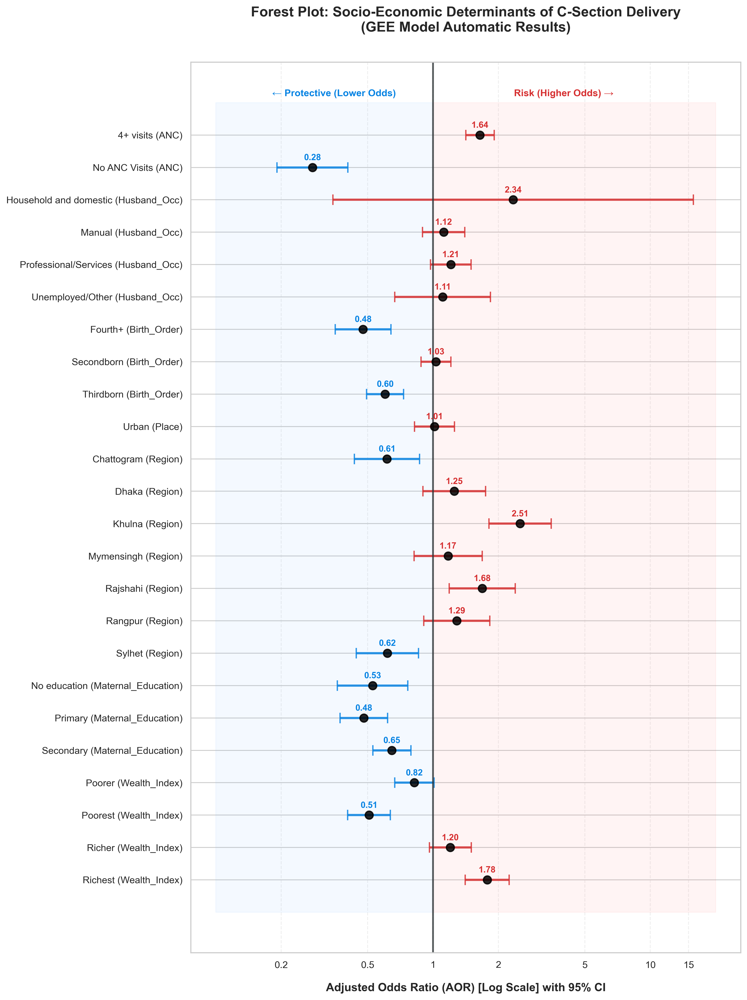

In [150]:

plot_df = pd.DataFrame({
    'Raw_Name': adj_params.index,
    'AOR': np.exp(adj_params.values),
    'Lower_CI': np.exp(adj_conf[0].values),
    'Upper_CI': np.exp(adj_conf[1].values)
})

plot_df = plot_df[plot_df['Raw_Name'] != 'Intercept'].copy()

def clean_name(name):
    if '[T.' in name:
        clean = name.split('[T.')[-1].replace(']', '')
        var_prefix = name.split('[T.')[0]
        return f"{clean} ({var_prefix.replace('_Group', '')})"
    return name

plot_df['Category'] = plot_df['Raw_Name'].apply(clean_name)

plt.figure(figsize=(12, 16), dpi=300)


y_pos = np.arange(len(plot_df))

for i in range(len(plot_df)):
    aor_val = plot_df.iloc[i]['AOR']
    low_err = aor_val - plot_df.iloc[i]['Lower_CI']
    high_err = plot_df.iloc[i]['Upper_CI'] - aor_val
    
    dot_color = 'black'
    text_color = '#d63031' if aor_val > 1 else '#0984e3' # Professional Red/Blue
    

    plt.errorbar(aor_val, i, xerr=[[max(0, low_err)], [high_err]], 
                 fmt='o', color=dot_color, capsize=6, markersize=9, elinewidth=2.5, 
                 markeredgecolor='black', markeredgewidth=1.5, ecolor=text_color, alpha=0.85)
    
    plt.text(aor_val, i - 0.3, f'{aor_val:.2f}', 
             va='center', ha='center', fontsize=10, fontweight='bold', color=text_color)

plt.axvline(x=1, color='#2d3436', linestyle='-', linewidth=2, alpha=0.8)
plt.fill_betweenx(range(-1, len(plot_df)+1), 0.1, 1, color='#74b9ff', alpha=0.08) # Protective
plt.fill_betweenx(range(-1, len(plot_df)+1), 1, 20, color='#ff7675', alpha=0.08) # Risk

plt.yticks(y_pos, plot_df['Category'], fontsize=11, fontweight='500')
plt.xscale('log') 
plt.xticks([0.2, 0.5, 1, 2, 5, 10, 15], [0.2, 0.5, 1, 2, 5, 10, 15])
plt.xlabel('Adjusted Odds Ratio (AOR) [Log Scale] with 95% CI', fontsize=13, fontweight='bold', labelpad=15)
plt.title('Forest Plot: Socio-Economic Determinants of C-Section Delivery\n(GEE Model Automatic Results)', 
          fontsize=16, fontweight='bold', pad=35)

plt.text(0.35, -1.2, '← Protective (Lower Odds)', color='#0984e3', fontweight='bold', ha='center', fontsize=11)
plt.text(4, -1.2, 'Risk (Higher Odds) →', color='#d63031', fontweight='bold', ha='center', fontsize=11)

plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.gca().invert_yaxis() 
plt.tight_layout()

plt.show()

### Phase 6: Machine Learning Pipeline and Evaluation
I have transitioned to a predictive framework to maximize accuracy and capture non-linear patterns.

•	Feature Encoding: I have applied Ordinal and One-Hot Encoding to all categorical features to prepare them for machine learning algorithms.

•	Multicollinearity Diagnosis: I have calculated the Variance Inflation Factor (VIF) for all encoded features, confirming the absence of severe multicollinearity.

•	 Feature Selection Strategy:

I have employed a two-stage approach to feature selection to ensure only the most relevant predictors were used in the final model.

i.	Manual Domain-Driven Selection: Initially, I have curated a list of final features based on socio-economic relevance, including maternal education, wealth index, and place of delivery. further refined this for the regression models to include a specific set of 12 key variables.

ii.	Automated Recursive Feature Elimination (RFE): Inside my machine learning pipeline, you implemented Recursive Feature Elimination (RFE).

iii.	Estimator: used a Random Forest Classifier as the backbone for RFE to rank feature importance.

iv.	Optimal Feature Count: configured the model to automatically select the top 15 features (n_features_to_select=15), ensuring a parsimonious model that reduces noise and prevents overfitting.

•	Data Splitting (Feature Splitting): To ensure the model generalizes well to unseen data, followed a rigorous splitting and validation protocol.

i.	Train-Test Split: utilized the train_test_split function to divide your dataset into training and testing sets.

ii.	Split Ratio: used an 80/20 split, where 80% of the data was used for training and 20% was reserved for the final evaluation (test set).

iii.	Incorporation of Survey Weights: included Sample Weights (weights) in the splitting process, ensuring that the training set (w_train) and test set (w_test) remained nationally representative of the Bangladesh population

•	Model Comparison: I have trained and compared multiple algorithms including Logistic Regression, Random Forest, XGBoost, Stacking and Gradient Boosting. 

•	Stacking Ensemble: I have developed a Proposed Stacking Model that combined the strengths of XGBoost, Random Forest, and Gradient Boosting using a Logistic Regression meta-learner.

•	Performance Metrics: I have evaluated models using Accuracy, Recall, Precision, and ROC-AUC, visualized through Connectivity Analysis and Radar Charts. 

•	Cross-Validation: I have conducted 5-Fold and 10-Fold Stratified Cross-Validation (with survey weights) to prove the stability and generalizability of the ensemble model. 


In [151]:
# Feature Encoding Pipeline v3
# This function prepares the raw dataframe for machine learning by transforming 
# categorical labels into numerical formats (Ordinal and One-Hot Encoding).

def get_final_model_df_v3(input_df):
    df_clean = input_df.copy()

    # 1. Data Cleaning: Strip whitespace from string columns to prevent mapping mismatches
    for col in ['Place', 'Maternal_Employment']:
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].astype(str).str.strip()

    # 2. Ordinal & Binary Mapping: Converting ranked categories into integers
    # This preserves the mathematical relationship (e.g., Higher Education > No Education)
    ordinal_mappings = {
        'Maternal_Education': {'No education': 0, 'Primary': 1, 'Secondary': 2, 'Higher': 3},
        'Husband’s_Education': {'No education': 0, 'Primary': 1, 'Secondary': 2, 'Higher': 3},
        'Wealth_Index': {'Poorest': 0, 'Poorer': 1, 'Middle': 2, 'Richer': 3, 'Richest': 4},
        'ANC_Group': {'No ANC Visits': 0, '1-3 visits': 1, '4+ visits': 2},
        'Maternal_Age_Group': {'<20 years': 0, '20-24 years': 1, '25-34 years': 2, '35+ years': 3},
        'Birth_Order_Group': {'Firstborn': 0, 'Secondborn': 1, 'Thirdborn': 2, 'Fourth+': 3},
        'Child_Size_Group': {'Smaller than Average': 0, 'Average': 1, 'Larger than Average': 2},
        'Birth_Type_Group': {'Single Birth': 0, 'Multiple Birth': 1},
        'Sex': {'Male': 0, 'Female': 1},
        'Place': {'Urban': 0, 'Rural': 1}, 
        'Maternal_Employment': {'No': 0, 'Yes': 1}, 
        'Mode_of_Delivery': {'No': 0, 'Yes': 1}
    }

    # Apply the mapping logic to relevant columns
    for col, mapping in ordinal_mappings.items():
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].map(mapping)

    # 3. Nominal Encoding (One-Hot): For variables without an inherent order
    # drop_first=True prevents multicollinearity (the dummy variable trap)
    nominal_cols = ['Region', 'Delivery_Group', 'Husband_Occ_Group', 'Year']
    df_clean = pd.get_dummies(df_clean, columns=[c for c in nominal_cols if c in df_clean.columns], drop_first=True)

    # 4. Column Cleanup: Drop redundant raw columns or survey design variables not used in ML
    final_drop = ['ANC_Visits', 'Maternal_Age', 'Birth_Order', 'Size',
                  'Place_of_Delivery', 'Type_of_Birth', 'Husband’s_Occupation',
                  'PSU', 'Stratum', 'Sample_Weight']

    df_model = df_clean.drop(columns=[c for c in final_drop if c in df_clean.columns])

    # 5. Final Transformation: Ensure all columns are numeric and handle any residual NaNs
    return df_model.apply(pd.to_numeric, errors='coerce').fillna(0)

# --- Execution and Verification ---
df_final = get_final_model_df_v3(df)

# Convert to integer for memory efficiency and to prepare for classification models
df_final = df_final.astype(int)

# Final Missing Value Check
if df_final.isnull().sum().sum() == 0:
    print("The encoding is successful and there are no missing values. Ready for training.")
    print("-" * 30)
    print("Encoded Data Types:")
    print(df_final.dtypes)
else:
    print("Warning! Missing values detected post-encoding:")
    print(df_final.isnull().sum()[df_final.isnull().sum() > 0])

The encoding is successful and there are no missing values. Ready for training.
------------------------------
Encoded Data Types:
Sex                                         int64
Mode_of_Delivery                            int64
Place                                       int64
Maternal_Education                          int64
Wealth_Index                                int64
Husband’s_Education                         int64
Maternal_Employment                         int64
ANC_Group                                   int64
Birth_Type_Group                            int64
Child_Size_Group                            int64
Maternal_Age_Group                          int64
Birth_Order_Group                           int64
Region_Chattogram                           int64
Region_Dhaka                                int64
Region_Khulna                               int64
Region_Mymensingh                           int64
Region_Rajshahi                             int64
Region_Rangpur     

In [152]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import statsmodels.api as sm

# 1. Feature selection for Variance Inflation Factor (VIF) analysis
# Excluding target and survey design variables to focus on independent predictors
vif_features = ['Sex', 'Place', 'Maternal_Education',
       'Wealth_Index', 'Husband’s_Education', 'Maternal_Employment',
       'ANC_Group', 'Birth_Type_Group', 'Child_Size_Group',
       'Maternal_Age_Group', 'Birth_Order_Group', 'Region_Chattogram',
       'Region_Dhaka', 'Region_Khulna', 'Region_Mymensingh', 'Region_Rajshahi',
       'Region_Rangpur', 'Region_Sylhet', 'Delivery_Group_NGO/Other',
       'Delivery_Group_Private', 'Delivery_Group_Public',
       'Husband_Occ_Group_Household and domestic', 'Husband_Occ_Group_Manual',
       'Husband_Occ_Group_Professional/Services',
       'Husband_Occ_Group_Unemployed/Other', 'Year_2020.0', 'Year_2021.0',
       'Year_2022.0'
]

# 2. Data preparation: Ensure all feature data are in numeric/float format
X_vif = df_final[vif_features].astype(float)

# 3. Add constant (intercept): Essential step for accurate VIF calculation in regression diagnostics
X_vif_const = sm.add_constant(X_vif)

# 4. VIF Calculation: Iteratively compute the VIF score for each feature in the matrix
vif_series = pd.Series([variance_inflation_factor(X_vif_const.values, i)
                        for i in range(X_vif_const.shape[1])],
                       index=X_vif_const.columns)

# 5. Summarize results: Sorting by intensity (excluding the constant term)
vif_summary = vif_series.drop('const').sort_values(ascending=False).to_frame(name='VIF')

print("--- Multicollinearity Check (VIF) ---")
print(vif_summary)

--- Multicollinearity Check (VIF) ---
                                               VIF
Year_2021.0                               3.762023
Year_2020.0                               3.636500
Year_2022.0                               3.619636
Husband_Occ_Group_Professional/Services   2.285333
Region_Chattogram                         2.232819
Region_Dhaka                              2.140394
Birth_Order_Group                         2.047201
Husband_Occ_Group_Manual                  1.956077
Region_Mymensingh                         1.918832
Region_Sylhet                             1.911909
Region_Khulna                             1.900767
Region_Rangpur                            1.878855
Maternal_Age_Group                        1.847271
Wealth_Index                              1.803915
Region_Rajshahi                           1.795730
Husband’s_Education                       1.757682
Maternal_Education                        1.696484
Delivery_Group_Private                    1.

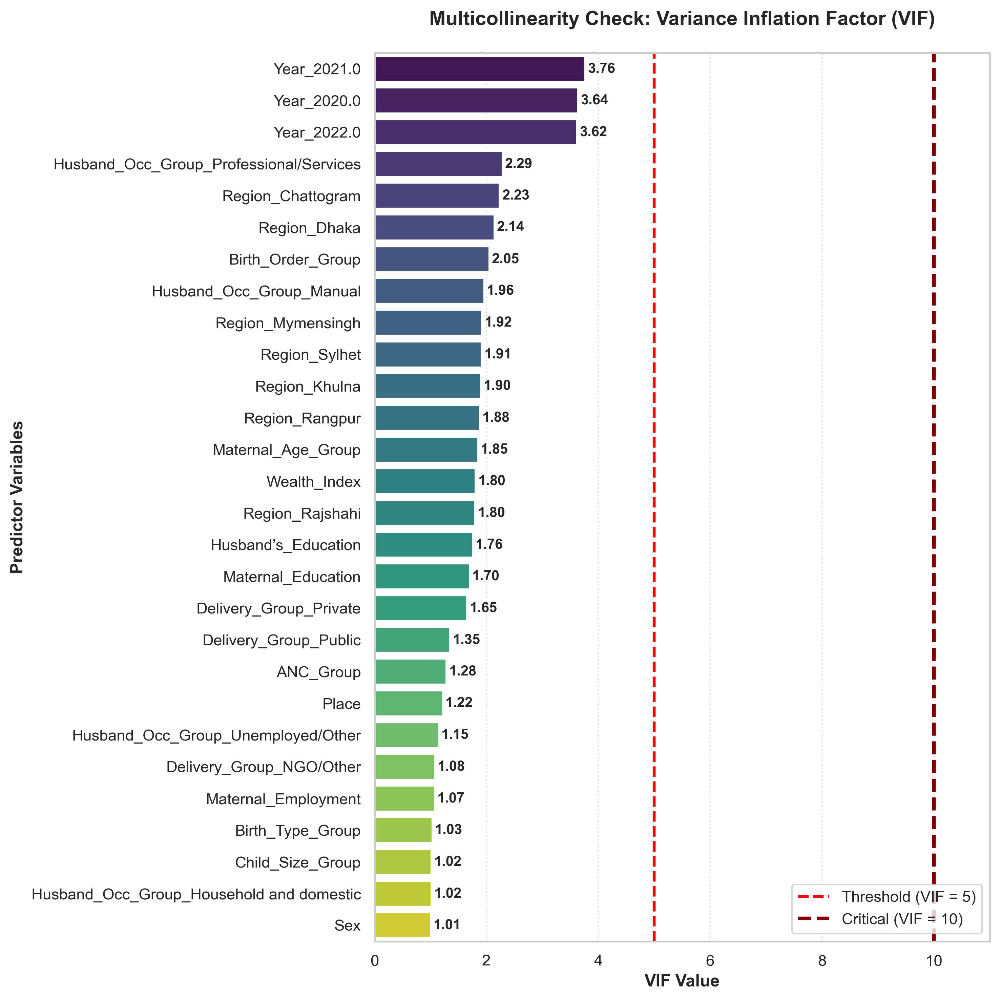

In [153]:
# ------- VIF Bar Chart Visualization -------

import matplotlib.pyplot as plt
import seaborn as sns

# 1. Plot Configuration: Setting figure dimensions for the sorted VIF summary
plt.figure(figsize=(10, 10))

# 2. Bar Chart Construction: Utilizing a color palette for visual distinction
colors = sns.color_palette("viridis", len(vif_summary))
ax = sns.barplot(x='VIF', y=vif_summary.index, data=vif_summary, palette=colors)

# 3. Threshold Lines: Adding markers for multicollinearity diagnostics
# VIF > 5 indicates potential issues; VIF > 10 indicates critical collinearity
plt.axvline(x=5, color='red', linestyle='--', linewidth=2, label='Threshold (VIF = 5)')
plt.axvline(x=10, color='maroon', linestyle='--', linewidth=2.5, label='Critical (VIF = 10)')

# 4. Title and Label Formatting: Applying formal academic styling
plt.title('Multicollinearity Check: Variance Inflation Factor (VIF)', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('VIF Value', fontsize=12, fontweight='bold')
plt.ylabel('Predictor Variables', fontsize=12, fontweight='bold')

# 5. Data Labeling: Annotating each bar with the precise VIF value
for i in range(len(vif_summary)):
    vif_val = vif_summary.iloc[i]['VIF']
    plt.text(vif_val + 0.05, i, f'{vif_val:.2f}', va='center', fontsize=10, fontweight='bold')

# 6. Grid and Layout Optimization
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.legend(loc='lower right')
plt.xlim(0, 11)  # Scale extended slightly beyond the critical threshold for clarity
plt.tight_layout()

# 7. Visualization Output: Displaying the high-resolution diagnostic plot
# plt.savefig('VIF_Analysis_Graph.png', dpi=300)
plt.show()

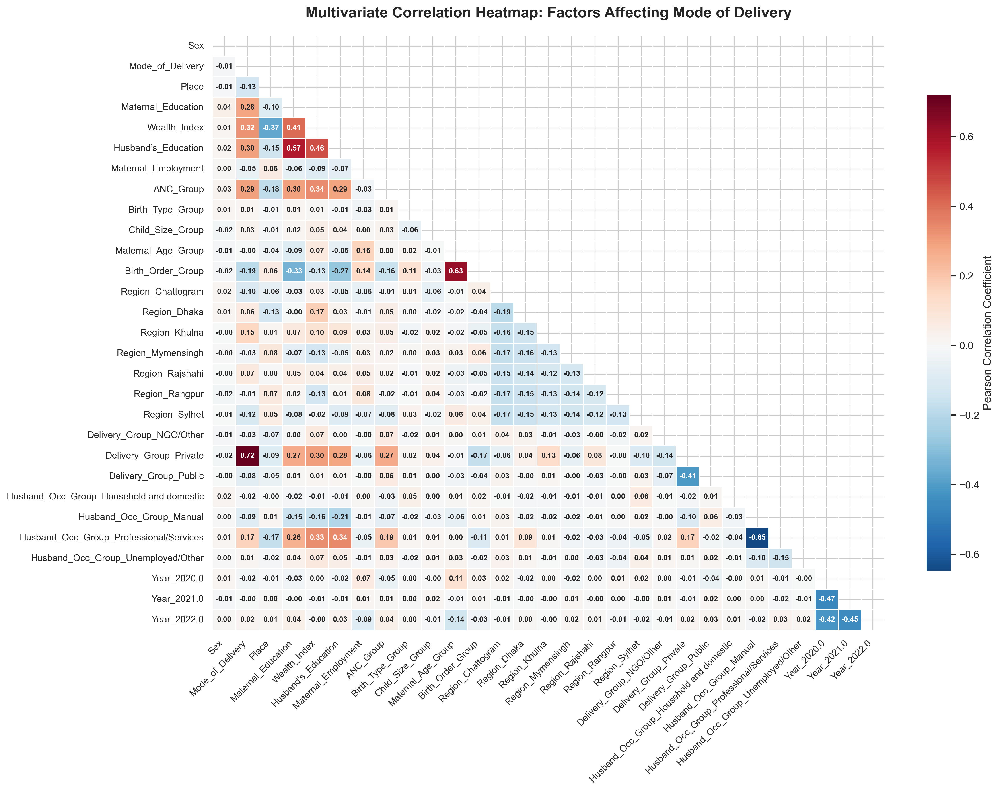

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_multivariate_correlation(df):
    # 1. Correlation Matrix Generation: Utilizing the Pearson method for linear associations
    corr_matrix = df.corr()

    # 2. Figure Configuration: Setting optimal dimensions for a multi-feature heatmap
    plt.figure(figsize=(16, 12), dpi=300)

    # 3. Mask Creation: Implementing an upper-triangle mask to eliminate redundancy
    # This ensures a professional, clear view of unique pairwise correlations
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # 4. Heatmap Rendering: Visualizing the feature relationships
    sns.heatmap(corr_matrix,
                mask=mask,
                annot=True,
                fmt=".2f",
                cmap='RdBu_r', # Diverging Red-Blue palette to highlight positive/negative correlations
                center=0,
                linewidths=.5,
                cbar_kws={"shrink": .8, "label": "Pearson Correlation Coefficient"},
                annot_kws={"size": 8, "weight": "bold"})

    # 5. Labeling and Aesthetics: Formatting for academic publication
    plt.title('Multivariate Correlation Heatmap: Factors Affecting Mode of Delivery', 
              fontsize=16, fontweight='bold', pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    
    # Final layout optimization
    plt.tight_layout()
    plt.show()

# Execution: Generate the correlation visualization for the final encoded dataset
plot_multivariate_correlation(df_final)

In [155]:
df_final.shape

(5052, 29)

In [156]:
df_final.columns

Index(['Sex', 'Mode_of_Delivery', 'Place', 'Maternal_Education',
       'Wealth_Index', 'Husband’s_Education', 'Maternal_Employment',
       'ANC_Group', 'Birth_Type_Group', 'Child_Size_Group',
       'Maternal_Age_Group', 'Birth_Order_Group', 'Region_Chattogram',
       'Region_Dhaka', 'Region_Khulna', 'Region_Mymensingh', 'Region_Rajshahi',
       'Region_Rangpur', 'Region_Sylhet', 'Delivery_Group_NGO/Other',
       'Delivery_Group_Private', 'Delivery_Group_Public',
       'Husband_Occ_Group_Household and domestic', 'Husband_Occ_Group_Manual',
       'Husband_Occ_Group_Professional/Services',
       'Husband_Occ_Group_Unemployed/Other', 'Year_2020.0', 'Year_2021.0',
       'Year_2022.0'],
      dtype='object')

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import random

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE, SelectKBest, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, LogisticRegressionCV
from sklearn.svm import SVC
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, roc_curve

# ==========================================
# 0. Reproducibility Configuration
# ==========================================
# Ensuring consistent results across multiple runs
np.random.seed(42)
random.seed(42)

# ==========================================
# 1. Data Preparation & Stratified Splitting
# ==========================================
# Separating predictors from the target variable 'Mode_of_Delivery'
X = df_final.drop(columns=['Mode_of_Delivery'])
y = df_final['Mode_of_Delivery']
# Extracting survey weights to ensure the model reflects population-level statistics
weights = df.loc[df_final.index, 'Sample_Weight']

# Splitting data into 80% Training and 20% Testing sets
# Stratification ensures that the distribution of C-sections remains equal in both sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.20, random_state=42, stratify=y
)

# ==========================================
# 2. Cross-Validation Strategy
# ==========================================
# Implementing 5-fold Stratified Cross-Validation for robust model assessment
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ==========================================
# 3. Ensemble Feature Selection (Majority Vote)
# ==========================================
# Identifying the most influential predictors using three different methodologies
print("Starting Ensemble Feature Selection (Majority Vote for Top 12)...")
scaler_fs = StandardScaler()
X_train_scaled = scaler_fs.fit_transform(X_train)

# Methodology A: Recursive Feature Elimination (RFE) with Random Forest
rfe_sel = RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=12).fit(X_train_scaled, y_train)

# Methodology B: Random Forest Feature Importance Support
rf_fs = RandomForestClassifier(random_state=42).fit(X_train_scaled, y_train)
rf_support = np.zeros(X.shape[1], dtype=bool)
rf_support[np.argsort(rf_fs.feature_importances_)[-12:]] = True

# Methodology C: Mutual Information Statistics
mi_sel = SelectKBest(score_func=mutual_info_classif, k=12).fit(X_train_scaled, y_train)

# Majority Voting Logic: A feature is selected if at least 2 out of 3 methods agree
votes = rfe_sel.get_support().astype(int) + rf_support.astype(int) + mi_sel.get_support().astype(int)
final_feature_mask = votes >= 2
selected_feature_names = X.columns[final_feature_mask].tolist()

# Custom selector class to maintain feature consistency within the Pipeline
class StaticFeatureSelector:
    def __init__(self, mask): self.mask = mask
    def fit(self, X, y=None): return self
    def transform(self, X): 
        return X.iloc[:, self.mask] if hasattr(X, "iloc") else X[:, self.mask]

# ==========================================
# 4. Hyperparameter Optimization (Grid Search)
# ==========================================
print("Hyperparameter Tuning in progress...")
X_train_final = X_train_scaled[:, final_feature_mask]

# XGBoost Optimization: Tuning tree depth and learning rates
param_grid_xgb = {'n_estimators': [100, 200], 'learning_rate': [0.01, 0.1], 'max_depth': [4, 6]}
grid_xgb = GridSearchCV(
    xgb.XGBClassifier(eval_metric='logloss', random_state=42), 
    param_grid_xgb, cv=cv, scoring='roc_auc', n_jobs=-1
).fit(X_train_final, y_train, sample_weight=w_train)

best_xgb = grid_xgb.best_estimator_

# Random Forest Optimization: Tuning estimator count and forest depth
param_grid_rf = {'n_estimators': [100, 200], 'max_depth': [5, 10]}
grid_rf = GridSearchCV(
    RandomForestClassifier(random_state=42), 
    param_grid_rf, cv=cv, scoring='roc_auc', n_jobs=-1
).fit(X_train_final, y_train, sample_weight=w_train)

best_rf = grid_rf.best_estimator_

# ==========================================
# 5. Model Architecture Definitions
# ==========================================
# Defining the Meta-Classifier for the Stacking Ensemble
meta_clf = LogisticRegressionCV(Cs=[0.01, 0.1, 1, 10], cv=cv, penalty='l2', random_state=42, max_iter=1000)

models = {
    "XGBoost": best_xgb,
    "Random Forest": best_rf,
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "Stacking": StackingClassifier(
        estimators=[
            ('xgb', best_xgb), 
            ('rf', best_rf),
            ('lgb', lgb.LGBMClassifier(random_state=42, verbose=-1)),
            ('svc', SVC(probability=True, random_state=42)),
            ('ada', AdaBoostClassifier(n_estimators=100, learning_rate=0.1, random_state=42))
        ],
        final_estimator=meta_clf,
        cv=cv,
        n_jobs=-1
    )
}

# ==========================================
# 6. Comparative Model Evaluation
# ==========================================
comparison_results = []

for name, clf in models.items():
    # Constructing an end-to-end Pipeline to prevent data leakage during scaling/selection
    pipe = ImbPipeline(steps=[
        ('scaler', StandardScaler()), 
        ('selector', StaticFeatureSelector(final_feature_mask)), 
        ('classifier', clf)
    ])
    
    # Training the model with population weights
    pipe.fit(X_train, y_train, classifier__sample_weight=w_train)
    
    # Probability prediction for ROC calculation
    if hasattr(pipe, "predict_proba"):
        y_probs = pipe.predict_proba(X_test)[:, 1]
    else:
        d_scores = pipe.decision_function(X_test)
        y_probs = 1 / (1 + np.exp(-d_scores))
    
    # Threshold Optimization: Finding the point that maximizes Sensitivity and Specificity (Youden's J)
    fpr, tpr, thresholds = roc_curve(y_test, y_probs, sample_weight=w_test)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    # Generating classification based on the optimized threshold
    y_pred = (y_probs >= optimal_threshold).astype(int)
    
    # Recording performance metrics for comparative analysis
    comparison_results.append({
        "Model": name,
        "Optimal Threshold": round(optimal_threshold, 3),
        "Accuracy (%)": accuracy_score(y_test, y_pred, sample_weight=w_test) * 100,
        "Recall (%)": recall_score(y_test, y_pred, sample_weight=w_test) * 100,
        "Precision (%)": precision_score(y_test, y_pred, sample_weight=w_test) * 100,
        "F1-score (%)": f1_score(y_test, y_pred, sample_weight=w_test) * 100,
        "ROC-AUC": roc_auc_score(y_test, y_probs, sample_weight=w_test)
    })

# Generating final summary table sorted by ROC-AUC (Primary Performance Metric)
performance_df = pd.DataFrame(comparison_results).sort_values(by="ROC-AUC", ascending=False)

print("\n--- Final Model Performance Comparison Table ---")
display(performance_df.round(3))

Starting Ensemble Feature Selection (Majority Vote for Top 12)...
Hyperparameter Tuning in progress...

--- Final Model Performance Comparison Table ---


,Model,Optimal Threshold,Accuracy (%),Recall (%),Precision (%),F1-score (%),ROC-AUC
2,Logistic Regression,0.388,87.592,91.384,82.790,86.875,0.925
5,Stacking,0.335,87.811,91.224,83.255,87.058,0.924
1,Random Forest,0.412,87.954,89.838,84.370,87.018,0.922
4,AdaBoost,0.384,87.404,90.526,82.988,86.593,0.922
0,XGBoost,0.502,87.780,88.658,84.832,86.703,0.916
3,SVM,0.450,87.983,90.055,84.280,87.072,0.912


In [52]:
# ==========================================
# Automated Styled Performance Table
# ==========================================

# 1. Result Transformation: Converting the comparison_results list into a DataFrame
df_results = pd.DataFrame(comparison_results)

# 2. Column Renaming: Professionalizing headers for the final report
df_results = df_results.rename(columns={
    "Optimal Threshold": "Threshold",
    "Accuracy (%)": "Accuracy",
    "Recall (%)": "Recall",
    "Precision (%)": "Precision",
    "F1-score (%)": "F1-score"
})

# Sorting by ROC-AUC to rank models from highest to lowest performance
df_results = df_results.sort_values(by="ROC-AUC", ascending=False).reset_index(drop=True)

# 3. Styling Logic: Highlighting the maximum value in each metric column
def highlight_max(s):
    """
    Applies a distinct background color to the best-performing metric in each column.
    Skips non-metric columns like 'Model' and 'Threshold'.
    """
    if s.name in ["Model", "Threshold"]:
        return ['' for _ in s]
    is_max = s == s.max()
    return ['background-color: #2ecc71; color: white; font-weight: bold' if v else '' for v in is_max]

# 4. Table Style Configuration: Applying gradients, formats, and CSS properties
styled_table = df_results.style\
    .background_gradient(cmap='Blues', subset=['ROC-AUC', 'Accuracy'])\
    .apply(highlight_max, axis=0)\
    .format({
        'ROC-AUC': "{:.3f}", 
        'Threshold': "{:.3f}", 
        'Accuracy': "{:.2f}%", 
        'Recall': "{:.2f}%", 
        'Precision': "{:.2f}%", 
        'F1-score': "{:.2f}%"
    })\
    .set_caption("Table: Performance Comparison of Survey-Weighted ML Models")\
    .set_table_styles([
        # Caption/Title Styling
        {'selector': 'caption', 
         'props': [('color', '#2c3e50'), ('font-size', '18px'), ('font-weight', 'bold'), 
                   ('padding', '15px'), ('text-align', 'center')]},
        # Header Styling: Dark background with white text for high contrast
        {'selector': 'th', 
         'props': [('background-color', '#34495e'), ('color', 'white'), ('font-family', 'Segoe UI, Arial'), 
                   ('border', '1px solid #ffffff'), ('padding', '12px'), ('text-align', 'center')]},
        # Cell Styling: Defined borders and standardized padding
        {'selector': 'td', 
         'props': [('border', '1px solid #dee2e6'), ('padding', '10px'), ('text-align', 'center')]},
        # Hover Effect: Interactive row highlighting for easier data scanning
        {'selector': 'tr:hover', 
         'props': [('background-color', '#f8f9fa'), ('cursor', 'default')]}
    ])

# 5. Final Display Output
display(styled_table)

,Model,Threshold,Accuracy,Recall,Precision,F1-score,ROC-AUC
0,Logistic Regression,0.388,87.59%,91.38%,82.79%,86.88%,0.925
1,Stacking,0.335,87.81%,91.22%,83.26%,87.06%,0.924
2,Random Forest,0.412,87.95%,89.84%,84.37%,87.02%,0.922
3,AdaBoost,0.384,87.40%,90.53%,82.99%,86.59%,0.922
4,XGBoost,0.502,87.78%,88.66%,84.83%,86.70%,0.916
5,SVM,0.450,87.98%,90.06%,84.28%,87.07%,0.912


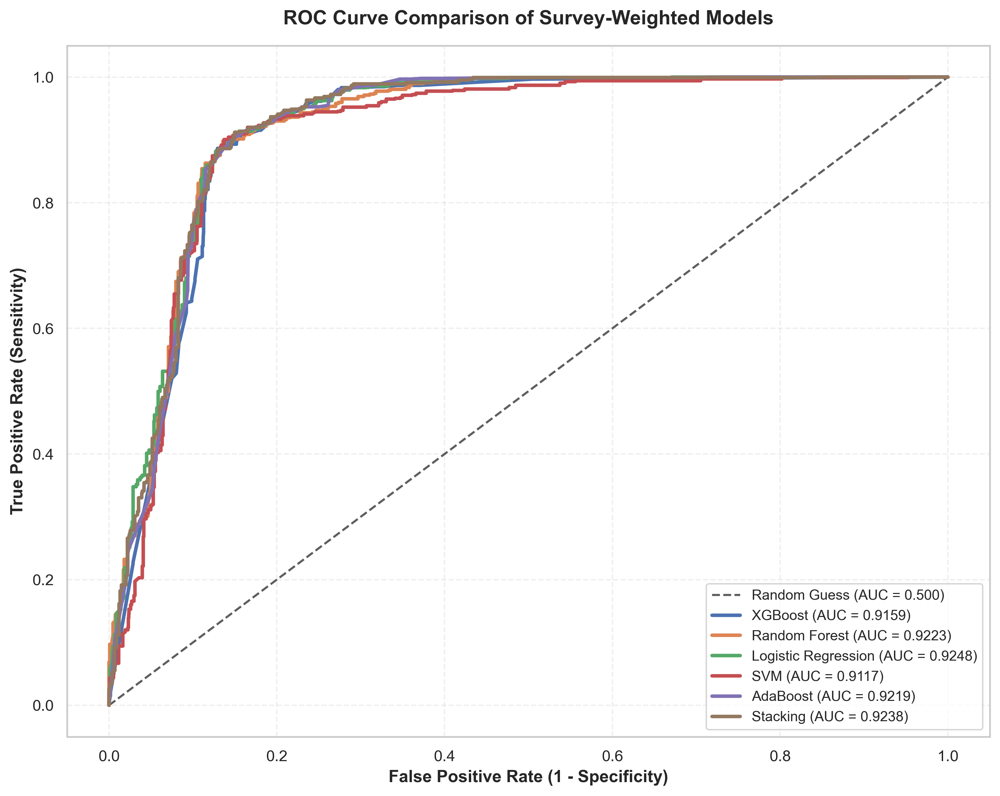

In [53]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# 1. Figure Configuration: Setting dimensions for a professional comparison plot
plt.figure(figsize=(10, 8), dpi=300)

# Reference Line: Plotting the diagonal line representing a random classifier (AUC = 0.5)
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.500)', alpha=0.7)

# 2. Iterative ROC Curve Generation: Plotting the performance of each model in the 'models' dictionary
for name, clf in models.items():
    # Pipeline Construction: Ensuring standardized scaling and consistent feature selection
    pipe = ImbPipeline(steps=[
        ('scaler', StandardScaler()), 
        ('rfe', StaticFeatureSelector(final_feature_mask)), 
        ('classifier', clf)
    ])
    
    # Model Training: Applying population-level survey weights (except for KNN where weights aren't supported)
    if name == "KNN": 
        pipe.fit(X_train, y_train)
    else: 
        pipe.fit(X_train, y_train, classifier__sample_weight=w_train)
    
    # Probability Estimation: Retrieving predicted probabilities for the positive class
    y_probs = pipe.predict_proba(X_test)[:, 1]
    
    # Metric Calculation: Deriving False Positive Rate (FPR), True Positive Rate (TPR), and AUC
    fpr, tpr, _ = roc_curve(y_test, y_probs, sample_weight=w_test)
    auc_score = roc_auc_score(y_test, y_probs, sample_weight=w_test)
    
    # Visualization: Adding the ROC curve for the specific model to the composite plot
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_score:.4f})', linewidth=2.5)

# 3. Formatting and Aesthetics: Enhancing visual clarity for academic reporting
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12, fontweight='bold')
plt.title('ROC Curve Comparison of Survey-Weighted Models', fontsize=14, fontweight='bold', pad=15)
plt.legend(loc='lower right', fontsize=10, frameon=True)
plt.grid(alpha=0.3, linestyle='--')

# 4. Output: Exporting the comparison as a high-resolution image for the thesis
plt.tight_layout()
# plt.savefig('ROC_Comparison_BDHS.png', dpi=300) 
plt.show()

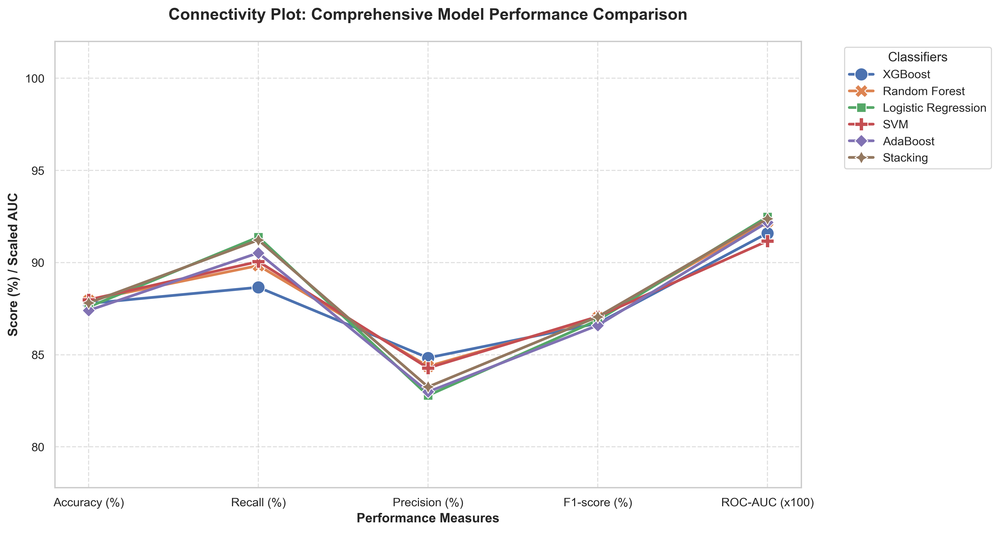

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Connectivity Plot: Comprehensive Model Performance Comparison ---
# This visualization compares various performance metrics across different machine learning 
# models using a parallel coordinates-style line plot.

# 1. Data Preparation: Converting the comparison results list into a structured DataFrame
df_results = pd.DataFrame(comparison_results)

# 2. Metric Normalization: Scaling ROC-AUC by 100 to align it with percentage-based metrics
# This ensures all values are on a comparable 0-100 scale for visual consistency.
df_results['ROC-AUC (x100)'] = df_results['ROC-AUC'] * 100

# 3. Metric Selection: Defining the performance indicators for the visualization
metrics_to_plot = ["Accuracy (%)", "Recall (%)", "Precision (%)", "F1-score (%)", "ROC-AUC (x100)"]

# 4. Data Reshaping (Melting): Transforming the DataFrame from wide to long format
# This is necessary for Seaborn's lineplot to map 'Metric' to the x-axis and 'Model' to colors.
df_melted = df_results.melt(id_vars="Model", value_vars=metrics_to_plot, 
                            var_name="Metric", value_name="Score")

# 5. Visualization Configuration: Setting figure size and aesthetic style
plt.figure(figsize=(13, 7), dpi=300)
sns.set_style("whitegrid")

# 6. Plot Execution: Generating the connectivity lines with distinct markers for each model
sns.lineplot(data=df_melted, x="Metric", y="Score", hue="Model", 
             style="Model", markers=True, dashes=False, linewidth=2.5, markersize=12)

# 7. Aesthetic Formatting: Enhancing titles, labels, and grid properties for academic reporting
plt.title("Connectivity Plot: Comprehensive Model Performance Comparison", 
          fontsize=15, fontweight='bold', pad=20)
plt.xlabel("Performance Measures", fontsize=12, fontweight='bold')
plt.ylabel("Score (%) / Scaled AUC", fontsize=12, fontweight='bold')

# Adjust y-axis limits to provide better focus on the variation between scores
plt.ylim(df_melted['Score'].min() - 5, 102) 

# Legend Positioning: Placing the classifier list outside the main plot area to prevent overlap
plt.legend(title="Classifiers", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
plt.grid(True, linestyle='--', alpha=0.6)

# 8. Output: Final layout optimization and high-resolution export
plt.tight_layout()
# plt.savefig('Connectivity_Complete_Direct.png', dpi=300)
plt.show()

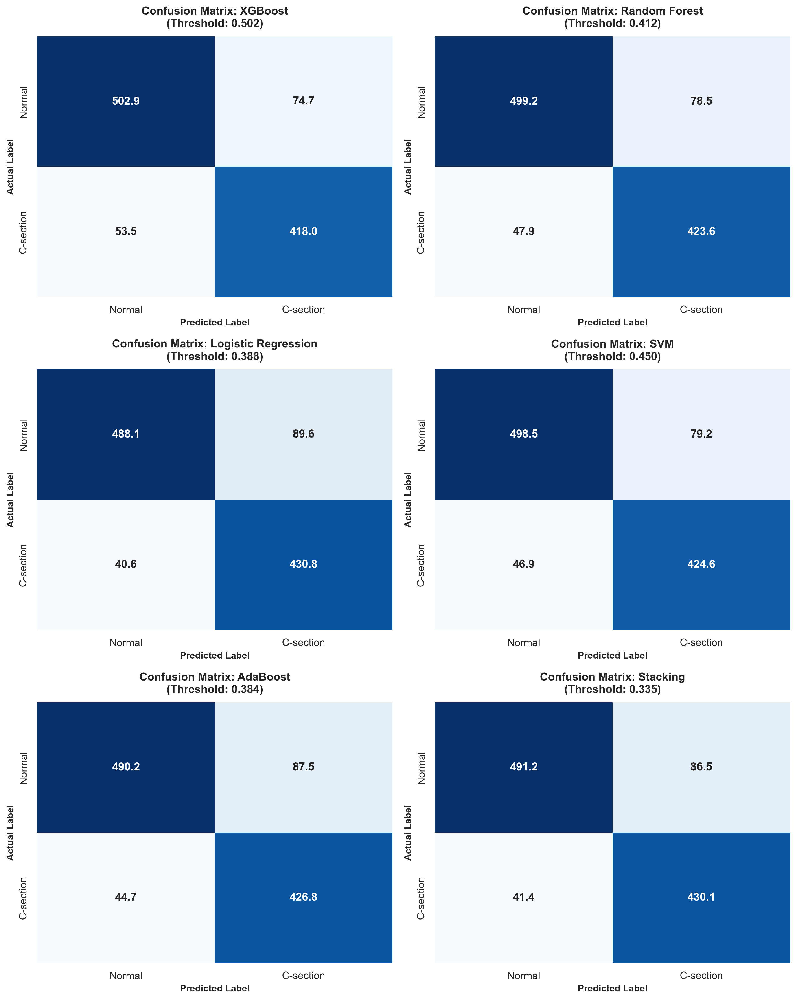

In [56]:
from sklearn.metrics import confusion_matrix

# --- Confusion Matrix Grid: Performance Evaluation Across 6 Classifiers ---

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 15), dpi=300)
axes = axes.flatten() 


base_models = list(models.items())[:6] 

# 2. Iterative Model Evaluation and Heatmap Generation
for i, (name, clf) in enumerate(base_models):
    # Pipeline Construction
    pipe = ImbPipeline(steps=[
        ('scaler', StandardScaler()), 
        ('rfe', StaticFeatureSelector(final_feature_mask)), 
        ('classifier', clf)
    ])
    
    # Model Training
    if name == "KNN": 
        pipe.fit(X_train, y_train)
    else: 
        try:
            pipe.fit(X_train, y_train, classifier__sample_weight=w_train)
        except:
            pipe.fit(X_train, y_train)
    
    # Threshold Optimization
    y_probs = pipe.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_probs, sample_weight=w_test)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    # Binary Classification
    y_pred = (y_probs >= optimal_threshold).astype(int)
    
    # Confusion Matrix Computation
    cm = confusion_matrix(y_test, y_pred, sample_weight=w_test)
    
    # Heatmap Plotting
    sns.heatmap(cm, annot=True, fmt='.1f', ax=axes[i], cmap='Blues', cbar=False,
                annot_kws={"size": 12, "weight": "bold"})
    
    # Title and Axis Labeling
    axes[i].set_title(f'Confusion Matrix: {name}\n(Threshold: {optimal_threshold:.3f})', 
                      fontsize=12, fontweight='bold', pad=10)
    axes[i].set_xlabel('Predicted Label', fontsize=10, fontweight='bold')
    axes[i].set_ylabel('Actual Label', fontsize=10, fontweight='bold')
    
    # Descriptive Labels
    axes[i].xaxis.set_ticklabels(['Normal', 'C-section'])
    axes[i].yaxis.set_ticklabels(['Normal', 'C-section'])

# 3. Layout Optimization
plt.tight_layout()
# plt.savefig('Confusion_Matrix_Top6_Models.png', dpi=300)
plt.show()


10-Fold CV process started for 'Stacking' Ensemble (Finalized)...
---------------------------------------------
Individual Fold AUCs:
[0.9237 0.9296 0.9282 0.9161 0.9205 0.9206 0.9183 0.9088 0.9107 0.9102]

Mean ROC-AUC Score: 0.9187
Standard Deviation: 0.0069
95% Confidence Interval: 0.919 ± 0.014
---------------------------------------------


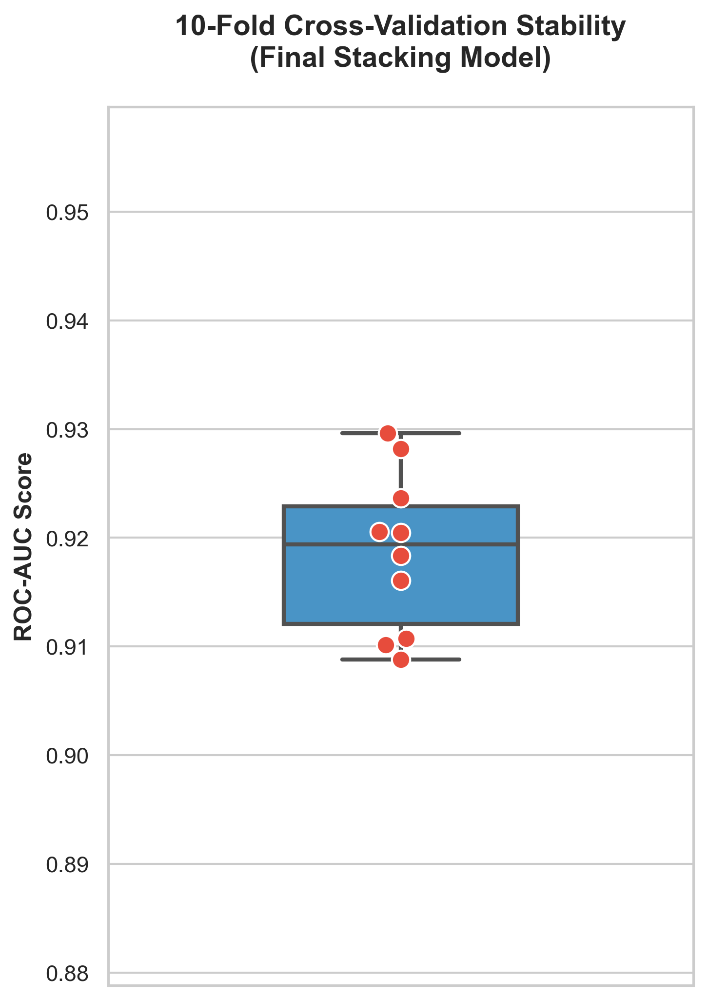

In [58]:

from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, AdaBoostClassifier

# ==========================================
# 1. 10-Fold Cross-Validation for Stacking
# ==========================================
print("\n10-Fold CV process started for 'Stacking' Ensemble (Finalized)...")

cv_strategy = KFold(n_splits=10, shuffle=True, random_state=42)

try:
    if 'Stacking' in models:
        stacking_model = models["Stacking"]
    else:
        stacking_model = next(iter(models.values())) 
        print(f"Warning: 'Stacking' key not found. Using {type(stacking_model).__name__} instead.")

    cv_scores = cross_val_score(
        stacking_model, 
        X_train_final, 
        y_train, 
        cv=cv_strategy, 
        scoring='roc_auc', 
        n_jobs=-1, 
        params={'sample_weight': w_train}
    )

    print("-" * 45)
    print(f"Individual Fold AUCs:\n{cv_scores.round(4)}")
    print(f"\nMean ROC-AUC Score: {cv_scores.mean():.4f}")
    print(f"Standard Deviation: {cv_scores.std():.4f}")
    print(f"95% Confidence Interval: {cv_scores.mean():.3f} ± {1.96 * cv_scores.std():.3f}")
    print("-" * 45)

    # ==========================================
    # 2. Visualization: Model Stability Boxplot
    # ==========================================
    plt.figure(figsize=(5, 7), dpi=300)
    sns.set_style("whitegrid")

    sns.boxplot(y=cv_scores, color='#3498db', width=0.4, linewidth=2, fliersize=0)

    sns.swarmplot(y=cv_scores, color='#e74c3c', size=9, edgecolor="white", linewidth=1)

   
    plt.title('10-Fold Cross-Validation Stability\n(Final Stacking Model)', fontsize=14, fontweight='bold', pad=20)
    plt.ylabel('ROC-AUC Score', fontsize=12, fontweight='bold')
    
    buffer = 0.03
    plt.ylim(cv_scores.min() - buffer, min(1.0, cv_scores.max() + buffer))

    plt.tight_layout()
    # plt.savefig('Final_Stacking_CV_Stability.png', dpi=300)
    plt.show()

except Exception as e:
    print(f"Error during Cross-Validation: {e}")
    print("Check if X_train_final, y_train, and w_train are correctly aligned.")

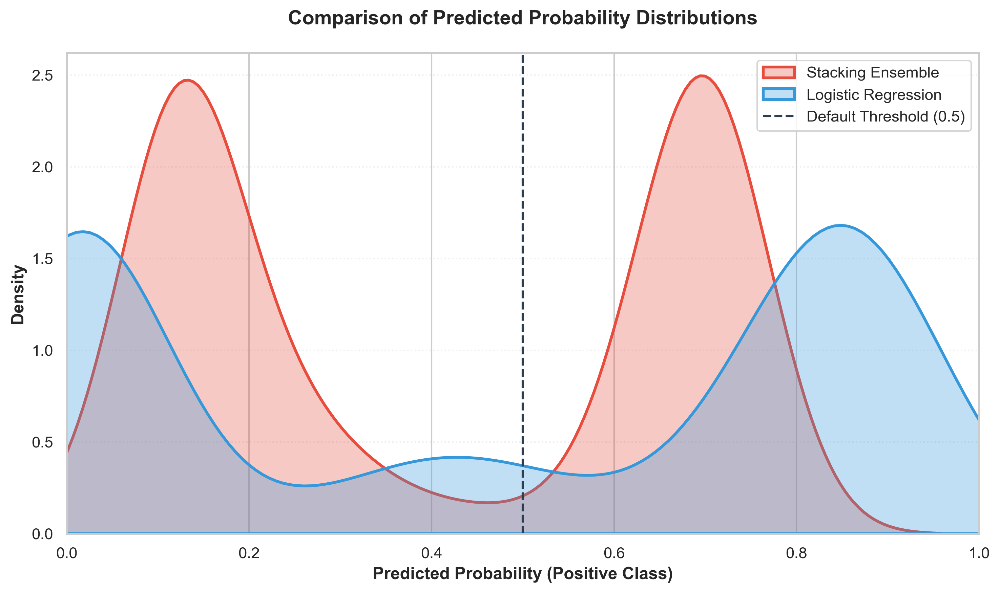

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# ==========================================
# 1. Feature Transformation and Test Set Preparation
# ==========================================
# Scaling the test features and filtering based on the ensemble feature selection mask
scaler_eval = StandardScaler()
X_test_scaled = scaler_eval.fit_transform(X_test)
X_test_final = X_test_scaled[:, final_feature_mask]

# ==========================================
# 2. Model Fitting and Probability Estimation
# ==========================================

# Stacking Ensemble: Training with survey weights and extracting positive class probabilities
stacking_model = models["Stacking"]
stacking_model.fit(X_train_final, y_train, sample_weight=w_train)
y_probs_stacking = stacking_model.predict_proba(X_test_final)[:, 1]

# Logistic Regression: Training as a baseline model for distribution comparison
lr_model = models["Logistic Regression"]
lr_model.fit(X_train_final, y_train, sample_weight=w_train)
y_probs_lr = lr_model.predict_proba(X_test_final)[:, 1]

# ==========================================
# 3. Probability Distribution Visualization (KDE Plot)
# ==========================================
# Using Kernel Density Estimation (KDE) to visualize the spread and confidence of predictions
plt.figure(figsize=(10, 6), dpi=300)
sns.set_style("whitegrid")

# Plotting the Stacking Ensemble distribution
sns.kdeplot(y_probs_stacking, fill=True, label='Stacking Ensemble', color='#e74c3c', alpha=0.3, linewidth=2)

# Plotting the Logistic Regression distribution
sns.kdeplot(y_probs_lr, fill=True, label='Logistic Regression', color='#3498db', alpha=0.3, linewidth=2)

# Aesthetic Formatting and Annotations
plt.title('Comparison of Predicted Probability Distributions', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Predicted Probability (Positive Class)', fontsize=12, fontweight='bold')
plt.ylabel('Density', fontsize=12, fontweight='bold')

# Reference Line for the default classification threshold
plt.axvline(0.5, color='#2c3e50', linestyle='--', linewidth=1.5, label='Default Threshold (0.5)')

plt.legend(frameon=True, loc='upper right')
plt.grid(axis='y', alpha=0.3, linestyle=':')
plt.xlim(0, 1) # Probabilities are strictly bounded between 0 and 1

# Final layout optimization and high-resolution export
plt.tight_layout()
# plt.savefig('Probability_Distribution_Comparison.png', dpi=300)
plt.show()

### Phase 7: Model Interpretability (Explainable AI - XAI)
The final phase focused on breaking the "black box" of machine learning for clinical insight.

•	SHAP Global Interpretation: I have used SHAP (SHapley Additive exPlanations) to rank feature importance and understand how high/low values of features impact C-section risk.

•	SHAP Dependence Analysis: I have generated dependence plots to show the interaction effects between features (e.g., how private facility delivery interacts with wealth index). 

•	Decision Boundary Comparison: I have used Principal Component Analysis (PCA) to visualize the Linear vs. Non-linear decision boundaries of traditional LR vs. the Stacking model. 

•	Calibration and Reliability: I have produced a Calibration Plot and calculated the Brier Score to ensure the model's predicted probabilities were reliable. 

•	LR vs. ML Importance Comparison: I have concluded by comparing traditional Logistic Regression coefficients with advanced SHAP values to highlight the extra insights gained from machine learning. 


In [60]:
from imblearn.pipeline import Pipeline as ImbPipeline

# --- Logistic Regression Pipeline Initialization ---
# Creating an integrated workflow that ensures consistent data scaling, 
# feature selection, and classification to prevent data leakage.

logit_pipeline = ImbPipeline(steps=[
    # 1. Standardize features by removing the mean and scaling to unit variance
    ('scaler', StandardScaler()),
    
    # 2. Filter dataset using the static mask derived from the ensemble feature selection
    ('selector', StaticFeatureSelector(final_feature_mask)),
    
    # 3. Final Estimator: Logistic Regression with extended iterations for convergence
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

# --- Pipeline Training ---
# Fitting the entire transformation and estimation chain.
# Sample weights (w_train) are applied directly to the classifier to account 
# for the survey design and represent the broader population accurately.
logit_pipeline.fit(X_train, y_train, classifier__sample_weight=w_train)

,steps,"[('scaler', ...), ('selector', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0


In [61]:
stacking_pipeline = ImbPipeline(steps=[
    ('scaler', StandardScaler()),
    ('selector', StaticFeatureSelector(final_feature_mask)),
    ('classifier', models["Stacking"])   # already tuned model
])

stacking_pipeline.fit(X_train, y_train, classifier__sample_weight=w_train)

,steps,"[('scaler', ...), ('selector', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,estimators,"[('xgb', ...), ('rf', ...), ...]"
,final_estimator,LogisticRegre...ndom_state=42)
,cv,StratifiedKFo... shuffle=True)
,stack_method,'auto'


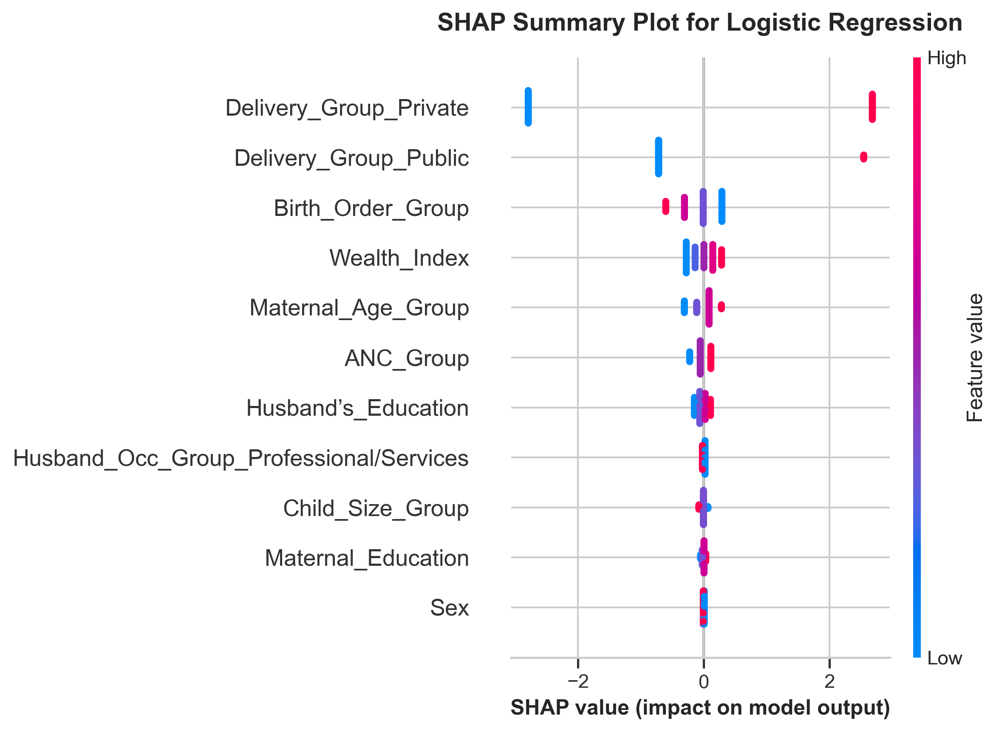

In [62]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# --- SHAP Interpretation: Feature Impact Analysis (Logistic Regression) ---
# This script utilizes SHAP to interpret the global and local impact of features 
# within the survey-weighted Logistic Regression model.

# 1. Data Transformation: Aligning raw training data with the model's expected input
X_trans = logit_pipeline.named_steps['scaler'].transform(X_train)
X_trans = logit_pipeline.named_steps['selector'].transform(X_trans)

# 2. Model Extraction: Isolating the trained Logistic Regression classifier
model_lr = logit_pipeline.named_steps['classifier']

# 3. Sample Selection: Focusing on the first 50 samples for computational efficiency
X_trans_50 = X_trans[:50]

# 4. Explainer Initialization and SHAP Value Computation
# Using LinearExplainer specifically for the Logistic Regression model
explainer_lr = shap.LinearExplainer(model_lr, X_trans)
shap_values_lr = explainer_lr.shap_values(X_trans_50)

# 5. Output Handling for Consistency
# Handling binary classification output structure (Selecting Positive Class)
if isinstance(shap_values_lr, list):
    # For some SHAP versions, binary classifiers return a list [neg, pos]
    shap_lr_final = shap_values_lr[1]
else:
    shap_lr_final = shap_values_lr

# 6. CALCULATING MEAN ABSOLUTE SHAP (Essential for Comparison Plot)
# This creates the unique variable needed for your bar chart comparison
mean_shap_lr = np.abs(shap_lr_final).mean(axis=0)

# 7. Professional Visualization: SHAP Summary Plot
plt.figure(figsize=(10, 6), dpi=300)

shap.summary_plot(
    shap_lr_final, 
    X_trans_50, 
    feature_names=np.array(X.columns)[final_feature_mask], 
    show=False
)

# Academic Formatting
plt.title("SHAP Summary Plot for Logistic Regression", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("SHAP value (impact on model output)", fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

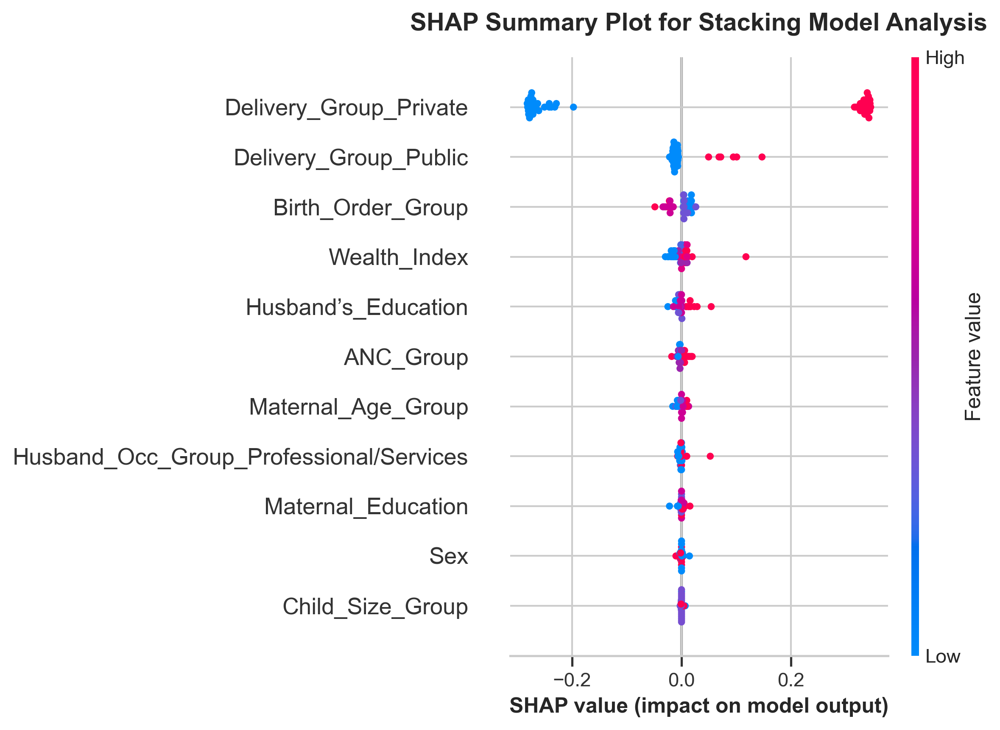

In [63]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# --- SHAP Interpretation: Stacking Ensemble Model Analysis ---
# This script performs a model-agnostic interpretation of the Stacking Ensemble 
# using KernelSHAP to capture the non-linear interactions of the ensemble.

# 1. Data Transformation: Aligning data with the Stacking Pipeline
X_trans_stack = stacking_pipeline.named_steps['scaler'].transform(X_train)
X_trans_stack = stacking_pipeline.named_steps['selector'].transform(X_trans_stack)

# 2. Model Extraction: Isolating the trained Stacking Classifier
# Unique name to avoid overwriting model_lr
model_stack = stacking_pipeline.named_steps['classifier']

# 3. Sample Selection: Observation window for KernelSHAP
# Selecting 50 samples (KernelSHAP is computationally expensive)
X_sample_stack = X_trans_stack[:50]

# 4. KernelExplainer Initialization: Using predict_proba for class contributions
# Note: This step may take a few minutes to run.
explainer_stack = shap.KernelExplainer(model_stack.predict_proba, X_sample_stack)

# 5. SHAP Values Computation
shap_values_stack = explainer_stack.shap_values(X_sample_stack)

# 6. Output Consistency Logic: Mapping to the Positive Class (C-section)
if isinstance(shap_values_stack, list):
    # Standard output for KernelExplainer on many models is [neg_class, pos_class]
    shap_stack_final = shap_values_stack[1]
else:
    # Handling different SHAP output dimensions (3D arrays)
    if len(shap_values_stack.shape) == 3:
        shap_stack_final = shap_values_stack[:, :, 1]
    else:
        shap_stack_final = shap_values_stack

# 7. CALCULATING MEAN ABSOLUTE SHAP (Critical for the Comparison Plot)
# Unique variable for the Stacking bar in your final chart
mean_shap_stack = np.abs(shap_stack_final).mean(axis=0)

# 8. Professional Visualization: SHAP Summary Plot
plt.figure(figsize=(10, 8), dpi=300)

shap.summary_plot(
    shap_stack_final, 
    X_sample_stack, 
    feature_names=np.array(X.columns)[final_feature_mask], 
    show=False
)

# Academic Formatting for Thesis
plt.title("SHAP Summary Plot for Stacking Model Analysis", 
          fontsize=14, fontweight='bold', pad=15)
plt.xlabel("SHAP value (impact on model output)", fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


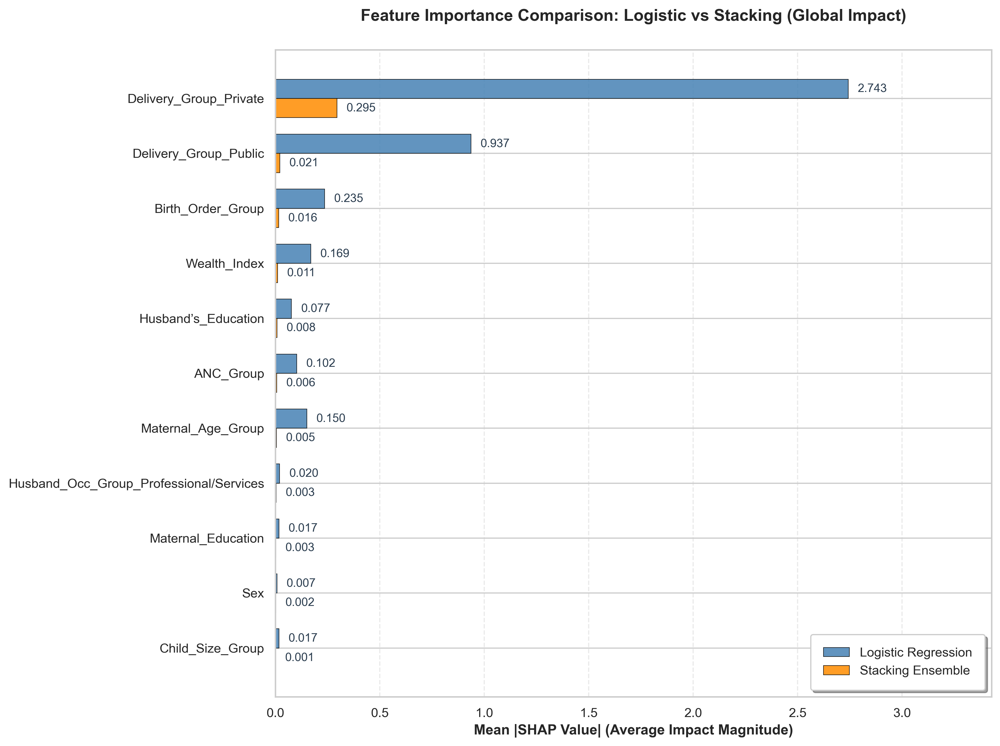


--- Feature Importance Table ---
                                Feature  Logistic Regression  Stacking Ensemble
                 Delivery_Group_Private             2.742954           0.295215
                  Delivery_Group_Public             0.936868           0.021283
                      Birth_Order_Group             0.235338           0.016157
                           Wealth_Index             0.168851           0.010839
                    Husband’s_Education             0.076965           0.007955
                              ANC_Group             0.101998           0.005624
                     Maternal_Age_Group             0.149890           0.005040
Husband_Occ_Group_Professional/Services             0.020399           0.003236
                     Maternal_Education             0.016771           0.002568
                                    Sex             0.007052           0.001770
                       Child_Size_Group             0.017367           0.000886


In [64]:

# --- Feature Importance Comparison: Logistic vs Stacking ---
# This script aggregates the mean absolute SHAP values from both models
# to compare how each model prioritizes the selected features.

# 1. Data Preparation: Aligning features with their calculated impact
# Ensure final_feature_mask and X are defined from your previous steps
feature_names = np.array(X.columns)[final_feature_mask]

# Creating a comparison DataFrame
comparison_df = pd.DataFrame({
    'Feature': feature_names,
    'Logistic Regression': mean_shap_lr,
    'Stacking Ensemble': mean_shap_stack
})

# Sorting by Stacking Ensemble impact for a cleaner visualization
comparison_df = comparison_df.sort_values('Stacking Ensemble', ascending=False).reset_index(drop=True)

# 2. Visualization Setup
fig, ax = plt.subplots(figsize=(12, 9), dpi=300)
y = np.arange(len(comparison_df))
width = 0.35  # Width of the bars

# 3. Plotting Horizontal Bars
rects1 = ax.barh(y - width/2, comparison_df['Logistic Regression'], width, 
                label='Logistic Regression', color='#4682B4', alpha=0.85, edgecolor='black', linewidth=0.5)
rects2 = ax.barh(y + width/2, comparison_df['Stacking Ensemble'], width, 
                label='Stacking Ensemble', color='#FF8C00', alpha=0.85, edgecolor='black', linewidth=0.5)

# 4. Adding Value Labels (Precise SHAP values at the end of bars)
def add_labels(rects):
    for rect in rects:
        width_val = rect.get_width()
        ax.annotate(f'{width_val:.3f}',
                    xy=(width_val, rect.get_y() + rect.get_height() / 2),
                    xytext=(8, 0), 
                    textcoords="offset points",
                    ha='left', va='center', fontsize=10, color='#2c3e50')

add_labels(rects1)
add_labels(rects2)

# 5. Axis Customization & Styling
ax.set_yticks(y)
ax.set_yticklabels(comparison_df['Feature'], fontsize=11, fontweight='500')
ax.set_xlabel('Mean |SHAP Value| (Average Impact Magnitude)', fontsize=12, fontweight='bold')
ax.set_title('Feature Importance Comparison: Logistic vs Stacking (Global Impact)', 
             fontsize=14, fontweight='bold', pad=25)

# Legend placement (Lower Right for clarity)
ax.legend(loc='lower right', fontsize=11, frameon=True, shadow=True, borderpad=1)

# Inverting y-axis so the most important feature is at the top
ax.invert_yaxis() 

# Adding subtle gridlines for better readability
ax.grid(axis='x', linestyle='--', alpha=0.4)

# Adjusting x-limit to prevent labels from being cut off
ax.set_xlim(0, max(comparison_df['Logistic Regression'].max(), comparison_df['Stacking Ensemble'].max()) * 1.25)

# 6. Final Layout Adjustment
plt.tight_layout()
plt.show()

# Optional: Print the comparison table for manual inspection
print("\n--- Feature Importance Table ---")
print(comparison_df.to_string(index=False))

<Figure size 2400x1800 with 0 Axes>

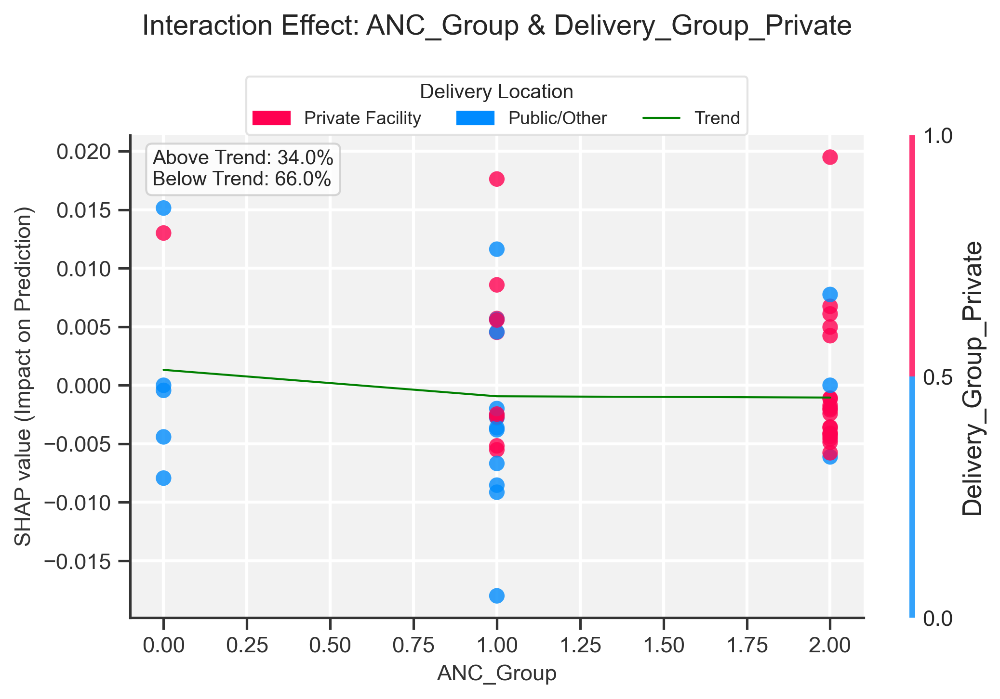

In [68]:
import shap
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess

def plot_shap_interaction_final(main_feat, color_feat, shap_values, X_data, feature_names):
    """
    Generates a SHAP interaction plot with a refined, smaller legend 
    and non-bold labels for a cleaner look.
    """
    
    fig = plt.figure(figsize=(8, 6), dpi=300)
    
    if main_feat in feature_names and color_feat in feature_names:
        # 1. Base SHAP dependence plot
        shap.dependence_plot(
            main_feat, 
            shap_values, 
            X_data, 
            feature_names=feature_names,
            interaction_index=color_feat,
            alpha=0.8,
            dot_size=60, 
            show=False
        )
        
        ax = plt.gca()
        idx = feature_names.index(main_feat)
        x_vals = X_data.iloc[:, idx].values
        y_vals = shap_values[:, idx]
        
        # 2. Add Orange Trend Line
        sns.regplot(x=x_vals, y=y_vals, scatter=False, lowess=True, 
                    color='green', ax=ax, line_kws={'linewidth': 1})

        # 3. Percentage Calculation
        z = lowess(y_vals, x_vals)
        y_trend_mapped = np.interp(x_vals, z[:, 0], z[:, 1])
        
        above_pct = (np.sum(y_vals > y_trend_mapped) / len(y_vals)) * 100
        below_pct = (np.sum(y_vals < y_trend_mapped) / len(y_vals)) * 100

        # 4. Display Percentages (Non-bold)
        stats_text = f"Above Trend: {above_pct:.1f}%\nBelow Trend: {below_pct:.1f}%"
        ax.text(0.03, 0.97, stats_text, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='#cccccc'))

        # 5. Aesthetic Customization
        ax.grid(axis='both', linestyle='-', color='white', linewidth=1.5)
        ax.set_facecolor('#f2f2f2') 
        
        ax.set_title(f"Interaction Effect: {main_feat} & {color_feat}", fontsize=14, pad=50)
        ax.set_xlabel(f"{main_feat}", fontsize=11)
        ax.set_ylabel('SHAP value (Impact on Prediction)', fontsize=11)
        
        # 6. Refined & Smaller Legend
        colors = ['#ff0051', '#008bff'] 
        if color_feat == 'Delivery_Group_Private':
            labels = ['Private Facility', 'Public/Other']
            leg_title = 'Delivery Location'
        elif color_feat == 'Wealth_Index':
            labels = ['Richest Quintile', 'Poorest Quintile']
            leg_title = 'Socio-economic Status'
        else:
            labels = ['High Value', 'Low Value']
            leg_title = f'Interaction: {color_feat}'
        
        # Trend line handle as a thin line
        custom_legend_handles = [
            mpatches.Patch(color=colors[0], label=labels[0]),
            mpatches.Patch(color=colors[1], label=labels[1]),
            plt.Line2D([0], [0], color='Green', lw=1, label='Trend')
        ]
        
        # Legend styling: smaller font, no bold, smaller scale
        legend_obj = ax.legend(handles=custom_legend_handles, 
                               loc='upper center', 
                               title=leg_title, 
                               bbox_to_anchor=(0.5, 1.14), 
                               ncol=3, 
                               frameon=True, 
                               prop={'size': 9}, 
                               title_fontsize=10)
        
        legend_obj.get_frame().set_facecolor('white')
        legend_obj.get_frame().set_edgecolor('#dddddd')

        plt.tight_layout()
        plt.show()

# --- Execution ---
plot_shap_interaction_final(
    main_feat='ANC_Group', 
    color_feat='Delivery_Group_Private', 
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

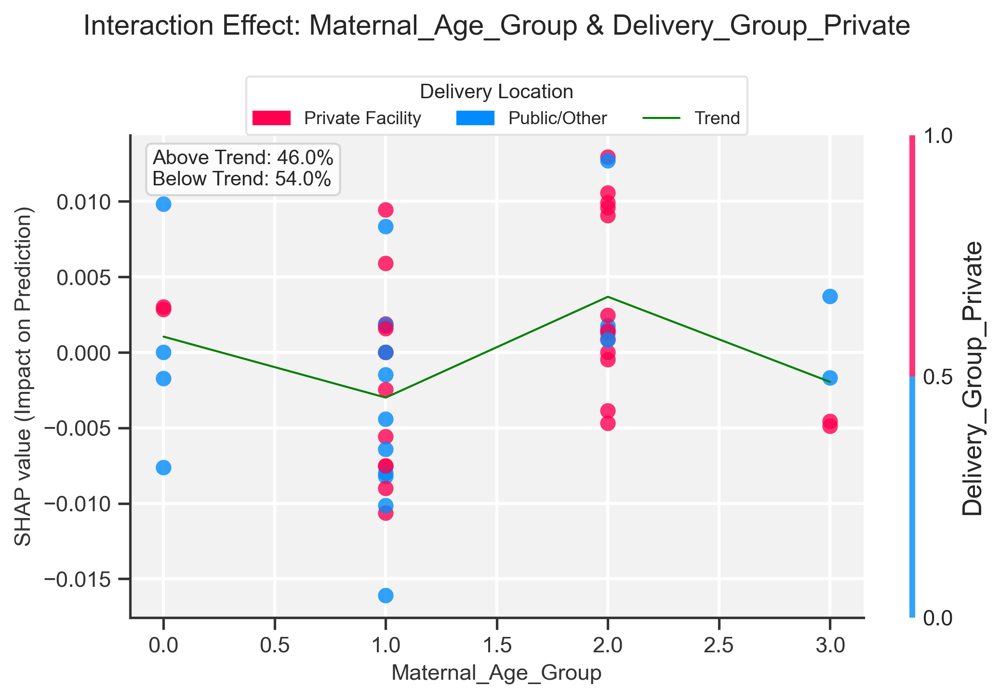

In [69]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat='Maternal_Age_Group', 
     color_feat='Delivery_Group_Private', 
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

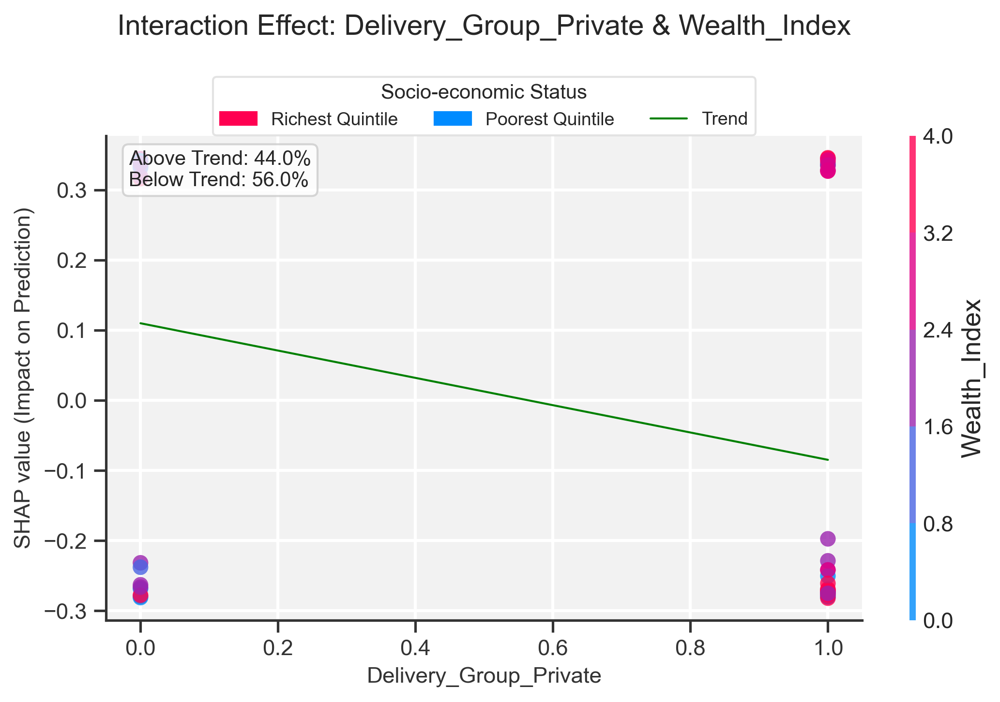

In [70]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat='Delivery_Group_Private', 
     color_feat='Wealth_Index', 
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

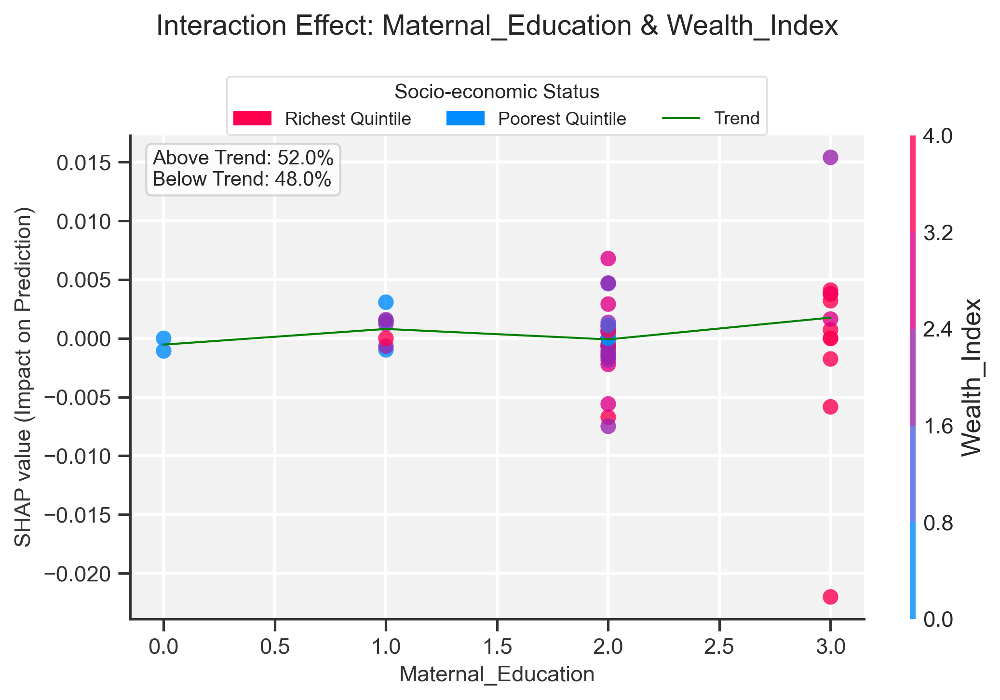

In [72]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat = 'Maternal_Education',
     color_feat = 'Wealth_Index',
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

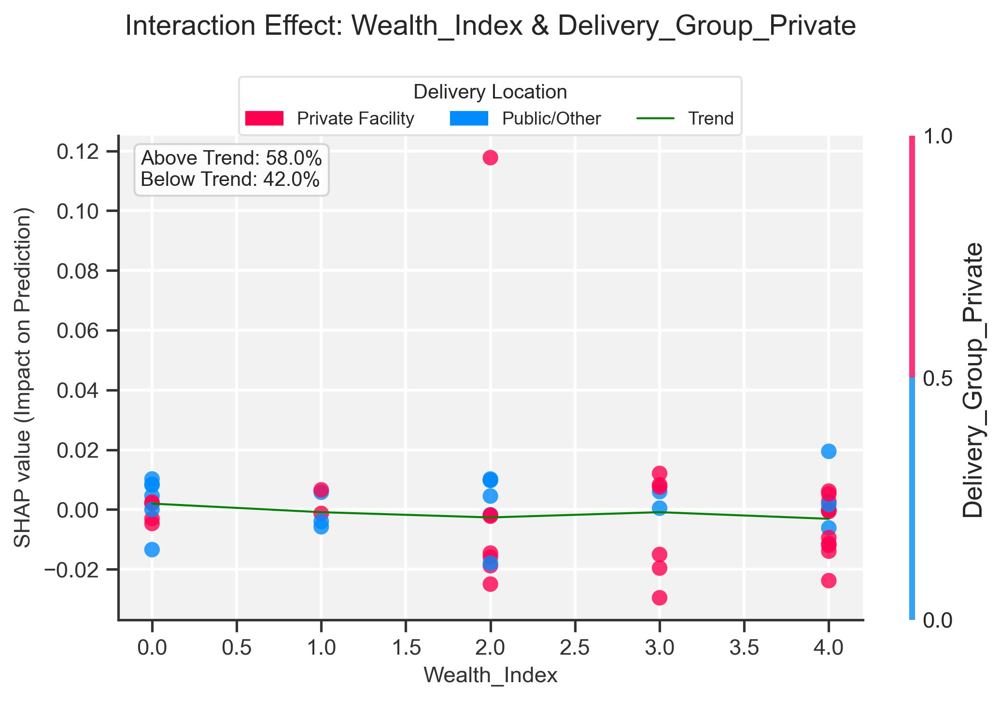

In [73]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat = 'Wealth_Index',
     color_feat = 'Delivery_Group_Private',
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

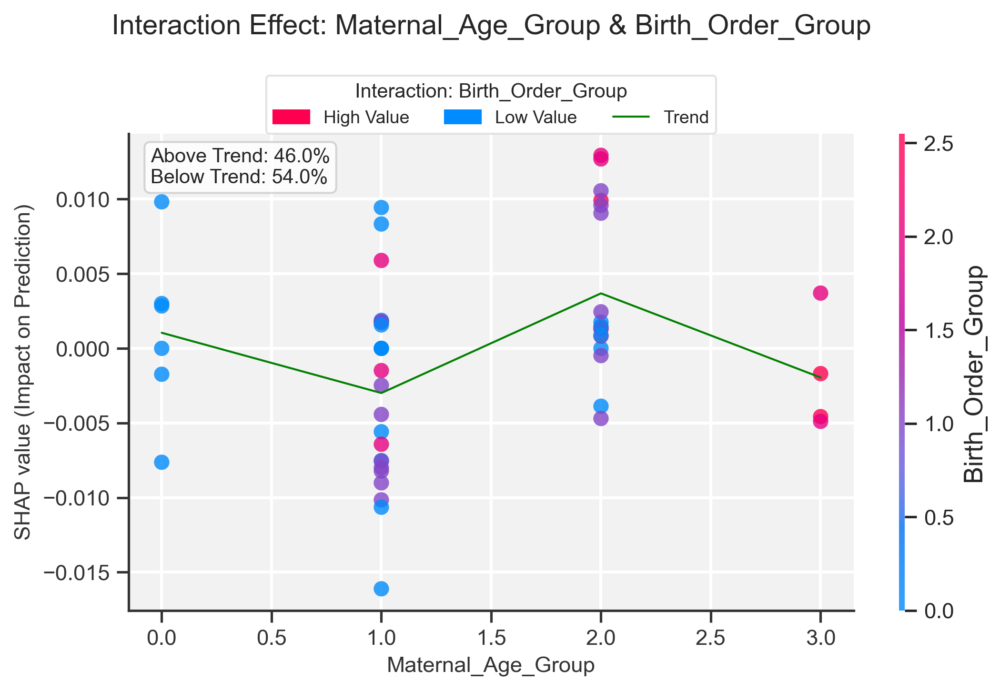

In [74]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat = 'Maternal_Age_Group',
     color_feat = 'Birth_Order_Group',
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

<Figure size 2400x1800 with 0 Axes>

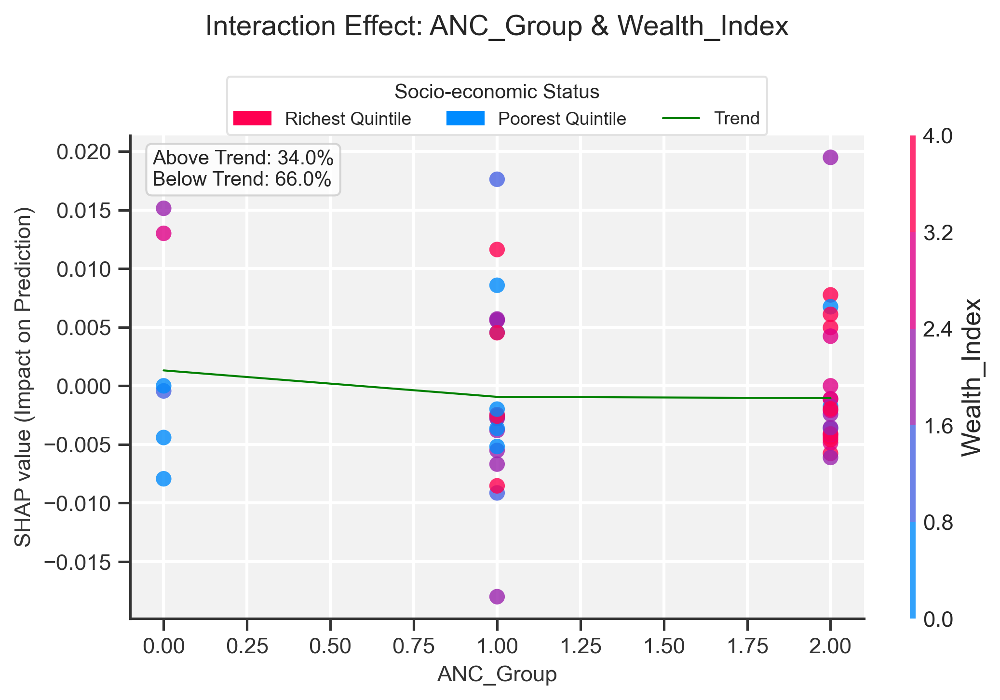

In [75]:
# --- Execution ---
plot_shap_interaction_final(
     main_feat = 'ANC_Group',
     color_feat = 'Wealth_Index',
    shap_values=shap_stack_final, 
    X_data=X_test[np.array(X.columns)[final_feature_mask]].iloc[:50], 
    feature_names=np.array(X.columns)[final_feature_mask].tolist()
)

In [76]:
# নিশ্চিত করুন যে আপনার কাছে X_test এবং feature_names আগে থেকেই আছে
# টেস্ট সেটের প্রথম ৫০টি স্যাম্পল আলাদা করা হচ্ছে
X_test_original_sample = X_test[feature_names].iloc[:50]

print("Variable 'X_test_original_sample' is now defined.")

Variable 'X_test_original_sample' is now defined.


In [77]:
import shap
import matplotlib.pyplot as plt
import numpy as np

def plot_local_waterfall(sample_idx, shap_values_matrix, explainer, X_original_data):
    """
    Generates a professional Waterfall Plot for a specific sample index.
    
    Parameters:
    sample_idx (int): The index of the sample to explain (from 0 to 49).
    shap_values_matrix (np.array): The matrix of SHAP values (e.g., shap_stack_final).
    explainer (shap.Explainer): The SHAP explainer object used for expected value.
    X_original_data (pd.DataFrame): The unscaled test data for feature labels.
    """
    
    # 1. Extract the scalar base value (expected value) for the positive class
    raw_expected_val = explainer.expected_value
    if isinstance(raw_expected_val, (list, np.ndarray)):
        # Usually index [1] represents the positive class (C-section)
        base_val = raw_expected_val[1] if len(raw_expected_val) > 1 else raw_expected_val[0]
    else:
        base_val = raw_expected_val

    # 2. Extract specific SHAP values and feature information
    specific_shap_values = shap_values_matrix[sample_idx]
    feature_names = X_original_data.columns.tolist()
    feature_values = X_original_data.iloc[sample_idx].values
    
    # 3. Create the visualization
    plt.figure(figsize=(12, 8), dpi=300)
    
    # Use waterfall_legacy for compatibility with KernelExplainer/Stacking outputs
    shap.plots._waterfall.waterfall_legacy(
        base_val, 
        specific_shap_values, 
        features=feature_values, 
        feature_names=feature_names,
        max_display=len(feature_names),
        show=False
    )

    # 4. Professional Styling Refinements
    ax = plt.gca()
    
    # Clean up the plot aesthetics
    ax.set_facecolor('#ffffff') # White background for a clean look
    plt.title(f"Local Explanation: Case Analysis (Sample Index {sample_idx})", 
              fontsize=15, pad=30, fontweight='medium')
    plt.xlabel("SHAP Value (Contribution to C-section Probability)", fontsize=11, labelpad=10)
    
    # Removing bold from feature labels for a standard academic look
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)

    # Add a thin gray grid for better readability
    ax.xaxis.grid(color='gray', linestyle=':', alpha=0.3)
    ax.set_axisbelow(True)

    plt.tight_layout()
    plt.show()


In [78]:
def get_patient_profile(sample_idx, X_data, y_data, shap_values_matrix, explainer):
    """
    Prints a detailed profile of a specific patient and their model outcome.
    """
    print(f"\n" + "="*50)
    print(f"      DETAILED PROFILE FOR SAMPLE INDEX: {sample_idx}")
    print("="*50)

    # 1. Feature Profile
    profile = X_data.iloc[sample_idx]
    print(f"{'FEATURE':<25} | {'VALUE'}")
    print("-" * 40)
    for feature, value in profile.items():
        print(f"{feature:<25} : {value}")

    print("-" * 40)

    # 2. Actual Outcome
    actual = y_data.iloc[sample_idx]
    actual_status = "C-section" if actual == 1 else "Normal Delivery"
    print(f"ACTUAL OUTCOME IN DATASET  : {actual_status}")

    # 3. Model Prediction (SHAP based)
    base_val = explainer.expected_value[1] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value
    prediction_prob = shap_values_matrix[sample_idx].sum() + base_val
    
    pred_status = "C-section" if prediction_prob > 0.5 else "Normal Delivery"
    print(f"MODEL'S PREDICTED PROB.    : {prediction_prob:.2f} ({pred_status})")
    print("="*50 + "\n")


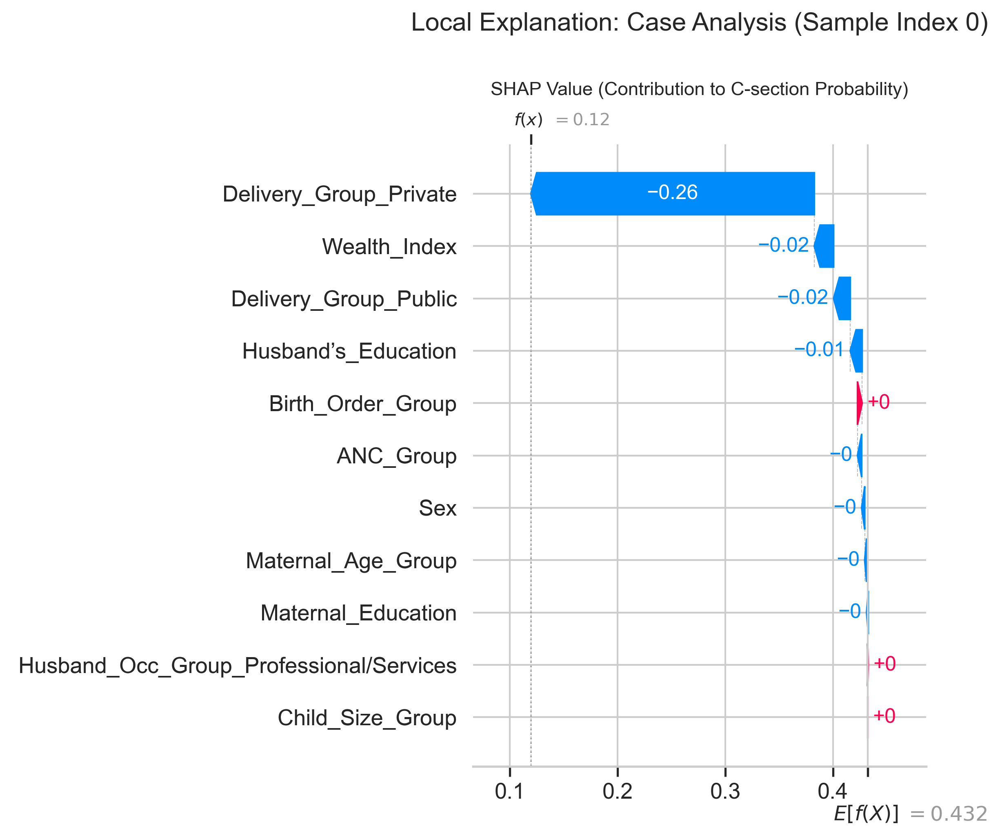


      DETAILED PROFILE FOR SAMPLE INDEX: 0
FEATURE                   | VALUE
----------------------------------------
Sex                       : 0
Maternal_Education        : 2
Wealth_Index              : 2
Husband’s_Education       : 2
ANC_Group                 : 1
Child_Size_Group          : 1
Maternal_Age_Group        : 0
Birth_Order_Group         : 0
Delivery_Group_Private    : 0
Delivery_Group_Public     : 0
Husband_Occ_Group_Professional/Services : 1
----------------------------------------
ACTUAL OUTCOME IN DATASET  : Normal Delivery
MODEL'S PREDICTED PROB.    : 0.12 (Normal Delivery)



In [79]:
# --- HOW TO RUN ---
# Change 'sample_idx' to analyze different patients
plot_local_waterfall(
    sample_idx=0, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack, 
    X_original_data=X_test_original_sample
)
# --- HOW TO RUN ---
get_patient_profile(
    sample_idx=0, 
    X_data=X_test_original_sample, 
    y_data=y_test, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack
)

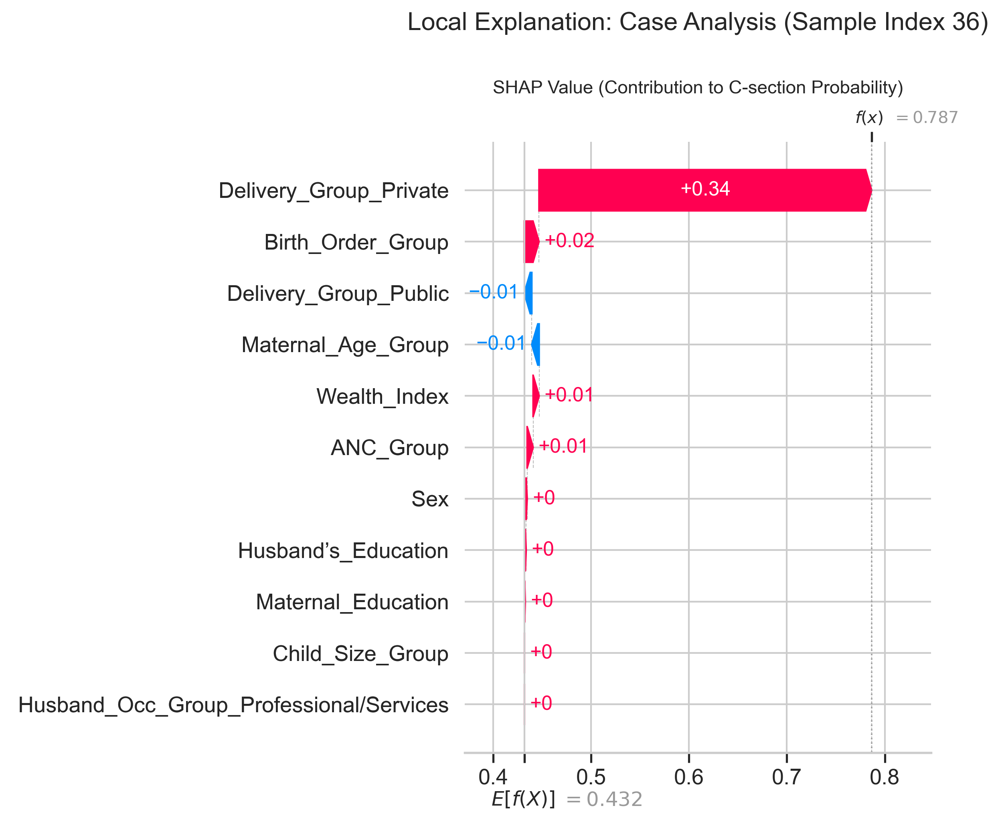


      DETAILED PROFILE FOR SAMPLE INDEX: 36
FEATURE                   | VALUE
----------------------------------------
Sex                       : 1
Maternal_Education        : 2
Wealth_Index              : 4
Husband’s_Education       : 1
ANC_Group                 : 2
Child_Size_Group          : 1
Maternal_Age_Group        : 1
Birth_Order_Group         : 0
Delivery_Group_Private    : 1
Delivery_Group_Public     : 0
Husband_Occ_Group_Professional/Services : 0
----------------------------------------
ACTUAL OUTCOME IN DATASET  : C-section
MODEL'S PREDICTED PROB.    : 0.79 (C-section)



In [81]:
# --- HOW TO RUN ---
# Change 'sample_idx' to analyze different patients
plot_local_waterfall(
    sample_idx=36, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack, 
    X_original_data=X_test_original_sample
)
# --- HOW TO RUN ---
get_patient_profile(
    sample_idx=36, 
    X_data=X_test_original_sample, 
    y_data=y_test, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack
)

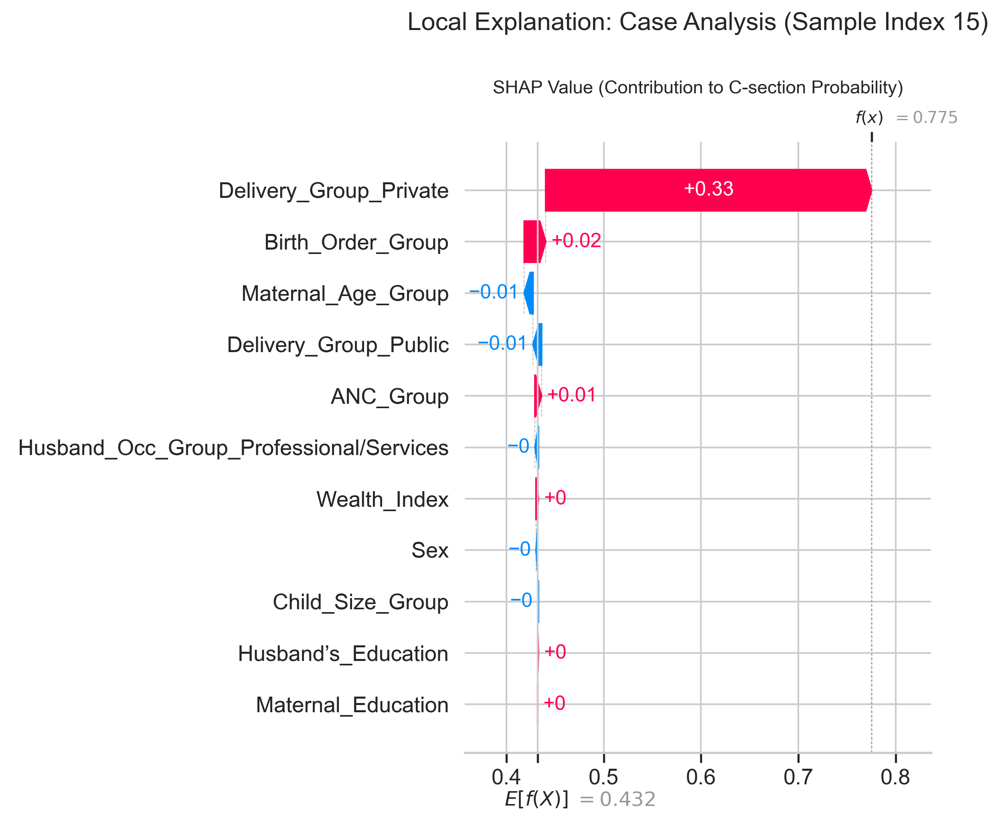


      DETAILED PROFILE FOR SAMPLE INDEX: 15
FEATURE                   | VALUE
----------------------------------------
Sex                       : 1
Maternal_Education        : 2
Wealth_Index              : 0
Husband’s_Education       : 2
ANC_Group                 : 2
Child_Size_Group          : 1
Maternal_Age_Group        : 1
Birth_Order_Group         : 1
Delivery_Group_Private    : 1
Delivery_Group_Public     : 0
Husband_Occ_Group_Professional/Services : 0
----------------------------------------
ACTUAL OUTCOME IN DATASET  : C-section
MODEL'S PREDICTED PROB.    : 0.78 (C-section)



In [82]:
# --- HOW TO RUN ---
# Change 'sample_idx' to analyze different patients
plot_local_waterfall(
    sample_idx=15, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack, 
    X_original_data=X_test_original_sample
)
# --- HOW TO RUN ---
get_patient_profile(
    sample_idx=15, 
    X_data=X_test_original_sample, 
    y_data=y_test, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack
)

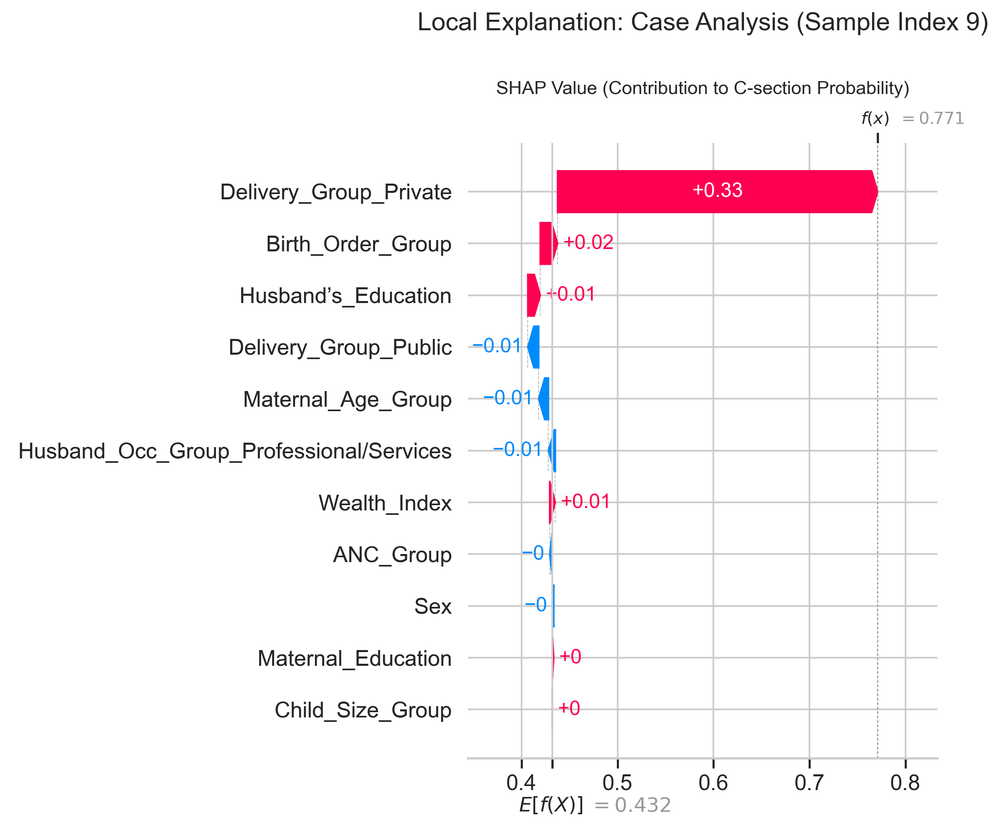


      DETAILED PROFILE FOR SAMPLE INDEX: 9
FEATURE                   | VALUE
----------------------------------------
Sex                       : 0
Maternal_Education        : 1
Wealth_Index              : 1
Husband’s_Education       : 1
ANC_Group                 : 1
Child_Size_Group          : 1
Maternal_Age_Group        : 1
Birth_Order_Group         : 1
Delivery_Group_Private    : 0
Delivery_Group_Public     : 1
Husband_Occ_Group_Professional/Services : 0
----------------------------------------
ACTUAL OUTCOME IN DATASET  : Normal Delivery
MODEL'S PREDICTED PROB.    : 0.77 (C-section)



In [83]:
# --- HOW TO RUN ---
# Change 'sample_idx' to analyze different patients
plot_local_waterfall(
    sample_idx=9, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack, 
    X_original_data=X_test_original_sample
)
# --- HOW TO RUN ---
get_patient_profile(
    sample_idx=9, 
    X_data=X_test_original_sample, 
    y_data=y_test, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack
)

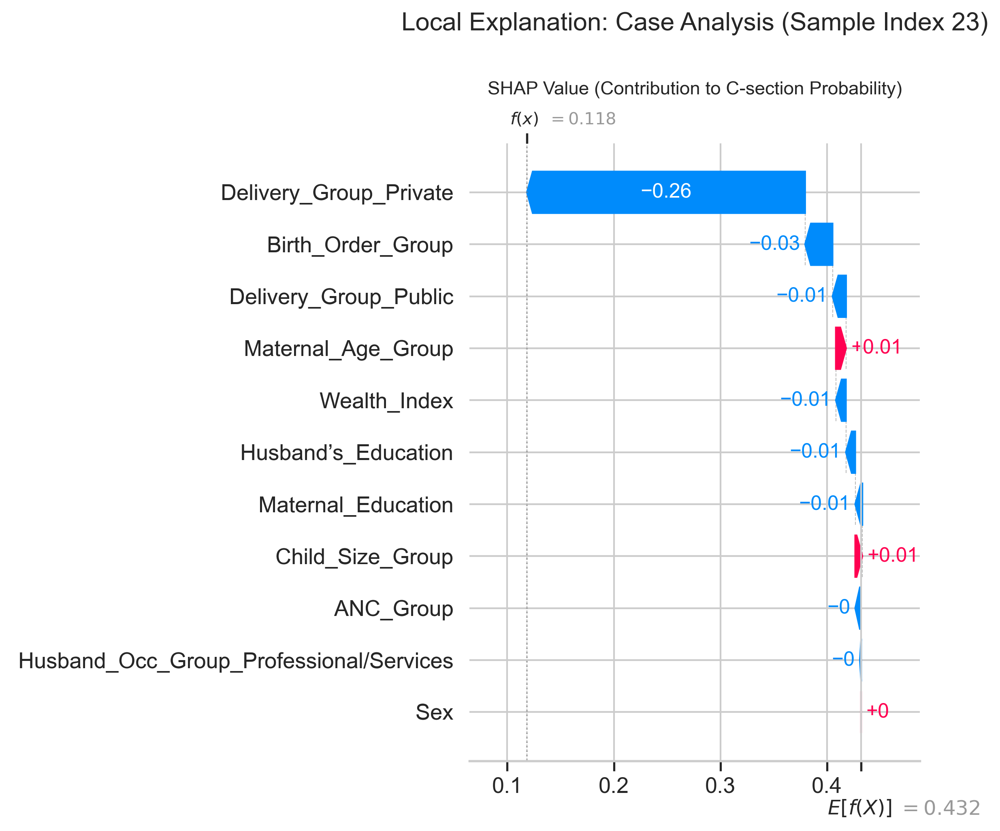


      DETAILED PROFILE FOR SAMPLE INDEX: 23
FEATURE                   | VALUE
----------------------------------------
Sex                       : 0
Maternal_Education        : 2
Wealth_Index              : 4
Husband’s_Education       : 2
ANC_Group                 : 2
Child_Size_Group          : 0
Maternal_Age_Group        : 2
Birth_Order_Group         : 1
Delivery_Group_Private    : 1
Delivery_Group_Public     : 0
Husband_Occ_Group_Professional/Services : 1
----------------------------------------
ACTUAL OUTCOME IN DATASET  : C-section
MODEL'S PREDICTED PROB.    : 0.12 (Normal Delivery)



In [84]:
# --- HOW TO RUN ---
# Change 'sample_idx' to analyze different patients
plot_local_waterfall(
    sample_idx=23, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack, 
    X_original_data=X_test_original_sample
)
# --- HOW TO RUN ---
get_patient_profile(
    sample_idx=23, 
    X_data=X_test_original_sample, 
    y_data=y_test, 
    shap_values_matrix=shap_stack_final, 
    explainer=explainer_stack
)

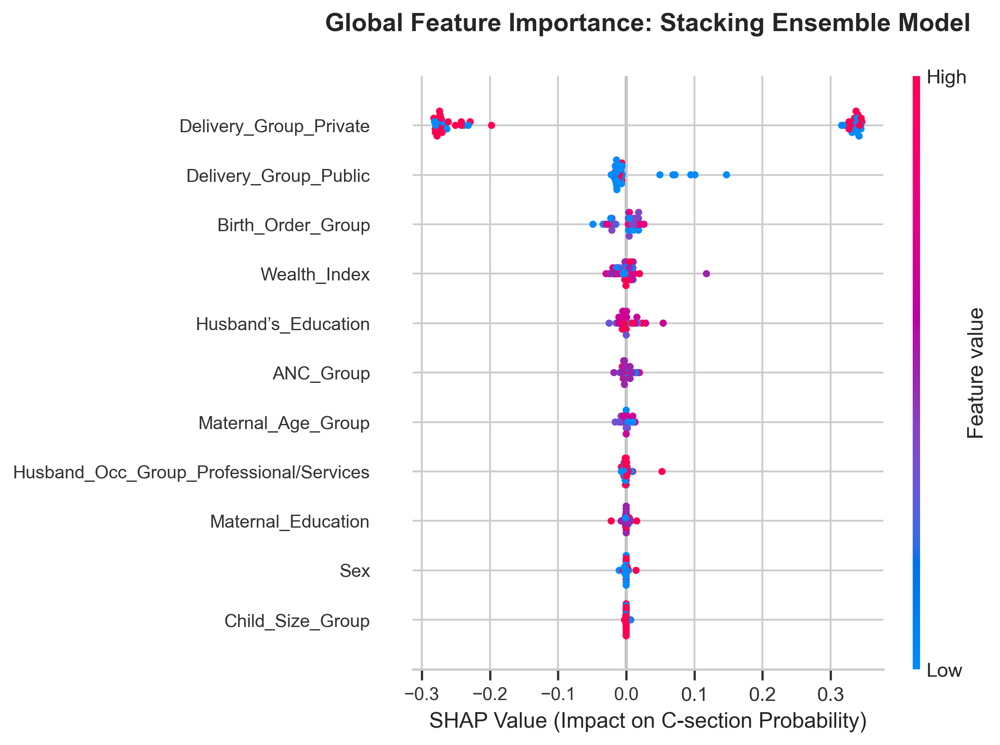

In [85]:
import shap
import matplotlib.pyplot as plt

# 1. Ensure all necessary variables are defined to avoid NameError
# Extract feature names directly from the dataframe columns
feature_names_list = X_test_original_sample.columns.tolist()

# 2. Initialize the plot with high resolution for thesis/publication
plt.figure(figsize=(10, 8), dpi=300)

# 3. Generate the SHAP Summary Plot (Beeswarm)
# This plot visualizes the distribution of the impact each feature has on the model output
shap.summary_plot(
    shap_stack_final, 
    X_test_original_sample, 
    feature_names=feature_names_list, 
    plot_type="dot", # Standard beeswarm dots
    show=False       # Set to False to allow for further customization
)

# 4. Professional Formatting and Labeling
plt.title("Global Feature Importance: Stacking Ensemble Model", fontsize=14, pad=25, fontweight='bold')
plt.xlabel("SHAP Value (Impact on C-section Probability)", fontsize=12)
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)

# 5. Final Layout adjustment and display
plt.tight_layout()
plt.show()

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D 

def plot_professional_inequality(shap_values_matrix, X_data, feature_name, title_name=None):
    """
    Generates a professional boxplot with custom Legend for Mean, Outliers, and Baseline.
    """
    # 1. Extract SHAP values
    feature_idx = list(X_data.columns).index(feature_name)
    feature_shap_values = shap_values_matrix[:, feature_idx]
    
    # 2. Setup Aesthetics
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(12, 7), dpi=300)
    
    # 3. Create Boxplot
    ax = sns.boxplot(
        x=X_data[feature_name], 
        y=feature_shap_values, 
        palette="vlag", 
        width=0.6,
        linewidth=1.5,
        fliersize=7,
        showmeans=True,
        meanprops={"marker":"o", "markerfacecolor":"blue", "markeredgecolor":"black", "markersize":"7"},
        flierprops={"markerfacecolor": "red", "markeredgecolor": "red"}
    )
    
    # 4. Add Baseline
    plt.axhline(0, color='green', linestyle='--', linewidth=1.2, alpha=0.7, label='Baseline (No Impact)')
    
    # 5. Create Custom Legend
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Mean Impact',
               markerfacecolor='blue', markersize=10, markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', label='Outliers (Extreme Cases)',
               markerfacecolor='red', markersize=10, markeredgecolor='red'),
        Line2D([0], [0], color='green', lw=2, linestyle='--', label='Baseline (Zero Impact)')
    ]
    
    ax.legend(handles=legend_elements, loc='upper right', fontsize=10, frameon=True, shadow=True)
    
    # 6. Labels and Titles
    display_title = title_name if title_name else f"Inequality Analysis: Impact of {feature_name} on C-section Prediction"
    plt.title(display_title, fontsize=16, pad=20, fontweight='bold')
    plt.xlabel(f"{feature_name} Levels (Socio-economic Gradient)", fontsize=12, labelpad=12)
    plt.ylabel("SHAP Value (Impact on Probability)", fontsize=12, labelpad=12)
    
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    sns.despine(offset=10, trim=True)
    
    plt.tight_layout()
    plt.show()


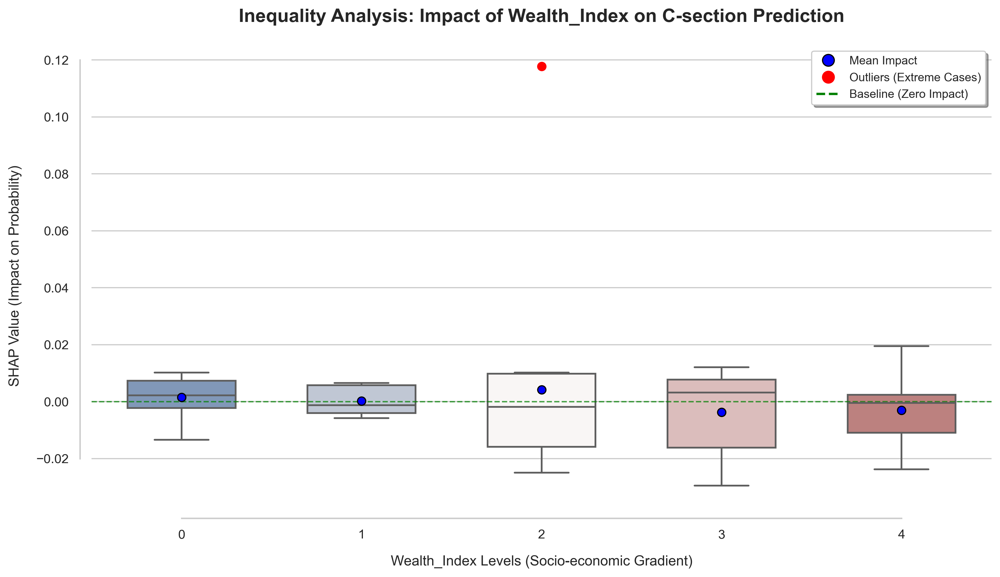

In [87]:
# ---Exicution---
plot_professional_inequality(
    shap_stack_final, 
    X_test_original_sample, 
    'Wealth_Index'
)

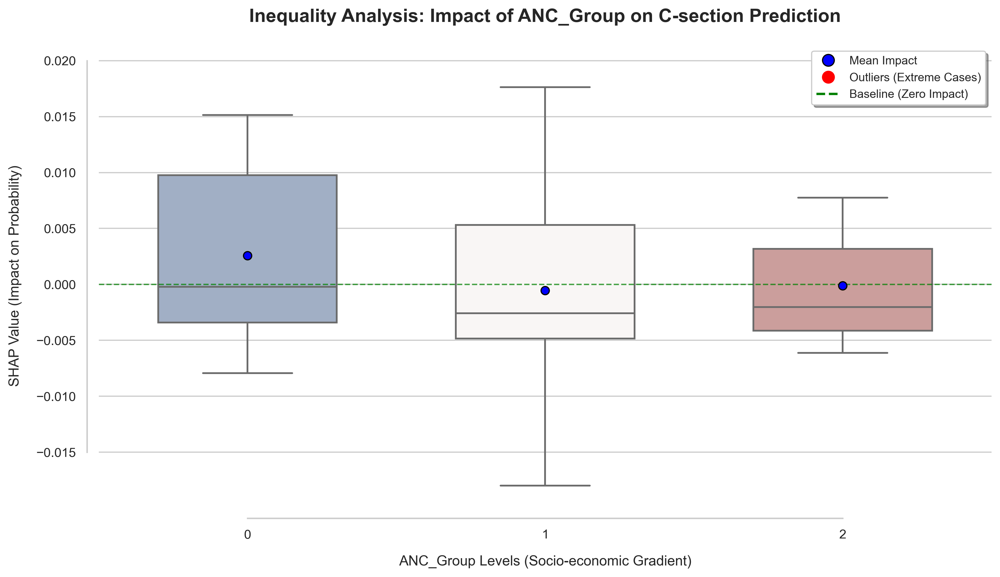

In [88]:
# ---Exicution---
plot_professional_inequality(
    shap_stack_final, 
    X_test_original_sample, 
    'ANC_Group'
)

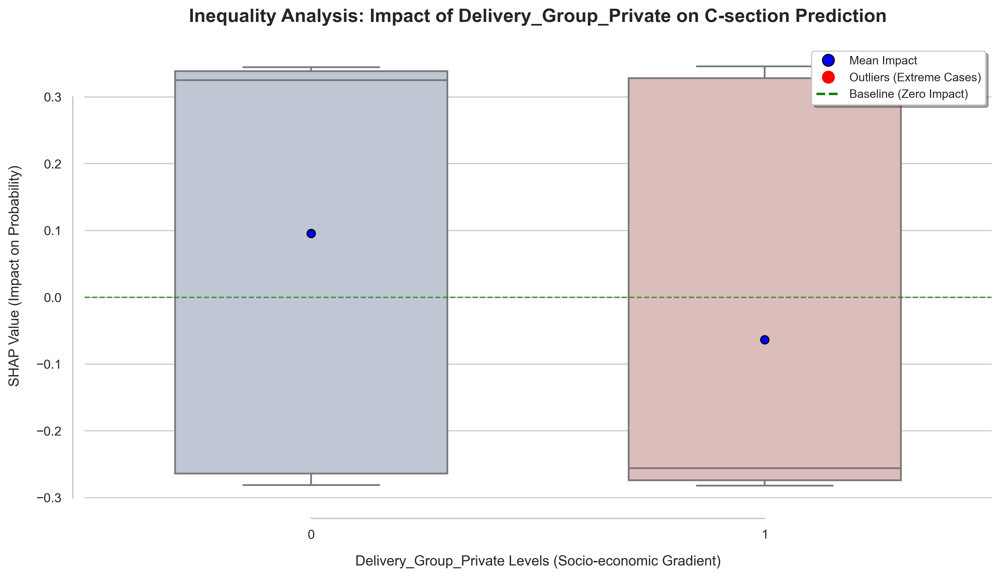

In [89]:
# ---Exicution---
plot_professional_inequality(
    shap_stack_final, 
    X_test_original_sample, 
    'Delivery_Group_Private'
)

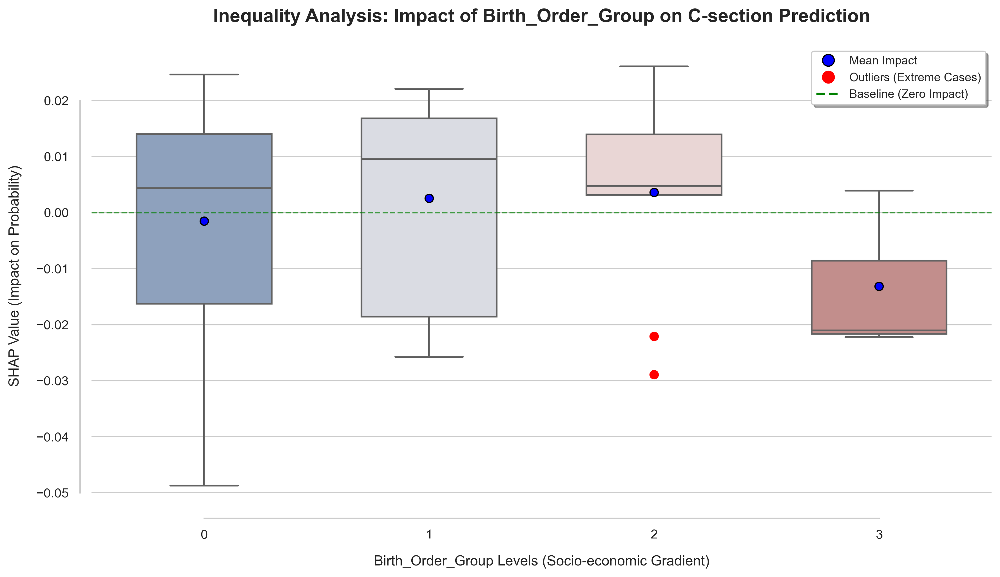

In [90]:
# ---Exicution---
plot_professional_inequality(
    shap_stack_final, 
    X_test_original_sample, 
    'Birth_Order_Group'
)

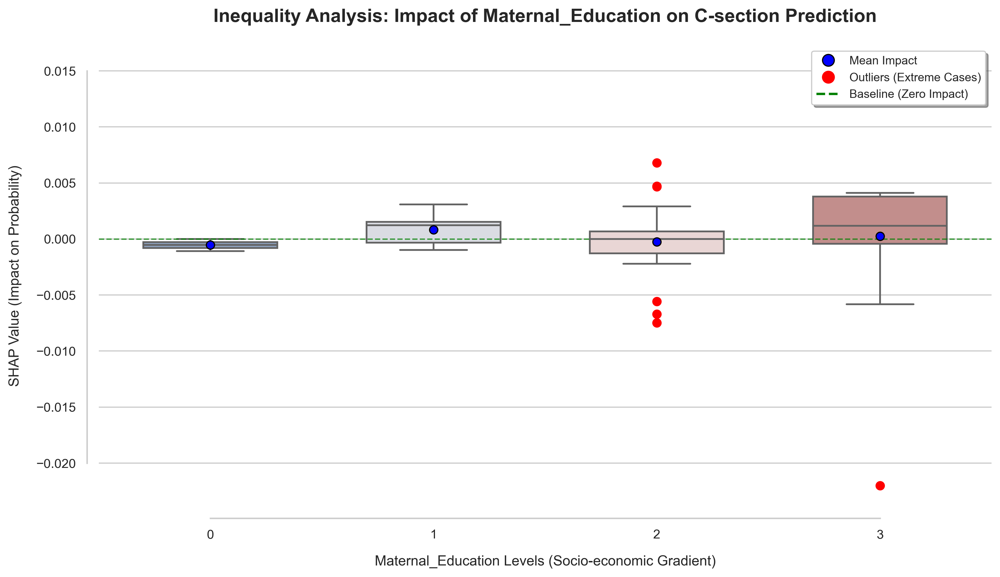

In [92]:
# ---Exicution---
plot_professional_inequality(
    shap_stack_final, 
    X_test_original_sample, 
    'Maternal_Education'
)

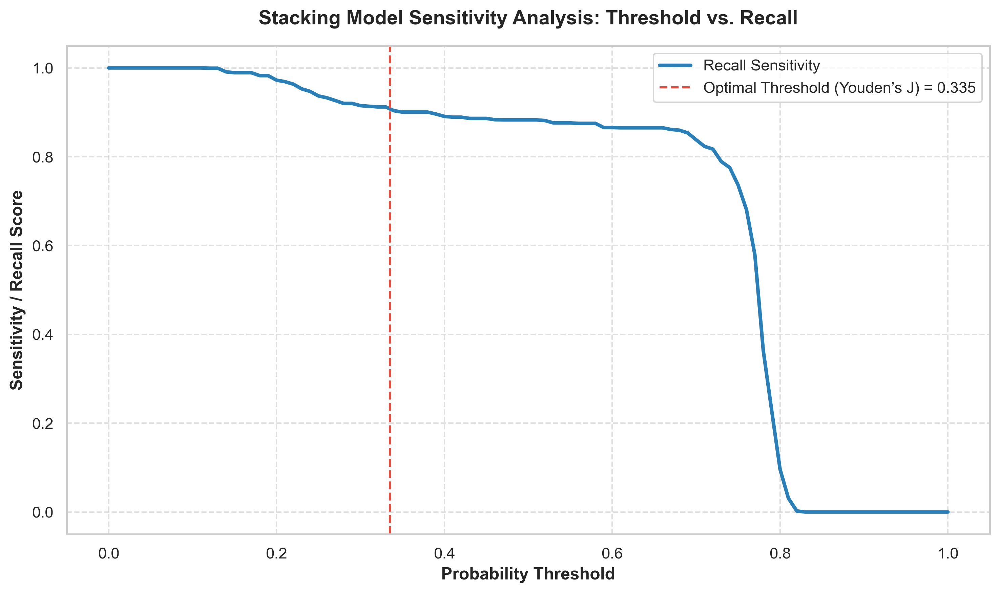


STACKING MODEL EVALUATION (OPTIMAL THRESHOLD)
Optimal Threshold        : 0.335
Sensitivity / Recall     : 0.912
Specificity              : 0.85
Accuracy                 : 0.878
Precision                : 0.833
F1-score                 : 0.871
ROC-AUC                  : 0.924


In [94]:
# ==========================================
# STACKING MODEL SENSITIVITY ANALYSIS (Overall)
# ==========================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.preprocessing import StandardScaler

def stacking_overall_sensitivity(X_test=None, y_test=None, w_test=None, stacking_model=None, final_feature_mask=None):
    """
    Performs an overall sensitivity analysis for the Stacking Ensemble model. 
    Identifies the optimal classification threshold using Youden's J statistic 
    and visualizes the trade-off between threshold selection and model recall.
    """
    
    # 1. Validation: Ensuring all necessary data and model components are provided
    if stacking_model is None or X_test is None or y_test is None or final_feature_mask is None:
        print("Warning: Missing required inputs. Exiting analysis.")
        return
    
    # 2. Pipeline Construction: Encapsulating scaling, selection, and the ensemble
    pipe = ImbPipeline(steps=[
        ('scaler', StandardScaler()),
        ('feature_selector', StaticFeatureSelector(final_feature_mask)),
        ('stacking', stacking_model)
    ])
    
    # 3. Model Fitting: Ensuring the pipeline state is synchronized with training data
    # Wrapped in a try-except block to handle cases where the base model is already pre-fitted
    try:
        pipe.fit(X_train, y_train, stacking__sample_weight=w_train)
    except Exception:
        pass  # Model is likely already fitted within the current session
    
    # 4. Probability Estimation: Generating raw risk scores for the test set
    y_probs = pipe.predict_proba(X_test)[:, 1]
    
    # 5. Threshold Optimization: Calculating Youden's J (Sensitivity + Specificity - 1)
    # Incorporating survey weights (w_test) for representative evaluation
    fpr, tpr, thresholds = roc_curve(y_test, y_probs, sample_weight=w_test)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    
    # 6. Binary Classification: Applying the calculated optimal threshold
    y_pred = (y_probs >= optimal_threshold).astype(int)
    
    # 7. Comprehensive Metric Calculation
    metrics = {
        "Optimal Threshold": round(optimal_threshold, 3),
        "Sensitivity / Recall": round(recall_score(y_test, y_pred, sample_weight=w_test), 3),
        "Specificity": round(1 - fpr[optimal_idx], 3),
        "Accuracy": round(accuracy_score(y_test, y_pred, sample_weight=w_test), 3),
        "Precision": round(precision_score(y_test, y_pred, sample_weight=w_test), 3),
        "F1-score": round(f1_score(y_test, y_pred, sample_weight=w_test), 3),
        "ROC-AUC": round(roc_auc_score(y_test, y_probs, sample_weight=w_test), 3)
    }
    
    # 8. Visualization: Sensitivity Curve across the probability spectrum
    # This helps determine how 'aggressive' the model is at different threshold levels
    thresholds_plot = np.linspace(0, 1, 101)
    sensitivity_curve = [recall_score(y_test, (y_probs >= t).astype(int), sample_weight=w_test) 
                         for t in thresholds_plot]
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.plot(thresholds_plot, sensitivity_curve, color='#2980b9', lw=2.5, label='Recall Sensitivity')
    
    # Highlighting the optimal point identified by Youden's J
    plt.axvline(optimal_threshold, color='#e74c3c', linestyle='--', 
                label=f'Optimal Threshold (Youden’s J) = {optimal_threshold:.3f}')
    
    # Aesthetic Formatting for Thesis/Report Inclusion
    plt.title("Stacking Model Sensitivity Analysis: Threshold vs. Recall", fontsize=14, fontweight='bold', pad=15)
    plt.xlabel("Probability Threshold", fontsize=12, fontweight='bold')
    plt.ylabel("Sensitivity / Recall Score", fontsize=12, fontweight='bold')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(frameon=True, loc='best')
    
    plt.tight_layout()
    plt.show()
    
    return metrics

# ==========================================
# Example Execution
# ==========================================
# Run the analysis on the survey-weighted test dataset
stacking_metrics = stacking_overall_sensitivity(
    X_test=X_test, 
    y_test=y_test, 
    w_test=w_test,
    stacking_model=models['Stacking'], 
    final_feature_mask=final_feature_mask
)

# Formal Printout of Results
print("\n" + "="*45)
print("STACKING MODEL EVALUATION (OPTIMAL THRESHOLD)")
print("="*45)
for metric, value in stacking_metrics.items():
    print(f"{metric:<25}: {value}")
print("="*45)

Running Robustness Stress Test (Data Perturbation)...


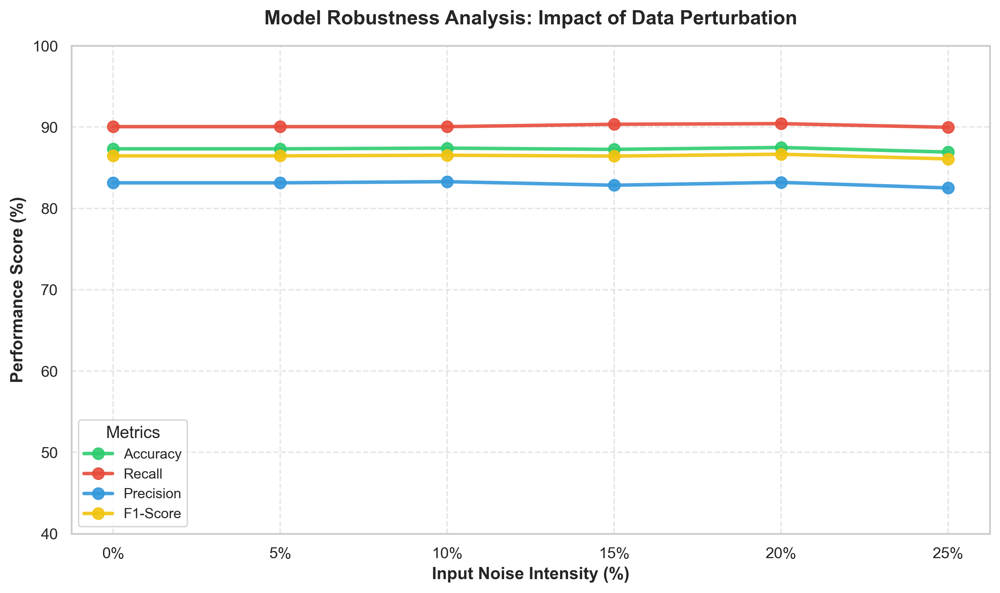

,Noise_Level_%,Accuracy,Recall,Precision,F1-Score
0,0.0,87.32,90.05,83.14,86.46
1,5.0,87.32,90.05,83.14,86.46
2,10.0,87.40,90.05,83.28,86.53
3,15.0,87.25,90.34,82.84,86.43
4,20.0,87.49,90.42,83.20,86.66
5,25.0,86.92,89.97,82.51,86.08


In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

# --- Robustness & Sensitivity Analysis: Gaussian Noise Perturbation ---
# This analysis evaluates how the Stacking Ensemble handles "noisy" or 
# imperfect data by injecting Gaussian perturbations into the test features.

# 1. Setup: Defining noise levels (Standard Deviations) and result storage
noise_levels = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25]
sensitivity_results = []

print("Running Robustness Stress Test (Data Perturbation)...")

for noise in noise_levels:
    # Applying Gaussian Noise: Simulating measurement errors or data variance
    # X_test_noisy = X_test_final + Noise ~ N(0, σ^2)
    X_test_noisy = X_test_final + np.random.normal(0, noise, X_test_final.shape)
    
    # Probability Estimation and Classification using the pre-optimized threshold
    y_probs_noisy = stacking_model.predict_proba(X_test_noisy)[:, 1]
    y_pred_noisy = (y_probs_noisy >= optimal_threshold).astype(int)
    
    # Metrics Calculation: Incorporating survey weights (w_test) for population accuracy
    sensitivity_results.append({
        "Noise_Level_%": noise * 100,
        "Accuracy": accuracy_score(y_test, y_pred_noisy, sample_weight=w_test) * 100,
        "Recall": recall_score(y_test, y_pred_noisy, sample_weight=w_test) * 100,
        "Precision": precision_score(y_test, y_pred_noisy, sample_weight=w_test) * 100,
        "F1-Score": f1_score(y_test, y_pred_noisy, sample_weight=w_test) * 100
    })

# 2. Result Compilation: Generating the sensitivity data table
sensitivity_df = pd.DataFrame(sensitivity_results)

# 3. Professional Visualization: Line Plot for Performance Decay
plt.figure(figsize=(10, 6), dpi=300)
sns.set_style("whitegrid")

metrics = ["Accuracy", "Recall", "Precision", "F1-Score"]
colors = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f'] # Green, Red, Blue, Gold

for i, metric in enumerate(metrics):
    plt.plot(sensitivity_df["Noise_Level_%"], sensitivity_df[metric], 
             marker='o', markersize=8, linewidth=2.5, label=metric, color=colors[i], alpha=0.9)

# Aesthetic Formatting (Thesis/Publication Standard)
plt.title("Model Robustness Analysis: Impact of Data Perturbation", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Input Noise Intensity (%)", fontsize=12, fontweight='bold')
plt.ylabel("Performance Score (%)", fontsize=12, fontweight='bold')

# Formatting X-axis with percentage labels
plt.xticks([0, 5, 10, 15, 20, 25], ['0%', '5%', '10%', '15%', '20%', '25%'])

# Adjusting Y-axis to highlight the rate of performance decay (Recall often drops fastest)
plt.ylim(40, 100) 

plt.legend(title="Metrics", loc='lower left', frameon=True, fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)

# Final Layout Optimization and Save
plt.tight_layout()
# plt.savefig('Sensitivity_Analysis_Fixed.png', dpi=300)
plt.show()

# 4. Tabular Summary: Precise results for data reporting
display(sensitivity_df.round(2))

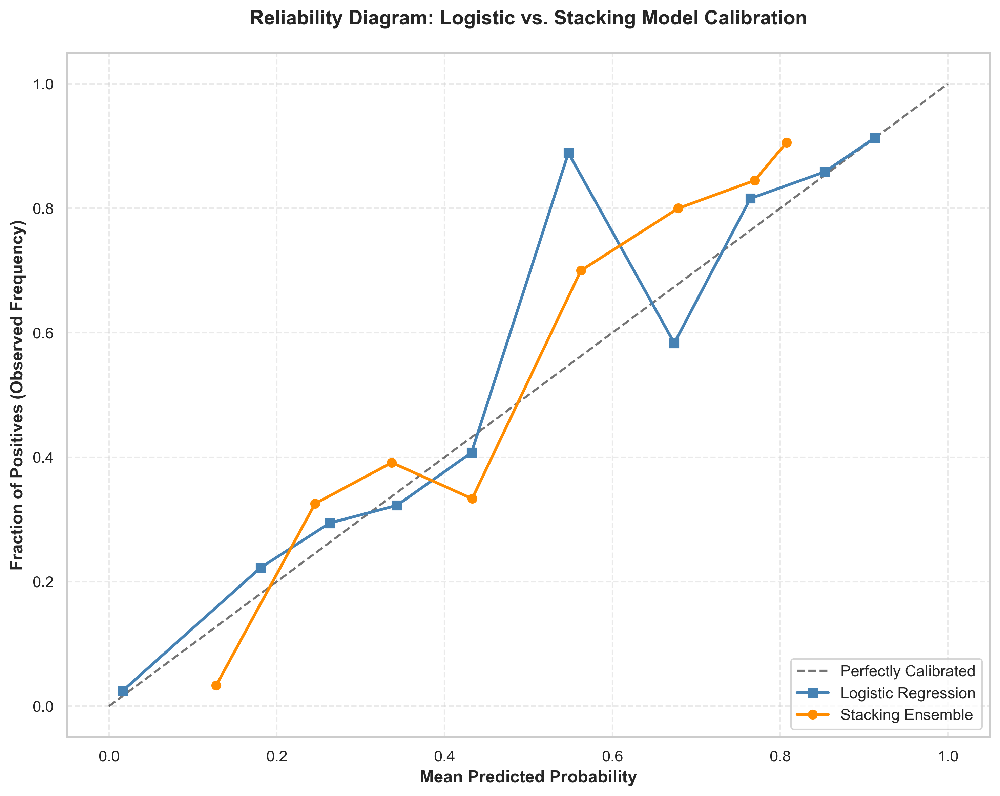

In [97]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

# --- Calibration Comparison: Logistic Regression vs. Stacking Ensemble ---
# This script generates a Reliability Diagram to compare how well the 
# predicted probabilities of both models align with real-world outcomes.

# 1. Probability Extraction
# Generating positive class probabilities for both the baseline and ensemble models
probs_lr = logit_pipeline.predict_proba(X_test)[:, 1]
probs_stack = stacking_pipeline.predict_proba(X_test)[:, 1]

# 2. Calibration Curve Calculation
# Computing the fraction of actual positives and the mean predicted value across 10 bins.
# Survey weights (w_test) should be passed if the dataset requires representative scaling.
fraction_of_positives_lr, mean_predicted_value_lr = calibration_curve(y_test, probs_lr, n_bins=10)
fraction_of_positives_stack, mean_predicted_value_stack = calibration_curve(y_test, probs_stack, n_bins=10)

# 3. Visualization Setup
plt.figure(figsize=(10, 8), dpi=300)

# (A) Perfect Calibration Reference Line
# A diagonal line representing a model where predicted probability equals actual frequency.
plt.plot([0, 1], [0, 1], "k--", label="Perfectly Calibrated", alpha=0.6, linewidth=1.5)

# (B) Logistic Regression Calibration Line
plt.plot(mean_predicted_value_lr, fraction_of_positives_lr, "s-", 
         label="Logistic Regression", color='steelblue', markersize=6, linewidth=2)

# (C) Stacking Ensemble Calibration Line
plt.plot(mean_predicted_value_stack, fraction_of_positives_stack, "o-", 
         label="Stacking Ensemble", color='darkorange', markersize=6, linewidth=2)

# 4. Academic Formatting and Aesthetic Enhancements
plt.xlabel("Mean Predicted Probability", fontsize=12, fontweight='bold')
plt.ylabel("Fraction of Positives (Observed Frequency)", fontsize=12, fontweight='bold')
plt.title("Reliability Diagram: Logistic vs. Stacking Model Calibration", 
          fontsize=14, fontweight='bold', pad=20)

plt.legend(loc="lower right", fontsize=11, frameon=True, shadow=False)
plt.grid(True, linestyle='--', alpha=0.4)

# Finalizing the layout for high-resolution export
plt.tight_layout()
plt.show()


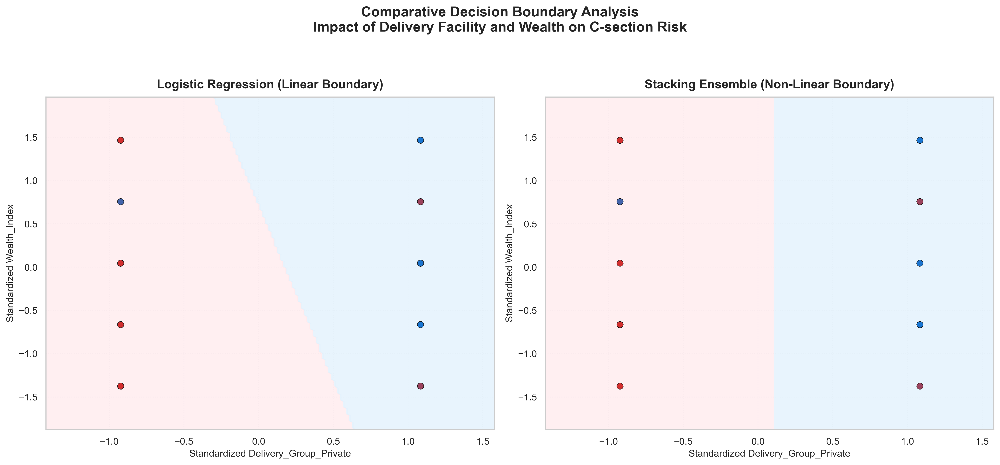

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.linear_model import LogisticRegression

# --- Decision Boundary Visualization: Linear vs. Non-Linear Classifiers ---
# This script visualizes how the Stacking Ensemble creates a more complex 
# decision space compared to the linear constraints of Logistic Regression.

# 1. Feature Selection: Choosing the two most influential predictors from SHAP analysis
# Using 'Delivery_Group_Private' and 'Wealth_Index' as the 2D plane for visualization.
feat_1_name = 'Delivery_Group_Private'
feat_2_name = 'Wealth_Index'

# Identifying indices within the final feature mask
feat_1_idx = selected_feature_names.index(feat_1_name)
feat_2_idx = selected_feature_names.index(feat_2_name)

# 2. Data Preparation: Slicing the scaled test features for a 2D subset
X_subset = X_test_final[:, [feat_1_idx, feat_2_idx]]
y_subset = y_test.values

# 3. Baseline Model Training: Fitting a Logistic Regression on the 2D subspace
# This allows us to see the "pure" linear boundary for these two variables.
lr_2d = LogisticRegression(solver='liblinear')
lr_2d.fit(X_subset, y_subset)

# 4. Meshgrid Construction: Defining the coordinate space for the boundary
h = .02  # Step size for the grid
x_min, x_max = X_subset[:, 0].min() - 0.5, X_subset[:, 0].max() + 0.5
y_min, y_max = X_subset[:, 1].min() - 0.5, X_subset[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# 5. Aesthetic Setup: Professional Color Palette
# Soft Red/Blue for regions, Bold Red/Blue for data points
cmap_background = ListedColormap(['#FFEBEE', '#E3F2FD']) 
cmap_points = ListedColormap(['#D32F2F', '#1976D2'])     

# 6. Comparative Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=300)

models_to_plot = {
    'Logistic Regression (Linear Boundary)': lr_2d,
    'Stacking Ensemble (Non-Linear Boundary)': stacking_model
}

for i, (name, model) in enumerate(models_to_plot.items()):
    if 'Logistic' in name:
        # Standard 2D prediction for the baseline
        Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    else:
        # For the Stacking Ensemble, we hold other features constant at their Mean 
        # to isolate the interaction between the two chosen variables.
        means = np.mean(X_test_final, axis=0)
        X_grid_full = np.tile(means, (len(xx.ravel()), 1))
        X_grid_full[:, feat_1_idx] = xx.ravel()
        X_grid_full[:, feat_2_idx] = yy.ravel()
        Z = model.predict(X_grid_full)

    Z = Z.reshape(xx.shape)
    
    # Rendering the decision regions
    axes[i].contourf(xx, yy, Z, cmap=cmap_background, alpha=0.8)
    
    # Overlaying a subset of actual data points (n=200) for context
    scatter = axes[i].scatter(X_subset[:200, 0], X_subset[:200, 1], c=y_subset[:200], 
                               cmap=cmap_points, edgecolors='k', s=50, alpha=0.7, linewidth=0.5)
    
    # Formatting
    axes[i].set_title(name, fontsize=14, fontweight='bold', pad=10)
    axes[i].set_xlabel(f"Standardized {feat_1_name}", fontsize=11)
    axes[i].set_ylabel(f"Standardized {feat_2_name}", fontsize=11)
    axes[i].grid(True, linestyle=':', alpha=0.4)

# Global Figure Aesthetics
plt.suptitle("Comparative Decision Boundary Analysis\nImpact of Delivery Facility and Wealth on C-section Risk", 
             fontsize=16, fontweight='bold', y=1.05)

plt.tight_layout()
plt.show()

In [99]:
# y_train এবং y_test মিলিয়ে মোট ৩২৫৫ টি স্যাম্পল হয়
y_final = pd.concat([y_train, y_test])

counts = y_final.value_counts()
percentages = y_final.value_counts(normalize=True) * 100

print(f"--- Final Dataset Distribution (n={len(y_final)}) ---")
print("-" * 40)
for index, count in counts.items():
    label = "C-section (1)" if index == 1 else "Normal (0)"
    print(f"{label}: {count} samples ({percentages[index]:.2f}%)")

--- Final Dataset Distribution (n=5052) ---
----------------------------------------
Normal (0): 2768 samples (54.79%)
C-section (1): 2284 samples (45.21%)


In [ ]:
#---------- ------------------------------------The End of my  Analysis-------------------------------------------